In [1]:
import numpy as np
import scipy.io
import os
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import statistics as st
import seaborn as sb
import scipy.stats as stats
from scipy.stats import fisher_exact
from sklearn.metrics import roc_auc_score as auROC
from sklearn.metrics import roc_curve, auc
import sklearn.metrics as ms
import random
from matplotlib.ticker import FormatStrFormatter
from matplotlib.ticker import MaxNLocator
from matplotlib.patches import Patch
import matplotlib.patches as patches
from matplotlib.patches import Rectangle
from matplotlib import gridspec
import psutil
import multiprocessing

from matplotlib_venn import venn3



In [2]:
import matplotlib as mpl
plt.rcParams['font.family'] = 'Liberation Sans'
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['text.color'] = 'k'
plt.rcParams['svg.fonttype'] = 'none'


In [3]:
base_dir = './extracted_data/Calcium/'
output_dir = './analysis_output'

FR = 20 #frame rate
CueN = 12 #number of cues
BinSize = 6 #frames per bin
TimeRange_before = 10 #time before event onset
TimeRange_after = 10 #time after event onset
Baseline_range = 10 #time to use as baseline, must <= TimeRange_before
Cueduration = 30 #total cue duration
CompareRange_base = 0.5 #time (s) before the cue for calculating z score change
CompareRange_after = 1.5 #time (s) after the cue for calculating z score change

FrameRange_before = int(FR*TimeRange_before)
FrameRange_after = int(FR*TimeRange_after)
FrameRange_baseline = int(FR*Baseline_range)
TotalFrame = int(FrameRange_before+FrameRange_after)
Bins = int(TotalFrame/BinSize)
Bins_before = int(FrameRange_before/BinSize)
Baseline_bins = Bins_before - int(FrameRange_baseline/BinSize)
Bins_cueend = Bins_before+int(FR*Cueduration/BinSize)

In [8]:
def read_pkl_files(base_dir):
    dataframes = []
    pkl_files = [file for file in os.listdir(base_dir) if file.endswith('.pkl')]

    for pkl_file in pkl_files:
        file_path = os.path.join(base_dir, pkl_file)
        df = pd.read_pickle(file_path)

        # Reset index and use the original index as 'cell_id'
        df.reset_index(inplace=True)
        df.rename(columns={'index': 'cell_id'}, inplace=True)
        
        # Extract animal ID from filename (assuming format 'AnimalID.pkl')
        animal_id = pkl_file.split('.')[0]
        
        # Add animal ID as a new column
        df['Animal_ID'] = animal_id

        # Reorder columns to make 'Animal_ID' front
        columns = ['Animal_ID', 'cell_id'] + [col for col in df.columns if col not in ['Animal_ID', 'cell_id']]
        df = df[columns]

        dataframes.append(df)

    return dataframes

all_dataframes = read_pkl_files(base_dir)


In [9]:
all_dataframes

[   Animal_ID                  cell_id         0    1    2        3         4  \
 0        6S5                        1  0.000000  0.0  0.0  0.00000  0.000000   
 1        6S5                        2  0.000000  0.0  0.0  0.00000  0.000000   
 2        6S5                        3  0.000000  0.0  0.0  0.00000  0.000000   
 3        6S5                        4  0.000000  0.0  0.0  0.00000  0.000000   
 4        6S5                        5  0.000000  0.0  0.0  0.00000  0.000000   
 ..       ...                      ...       ...  ...  ...      ...       ...   
 60       6S5                 Freezing  0.000000  0.0  0.0  0.00000  0.000000   
 61       6S5             In Food Area  1.000000  1.0  1.0  1.00000  1.000000   
 62       6S5         Bar Press active  0.000000  0.0  0.0  0.00000  0.000000   
 63       6S5  Miniscope record active  0.595041  1.0  0.3  0.96875  0.056604   
 64       6S5              Tone active  0.000000  0.0  0.0  0.00000  0.000000   
 
            5    6    7  .

# Permutation test

In [251]:
def calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=None):
    # Identifying cue onsets
    cue = df[df['cell_id'] == 'Tone active'].iloc[:, 2:].squeeze()
    cueonset = np.array(np.where(np.diff(np.concatenate(([0], cue > 0))) > 0)[0])
    if cue_range is not None:
        # Select a subset of cueonset based on cue_range
        if cue_range>0:
            cueonset = cueonset[:cue_range]
        elif cue_range<0:
            cueonset = cueonset[cue_range:]
    
    # Select rows where 'cell_id' is numeric and columns from the third column onwards
    trace = df[df['cell_id'].astype(str).str.isnumeric()].iloc[:, 2:]
#     trace = trace.sub(trace.mean(axis = 1), axis = 0).divide(trace.std(axis = 1), axis = 0)

    tracenew = pd.DataFrame(0, index=trace.index, columns=np.arange(TotalFrame))

    # Aligning traces based on cue onset
    for i in range(TotalFrame):
        start = cueonset - FrameRange_before + i
        valid_starts = start[start >= 0]  # Ensure start is not negative
        tracenew.iloc[:, i] = trace.iloc[:, valid_starts].mean(axis=1)

    # Bin the traces
    tracebin = tracenew.groupby(pd.cut(tracenew.columns, Bins), axis=1).mean()
    tracebin.columns = np.arange(0, Bins)
    
    # Calculate the mean and std, handle the situation of 0 std
    mean_vals = tracebin.iloc[:, Baseline_bins:Bins_before].mean(axis=1)
    std_vals = tracebin.iloc[:, Baseline_bins:Bins_before].std(axis=1)
    
    # Create a mask where the mean is < 0.001 or std is < 0.001
    low_variance_mask = (std_vals < 0.001) #(mean_vals < 0.001) | (std_vals < 0.001)
    
    # Replace std values that are 0 with NaN, as well as where the mean is < 0.001
    std_vals_replaced = std_vals.mask(low_variance_mask, np.nan)
    
    # Calculate Z-scores, NaN will result in the Z-scores where std is zero
    tracezscore = tracebin.sub(mean_vals, axis=0).divide(std_vals_replaced, axis=0)
    
    # Replace NaN Z-scores with 0, as these are the ones with std of 0
    tracezscore = tracezscore.fillna(0)

    return tracebin, tracezscore


In [252]:
hungrycue = 12

# Create a list to hold the dataframes
trace_hungry_list = []
trace_hungry_list_c = []

# Loop through each animal's DataFrame
for df in all_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id']  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=hungrycue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'cell_id']]
    tracebin = tracebin[columns]
    
    trace_hungry_list.append(tracesub)
    trace_hungry_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_hungry = pd.concat(trace_hungry_list, ignore_index=True)
trace_hungry_c = pd.concat(trace_hungry_list_c, ignore_index=True)




In [253]:
satiatedcue = -12

# Create a list to hold the dataframes
trace_satiated_list = []
trace_satiated_list_c = []

# Loop through each animal's DataFrame
for df in all_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id']  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore_satiation(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=satiatedcue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'cell_id']]
    tracebin = tracebin[columns]
    
    trace_satiated_list.append(tracesub)
    trace_satiated_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_satiated = pd.concat(trace_satiated_list, ignore_index=True)
trace_satiated_c = pd.concat(trace_satiated_list_c, ignore_index=True)



In [254]:
trace_hungry

,Animal_ID,cell_id,0,1,2,3,4,5,6,7,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,-0.974356,-1.036490,-1.091343,-1.143929,-1.194341,-1.242669,-1.269454,-1.306804,...,-0.266947,-0.308855,-0.352319,-0.389579,-0.461036,-0.526811,-0.602732,-0.675516,-0.700053,-0.751454
1,6S5,2,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,-0.867709,-0.848311,...,2.944911,2.857944,2.584875,2.047427,2.060740,2.149064,1.723274,2.655658,3.060550,3.285084
2,6S5,3,1.162811,1.060209,0.978639,0.825957,0.676933,1.006085,1.231004,1.353798,...,16.338843,15.991282,15.647480,15.307396,15.011186,14.822836,14.617208,14.510671,14.186479,13.835385
3,6S5,4,0.552738,0.341283,0.095955,-0.134774,-0.351774,-0.174224,-0.388876,-0.358703,...,8.961927,8.230150,7.515375,6.843135,6.210898,5.616283,5.080222,5.604845,6.244997,7.236901
4,6S5,5,0.105960,0.052360,-0.021338,-0.186413,-0.425214,-0.617182,-0.695160,-0.699846,...,-2.267180,-2.236629,-1.877391,-1.288693,-1.043495,-1.113494,-1.101320,-1.054556,-1.217426,-1.357268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,-1.010739,-1.068321,-1.116711,-1.160988,-1.201501,-1.238571,-0.553179,0.436075,...,-1.562624,-1.568999,-1.574832,-1.580170,-1.585053,-1.589522,-1.593610,-1.597352,-1.600775,-1.604152
1107,8H6,71,-0.577090,-0.675036,-0.758042,-0.834600,-0.905210,-0.970334,-1.030398,-1.085797,...,-1.267579,-1.264059,-1.301304,-1.335656,-1.367339,-1.396560,-1.423511,-1.448369,-1.320394,-1.284156
1108,8H6,73,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1109,8H6,75,2.538170,1.966359,1.517038,1.131163,0.799775,0.515181,0.270773,0.133675,...,0.838804,0.548699,0.299558,0.085598,-0.098151,-0.255953,-0.391473,-0.507857,-0.607806,-0.700043


1111 neurons in Combined


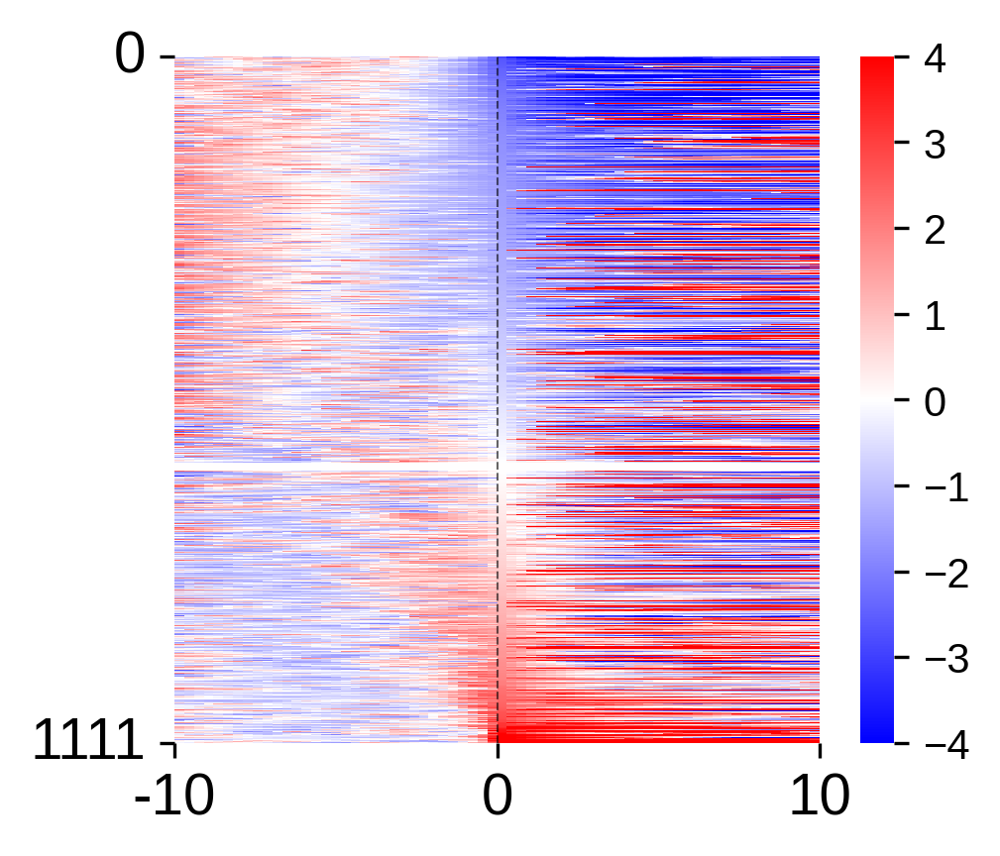

In [255]:
# Sorting and creating the heatmap
tracesorted = trace_hungry.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Combined")

plt.show()

1111 neurons in Combined


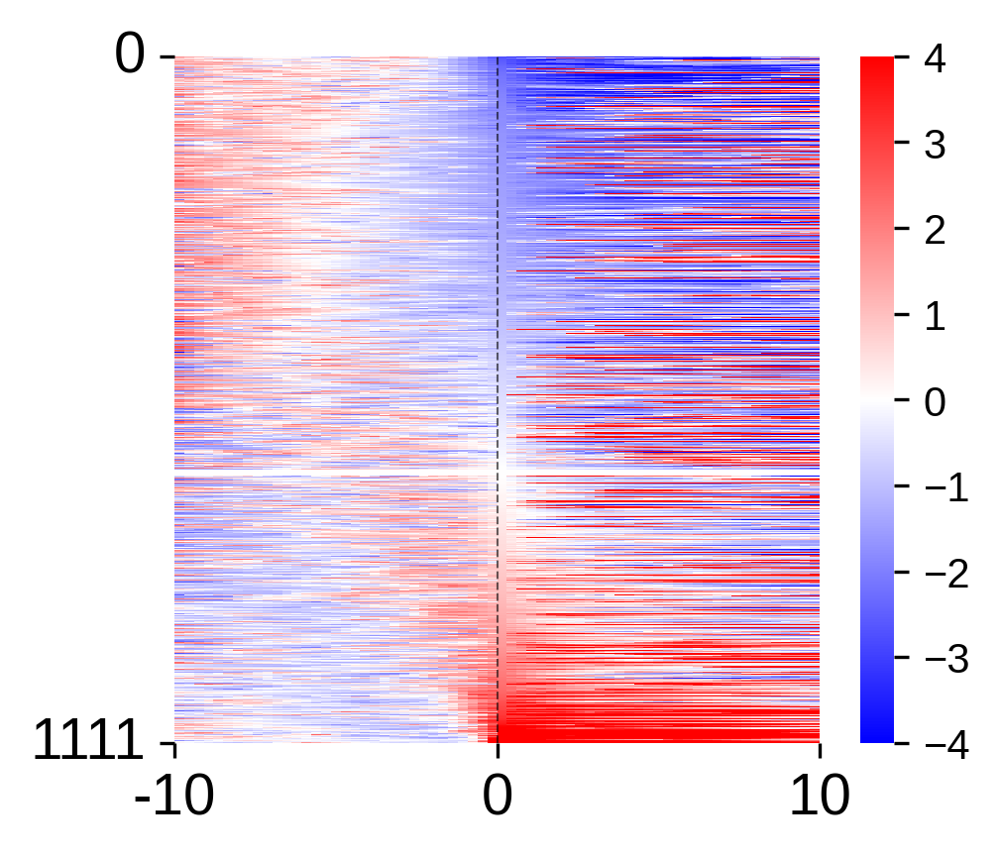

In [256]:
# Sorting and creating the heatmap
tracesorted = trace_satiated.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Combined")

plt.show()

In [258]:
def calculate_changes(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range, num_shifts=1000, seed=999):
    random.seed(seed)
    cue = df[df['cell_id'] == 'Tone active'].iloc[:, 2:].squeeze()
    cueonset = np.array(np.where(np.diff(np.concatenate(([0], cue > 0))) > 0)[0])
    if cue_range is not None:
        # Select a subset of cueonset based on cue_range
        if cue_range>0:
            cueonset = cueonset[:cue_range]
        elif cue_range<0:
            cueonset = cueonset[cue_range:]
            
    trace = df[df['cell_id'].astype(str).str.isnumeric()].iloc[:, 2:]
#     trace = trace.sub(trace.mean(axis = 1), axis =0).divide(trace.std(axis = 1), axis =0)
    change_values_all = np.zeros((len(trace), num_shifts))

    for j in range(num_shifts):
        shift = random.randint(0, len(trace.columns))
        shifted_trace = np.roll(trace.values, shift, axis=1)
        tracenew = pd.DataFrame(0, index=trace.index, columns=np.arange(TotalFrame))

        # Use shifted_trace for calculations
        for i in range(TotalFrame):
            start = cueonset - FrameRange_before + i
            valid_starts = start[start >= 0]
            # Apply mean calculation on the shifted_trace
            tracenew.iloc[:,i] = shifted_trace[:, valid_starts].mean(axis=1)
        

        tracebin = tracenew.groupby(pd.cut(tracenew.columns, Bins), axis=1).mean()
        tracebin.columns = np.arange(0, Bins)
        
        # Calculate the mean and std, handle the situation of 0 std
        mean_vals = tracebin.iloc[:, 0:Bins_before].mean(axis=1)
        std_vals = tracebin.iloc[:, 0:Bins_before].std(axis=1)
        
        # Create a mask where the mean is < 0.001 or std is < 0.001
        low_variance_mask = (std_vals < 0.001) #(mean_vals < 0.001) | (std_vals < 0.001)

        # Replace std values that are 0 with NaN, as well as where the mean is < 0.001
        std_vals_replaced = std_vals.mask(low_variance_mask, np.nan)
    
        # Calculate Z-scores, NaN will result in the Z-scores where std is zero
        tracezscore = tracebin.sub(mean_vals, axis=0).divide(std_vals_replaced, axis=0)
        
        # Replace NaN Z-scores with 0, as these are the ones with std of 0
        tracezscore = tracezscore.fillna(0)

        before_shift = tracezscore.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)) : Bins_before].mean(axis=1)
        after_shift = tracezscore.iloc[:, Bins_before : (Bins_before + int(CompareRange_after * FR / BinSize))].mean(axis=1)
        change = after_shift - before_shift
        change_values_all[:, j] = change

    return change_values_all

def worker_process(data):
    FrameRange_before, TotalFrame, Bins, Bins_before, cue_range = data[0], data[1], data[2], data[3], data[4]
    return calculate_changes(data[5], FrameRange_before, TotalFrame, Bins, Bins_before, cue_range)

def parallel_process_and_calculate_change(all_dataframes, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range):
    # Determining the number of processes based on available CPU cores
    num_processes = psutil.cpu_count(logical=False)

    # Create a multiprocessing pool and process data
    pool = multiprocessing.Pool(processes=num_processes)
    results = pool.map(worker_process, [(FrameRange_before, TotalFrame, Bins, Bins_before, cue_range, df) for df in all_dataframes])
    pool.close()
    pool.join()

    # Flatten list of results and convert to DataFrame
    final_df = pd.concat([pd.DataFrame(result) for result in results], ignore_index=True)
    return final_df




In [259]:
%%time
change_shift_hungry = parallel_process_and_calculate_change(all_dataframes, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=hungrycue)

CPU times: user 246 ms, sys: 688 ms, total: 934 ms
Wall time: 1min 38s


In [260]:
change_shift_hungry

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,-0.200742,1.195665,2.379801,0.530221,1.738085,0.055927,0.091003,0.075814,-0.964233,-0.334106,...,-0.444884,0.062738,0.046186,-0.450304,-0.508926,-0.614463,-0.338229,-0.397747,-0.068169,-0.184404
1,-0.383282,-0.286457,-0.464573,-0.384004,-0.336347,1.046139,-0.253835,-0.502230,-0.065127,-0.153280,...,-0.077211,-1.198879,0.302315,-0.188175,-0.095802,1.872731,-0.016107,1.368362,0.641672,0.360401
2,-0.049496,-0.733557,-1.056172,-0.473966,0.309043,-0.271327,-0.216845,-0.764842,0.344258,-1.012469,...,-0.066732,-0.252240,-0.266987,-0.169469,-0.505909,-0.298161,-0.166531,11.110493,-0.602943,-0.565268
3,-0.006260,-0.365218,0.357794,-0.168405,0.070439,0.065430,-0.289655,0.179535,0.184290,-0.141877,...,0.059659,6.042632,-0.383916,-0.585484,-0.264387,-1.250925,-0.291565,3.520658,-0.220651,-0.806023
4,0.667751,-0.164856,2.752642,3.004521,-0.277262,0.095195,-0.729565,0.614368,0.247838,1.096920,...,-0.400436,0.084429,-0.554652,2.425078,-1.375440,-0.383124,-0.047118,0.065537,0.230094,-0.505304
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,-0.211758,-0.313730,-0.265039,-0.202398,-0.059556,-0.364863,4.816494,-0.227444,-0.067829,-0.075381,...,14.439719,0.000000,-0.520054,0.253745,-0.052117,-0.139960,-0.047931,-0.052596,-0.047931,-0.047931
1107,-0.308586,-0.227274,0.100304,0.128830,-0.566177,-0.204977,-0.057767,-0.590200,-0.057767,0.000000,...,-0.057767,-0.166140,0.079772,0.098282,-0.323348,-0.459774,-0.087601,-0.347043,-0.205380,-0.078153
1108,0.000000,0.000000,0.000000,0.000000,-0.017143,-0.017143,-0.660258,-0.046960,-0.017143,0.000000,...,0.000000,0.000000,-0.267697,0.000000,0.000000,0.000000,0.000000,-0.110591,0.000000,0.000000
1109,0.000000,-0.018628,-1.160571,0.000000,-0.009737,-1.241515,-0.281838,-0.207295,-0.022239,0.000000,...,-0.025707,-0.148474,-0.887211,0.000000,-0.566979,1.439709,-0.552603,-0.009737,-1.312992,-0.888357


In [261]:
before_hungry = trace_hungry.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_hungry = trace_hungry.iloc[:,Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_hungry = after_hungry.mean(axis= 1) - before_hungry.mean(axis=1)

excited_hungry = pd.DataFrame()
inhibited_hungry = pd.DataFrame()
excitedsem_hungry = pd.DataFrame()
inhibitedsem_hungry = pd.DataFrame()

excited_indices = []
inhibited_indices = []

for i in range(len(trace_hungry)):
    change = change_hungry.iloc[i]
    change_dist = change_shift_hungry.iloc[i, :]

    if change > np.quantile(change_dist, 0.975): 
        excited_indices.append(i)
    elif change < np.quantile(change_dist, 0.025): 
        inhibited_indices.append(i)

# Using .iloc to select rows and then concat to form the final DataFrame
excited_hungry = pd.concat([trace_hungry.iloc[i] for i in excited_indices], axis=1).T
inhibited_hungry = pd.concat([trace_hungry.iloc[i] for i in inhibited_indices], axis=1).T

excited_hungry = excited_hungry[(excited_hungry.iloc[:,Bins_before+2:Bins_before+int(CompareRange_after*FR/BinSize)+2]>0.5).any(axis =1)]

inhibited_hungry = inhibited_hungry[(inhibited_hungry.iloc[:, Bins_before+2:Bins_before+int(CompareRange_after*FR/BinSize)+2]< -0.5).any(axis =1)]

excited_indices = excited_hungry.index.values.tolist()
inhibited_indices = inhibited_hungry.index.values.tolist()


excited_hungry_mean = excited_hungry.iloc[:,2:].mean(axis=0).astype('float')
excited_hungry_sem = excited_hungry.iloc[:,2:].sem(axis=0).astype('float')
inhibited_hungry_mean = inhibited_hungry.iloc[:,2:].mean(axis=0).astype('float')
inhibited_hungry_sem = inhibited_hungry.iloc[:,2:].sem(axis=0).astype('float')

excited_hungry_median = excited_hungry.iloc[:,2:].median(axis=0).astype('float')
excited_hungry_mad =  excited_hungry.iloc[:,2:].sub(excited_hungry_median, axis=0).abs().median(axis=0).astype('float')

In [262]:
excited_hungry_mean

0      0.456760
1      0.326215
2      0.301072
3      0.295354
4      0.260149
        ...    
61    19.019910
62    19.912859
63    22.088013
64    21.770124
65    21.066728
Length: 66, dtype: float64

37

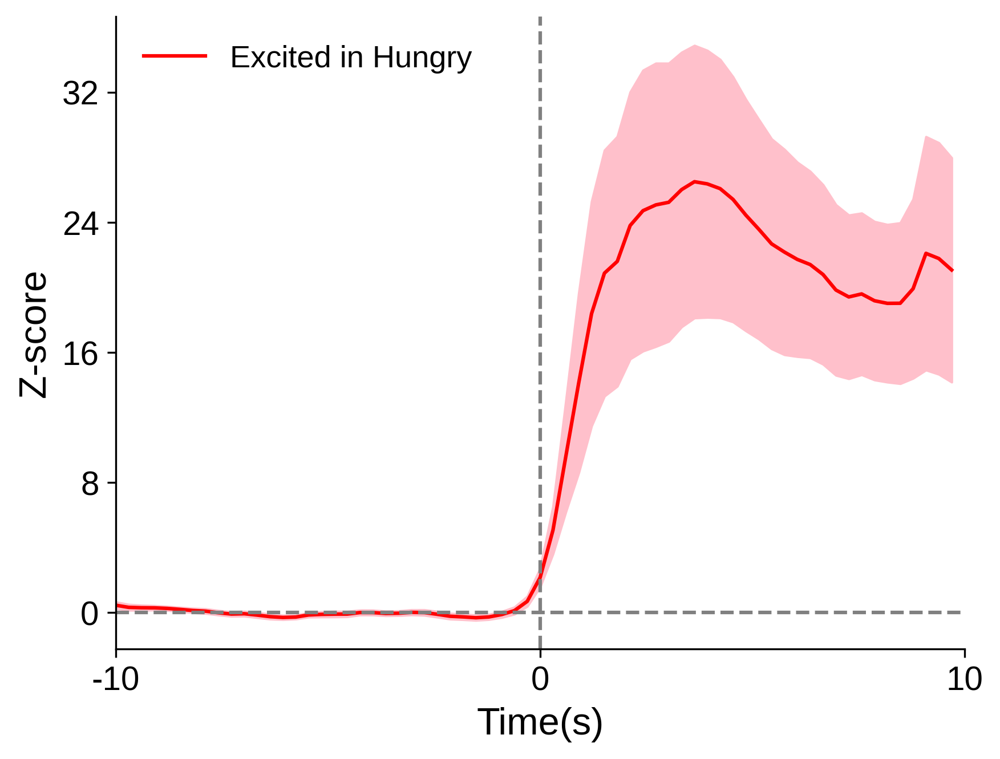

In [263]:
x=np.arange(Bins)
y=excited_hungry_mean
err = excited_hungry_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_hungry)

31

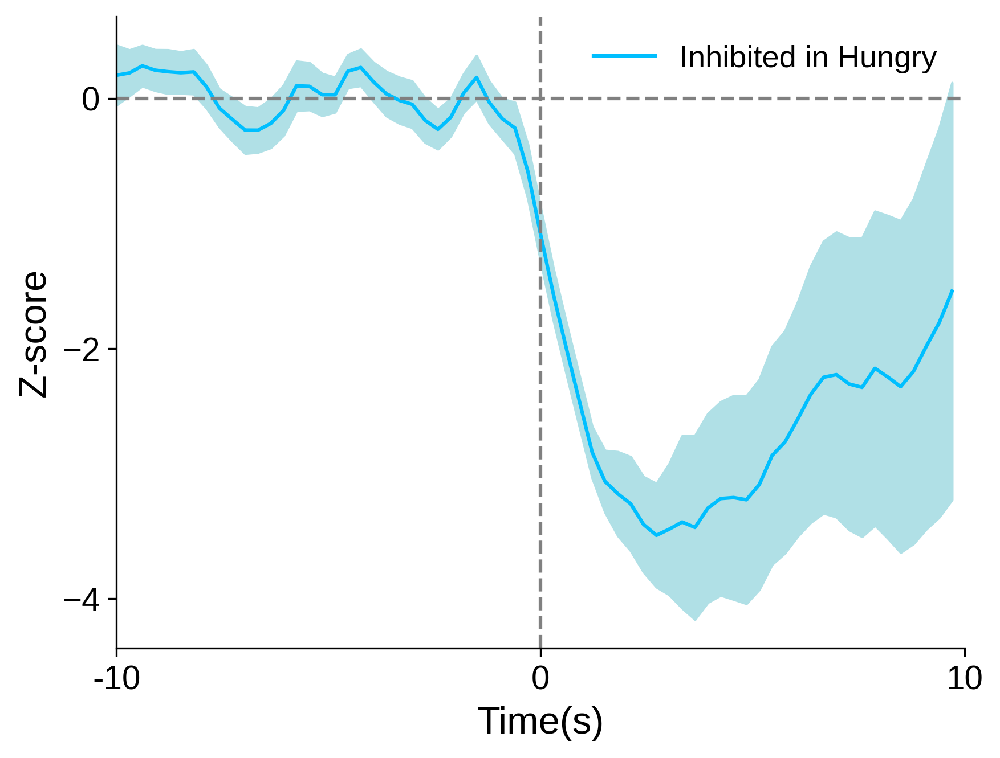

In [264]:
x=np.arange(Bins)
y=inhibited_hungry_mean
err = inhibited_hungry_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in Hungry', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


37

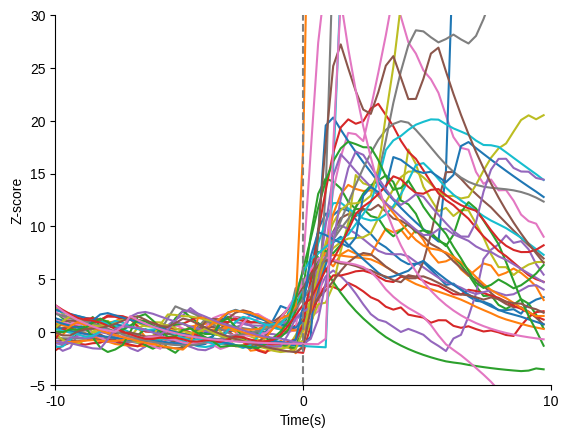

In [265]:
x=np.arange(Bins)
y=excited_hungry.iloc[:,2:]
err = excited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


31

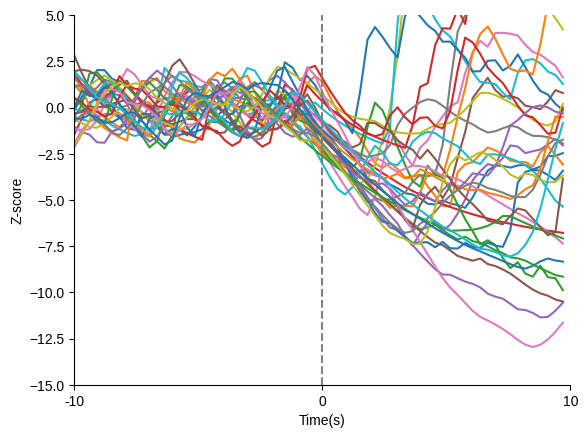

In [266]:
x=np.arange(Bins)
y=inhibited_hungry.iloc[:,2:]
err = inhibited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

[Text(0, 0, '0'), Text(0, 31, '31')]

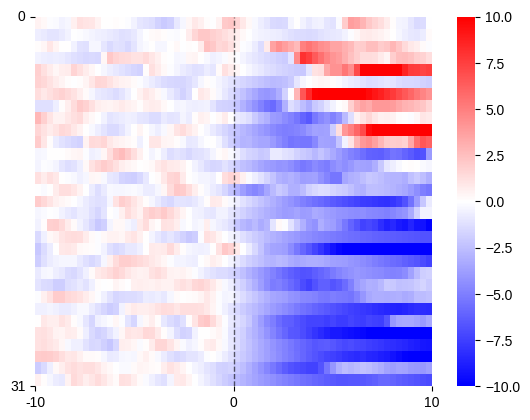

In [267]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_hungry_sort = inhibited_hungry.copy()
inhibited_hungry_sort['count_gt_2'] = (inhibited_hungry_sort.iloc[:, Bins_before + 2:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_hungry_sorted = inhibited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(inhibited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_hungry_sorted)])
ax.set_yticklabels([0, len(inhibited_hungry_sorted)])

[Text(0, 0, '0'), Text(0, 37, '37')]

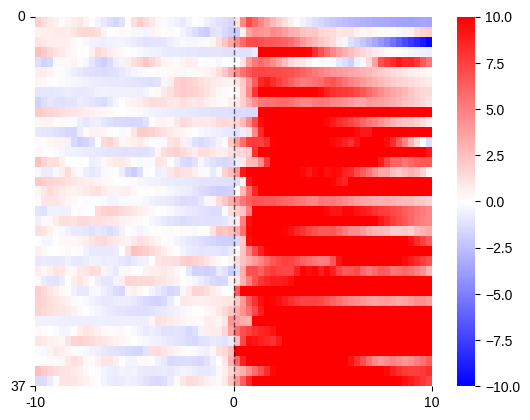

In [268]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_hungry_sort = excited_hungry.copy()
excited_hungry_sort['count_gt_2'] = (excited_hungry_sort.iloc[:, Bins_before + 2:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_hungry_sorted = excited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(excited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_hungry_sorted)])
ax.set_yticklabels([0, len(excited_hungry_sorted)])

In [272]:
%%time
change_shift_satiated = parallel_process_and_calculate_change(all_dataframes, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=satiatedcue)

CPU times: user 229 ms, sys: 523 ms, total: 752 ms
Wall time: 1min 37s


In [273]:
change_shift_satiated

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,-0.166160,-1.135320,-0.358756,-0.249757,0.093282,-0.579723,-0.428886,0.086141,-0.554615,-0.514781,...,-0.214756,-0.250606,0.514665,0.637463,3.410512,-0.279026,-0.557427,-0.960373,-0.432860,1.714159
1,1.851697,-0.674259,-0.042681,-0.933265,0.208750,-0.207151,-0.476133,-0.494358,-0.393384,-0.402265,...,0.327630,-0.449098,0.469305,-0.277213,-0.332877,-0.117065,0.021072,0.159804,-1.024673,0.197584
2,0.281542,1.440295,-0.258894,-0.045135,-1.098231,-0.898748,0.819118,-0.206397,0.302781,-0.050947,...,0.646762,0.031668,-0.269305,-0.060153,-0.304321,-0.875796,0.251890,-3.009647,-0.352944,0.142726
3,-0.874800,1.243436,-0.400743,-0.104755,-0.200189,0.272707,0.212144,0.596822,-0.239439,0.371979,...,0.504324,0.105848,-0.397397,-0.052547,-0.049974,-0.091083,-0.253157,-1.295115,-0.132248,-0.040955
4,-0.013077,1.084979,2.011794,-0.443735,-0.421662,-0.360405,-0.170837,-0.407732,-0.557690,0.705600,...,-0.573609,0.191029,0.445581,-0.408731,-0.115202,0.688681,0.224323,-0.852908,-0.720436,-0.271854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,-0.097104,0.000000,-0.344340,-0.244700,0.000000,0.000000,-0.047923,-0.047931,0.876635,-0.711629,...,-0.445438,-0.047931,-0.047931,0.000000,-0.078451,-0.195544,0.248092,-0.047931,-0.195440,-0.230467
1107,-0.283889,-0.450015,0.000000,-0.831616,-0.057767,2.741618,0.256634,6.023540,-0.222924,-0.269936,...,0.218968,-0.242326,0.457226,-0.388701,-0.057767,-0.139401,-0.203943,-0.121250,0.074552,-0.525078
1108,-0.017143,-0.462904,-0.073832,-0.053143,0.000000,-0.144227,-0.017143,-0.608498,-0.017143,0.000000,...,0.000000,0.000000,0.000000,-0.408537,0.000000,-0.017143,0.000000,0.000000,0.000000,0.000000
1109,-0.035015,-0.229512,-0.351349,-0.236445,-0.032461,-0.239464,0.000000,1.997833,-0.009737,4.519820,...,-0.054608,-0.257298,-0.198237,-0.018979,-0.009737,-0.030605,0.000000,-0.250396,-0.846367,-0.013520


In [274]:
before_satiated = trace_satiated.iloc[:, (Bins_before - int(CompareRange_base * FR / BinSize)+2) : Bins_before+2]
after_satiated = trace_satiated.iloc[:,Bins_before+2:(Bins_before+int(CompareRange_after*FR/BinSize)+2)]
change_satiated = after_satiated.mean(axis= 1) - before_satiated.mean(axis=1)

excited_satiated = pd.DataFrame()
inhibited_satiated = pd.DataFrame()


excited_satiated_indices = []
inhibited_satiated_indices = []

for i in range(len(trace_satiated)):
    change = change_satiated.iloc[i]
    change_dist = change_shift_satiated.iloc[i, :]

    if change > np.quantile(change_dist, 0.975): 
        excited_satiated_indices.append(i)
    elif change < np.quantile(change_dist, 0.025): 
        inhibited_satiated_indices.append(i)

# Using .iloc to select rows and then concat to form the final DataFrame
excited_satiated = pd.concat([trace_satiated.iloc[i] for i in excited_satiated_indices], axis=1).T
inhibited_satiated = pd.concat([trace_satiated.iloc[i] for i in inhibited_satiated_indices], axis=1).T

excited_satiated = excited_satiated[(excited_satiated.iloc[:,Bins_before+2:Bins_before+int(CompareRange_after*FR/BinSize)+2]>0.5).any(axis =1)]

inhibited_satiated = inhibited_satiated[(inhibited_satiated.iloc[:, Bins_before+2:Bins_before+int(CompareRange_after*FR/BinSize)+2]< -0.5).any(axis =1)]

excited_satiated_indices = excited_satiated.index.values.tolist()
inhibited_satiated_indices = inhibited_satiated.index.values.tolist()


excited_satiated_mean = excited_satiated.iloc[:,2:].mean(axis=0).astype('float')
excited_satiated_sem = excited_satiated.iloc[:,2:].sem(axis=0).astype('float')
inhibited_satiated_mean = inhibited_satiated.iloc[:,2:].mean(axis=0).astype('float')
inhibited_satiated_sem = inhibited_satiated.iloc[:,2:].sem(axis=0).astype('float')


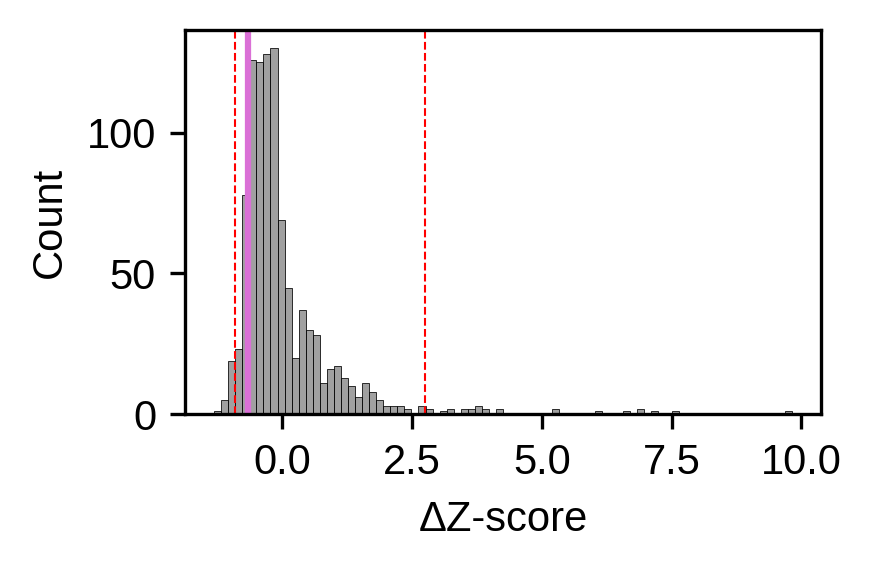

In [288]:
fig, ax = plt.subplots(figsize = (3, 2),dpi =300)
sb.histplot(change_shift_hungry.iloc[excited_satiated_indices[14]], color = 'gray', ax = ax)
ax.axvline(change_hungry.iloc[excited_satiated_indices[14]], color = "orchid")
ax.axvline(np.quantile(change_shift_hungry.iloc[excited_satiated_indices[14]], 0.025), color = "red", ls = '--', lw = 0.5)
ax.axvline(np.quantile(change_shift_hungry.iloc[excited_satiated_indices[14]], 0.975), color = "red", ls = '--', lw = 0.5)
ax.set_xlabel("ΔZ-score")

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_hungry_permutation.svg", transparent=True, bbox_inches = 'tight')



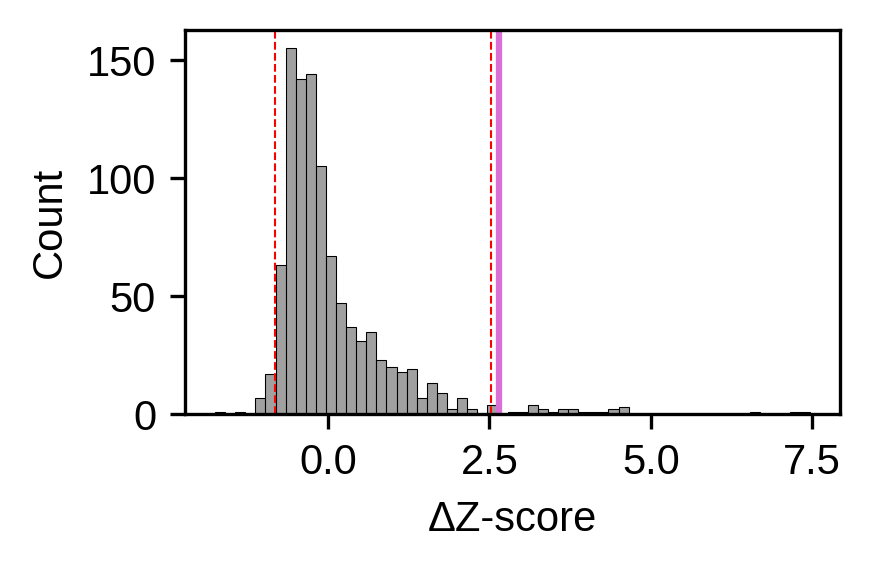

In [289]:
fig, ax = plt.subplots(figsize = (3, 2),dpi =300)
sb.histplot(change_shift_satiated.iloc[excited_satiated_indices[14]], color = 'gray', ax = ax)
ax.axvline(change_satiated.iloc[excited_satiated_indices[14]], color = "orchid")
ax.axvline(np.quantile(change_shift_satiated.iloc[excited_satiated_indices[14]], 0.025), color = "red", ls = '--', lw = 0.5)
ax.axvline(np.quantile(change_shift_satiated.iloc[excited_satiated_indices[14]], 0.975), color = "red", ls = '--', lw = 0.5)
ax.set_xlabel("ΔZ-score")

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_satiated_permutation.svg", transparent=True, bbox_inches = 'tight')



41

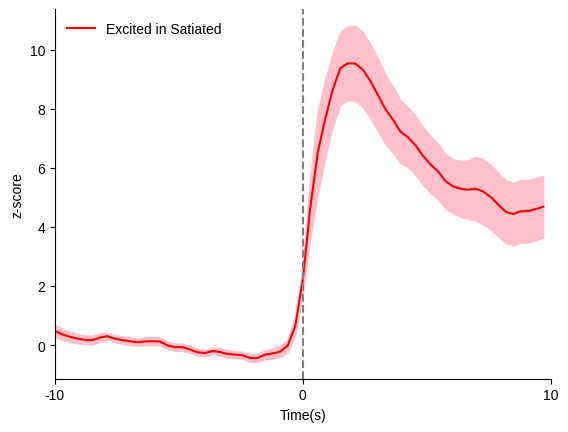

In [71]:
x=np.arange(Bins)
y=excited_satiated_mean
err = excited_satiated_sem
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Excited in Satiated', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0)
len(excited_satiated)

18

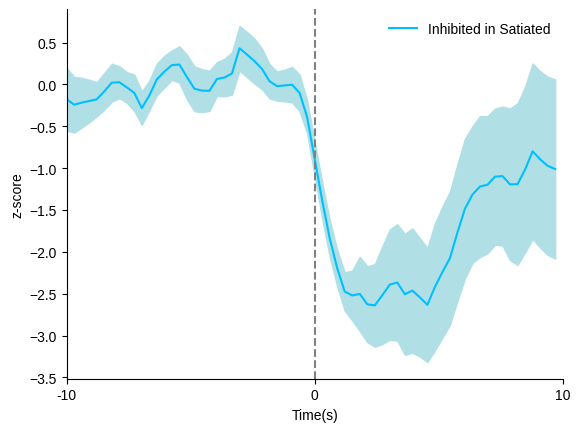

In [72]:
x=np.arange(Bins)
y=inhibited_satiated_mean
err = inhibited_satiated_sem
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Inhibited in Satiated', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-,1)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


41

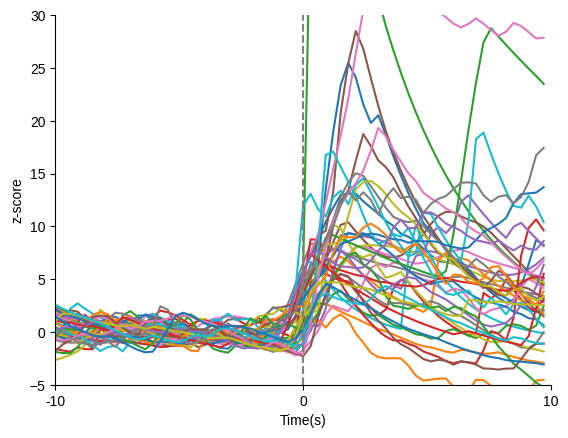

In [73]:
x=np.arange(Bins)
y=excited_satiated.iloc[:,2:]
err = excited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


18

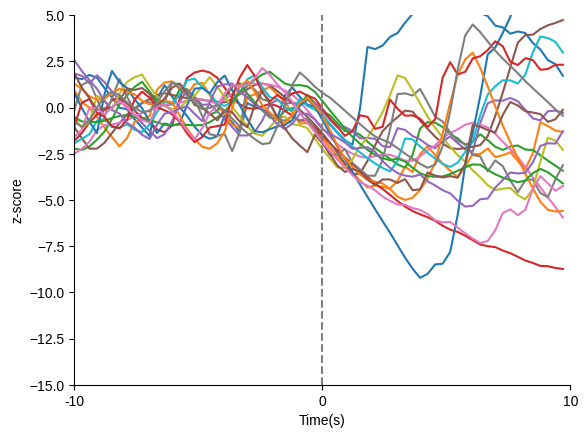

In [74]:
x=np.arange(Bins)
y=inhibited_satiated.iloc[:,2:]
err = inhibited_satiated_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated)

[Text(0, 0, '0'), Text(0, 18, '18')]

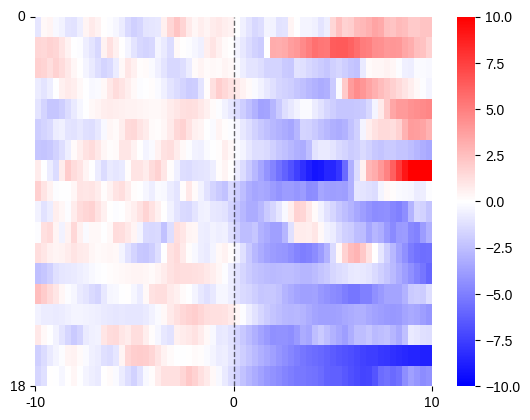

In [75]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_satiated_sort = inhibited_satiated.copy()
inhibited_satiated_sort['count_gt_2'] = (inhibited_satiated_sort.iloc[:, Bins_before + 2:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_satiated_sorted = inhibited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(inhibited_satiated_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_satiated_sorted)])
ax.set_yticklabels([0, len(inhibited_satiated_sorted)])

[Text(0, 0, '0'), Text(0, 41, '41')]

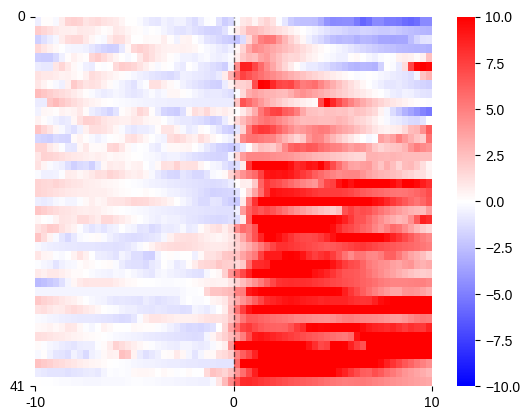

In [76]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_satiated_sort = excited_satiated.copy()
excited_satiated_sort['count_gt_2'] = (excited_satiated_sort.iloc[:, Bins_before + 2:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_satiated_sorted = excited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(excited_satiated_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_satiated_sorted)])
ax.set_yticklabels([0, len(excited_satiated_sorted)])

37

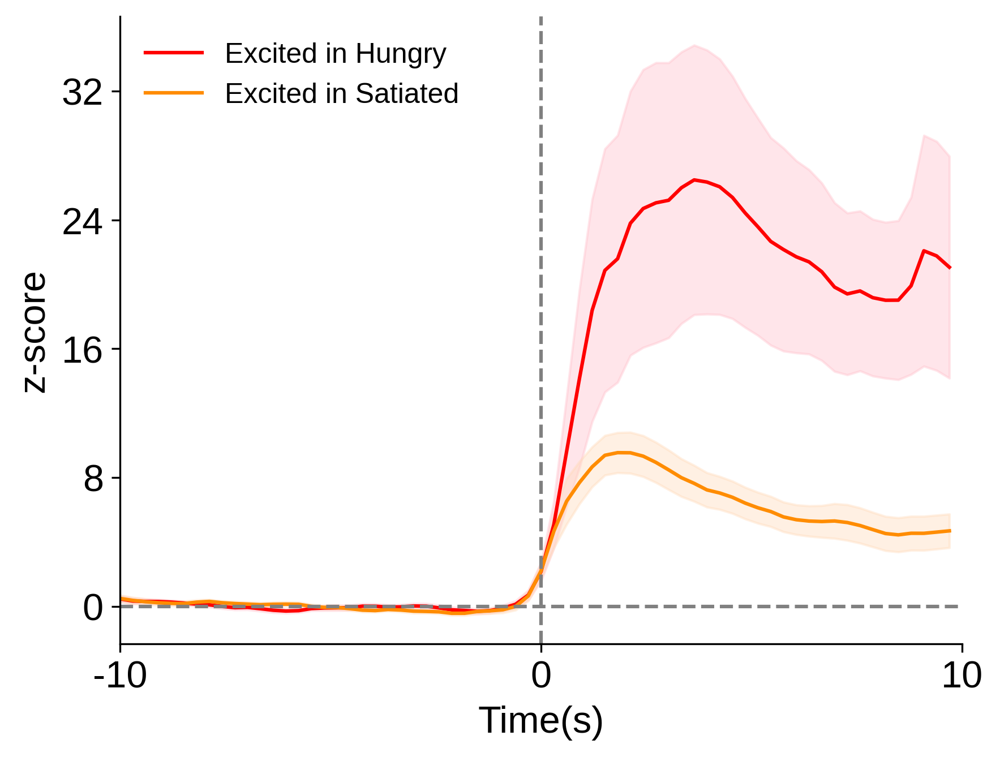

In [77]:
x=np.arange(Bins)
y=excited_hungry_mean
z=excited_satiated_mean
erry = excited_hungry_sem
errz = excited_satiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Excited in Satiated', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry)

31

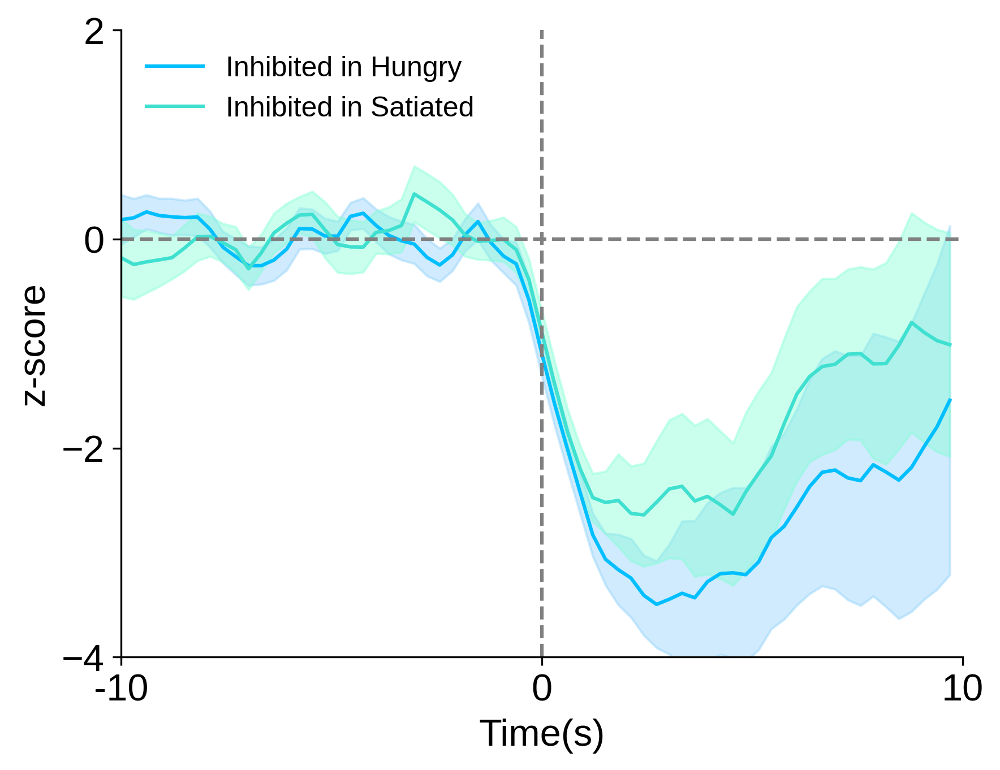

In [78]:
x=np.arange(Bins)
y=inhibited_hungry_mean
z=inhibited_satiated_mean
erry = inhibited_hungry_sem
errz = inhibited_satiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Inhibited in Hungry', color = 'deepskyblue')
ax.plot(x, z, label = 'Inhibited in Satiated', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

In [79]:
excited_hungry_insatiated_mean = trace_satiated.iloc[excited_indices, 2:].mean(axis=0)
excited_hungry_insatiated_sem =  trace_satiated.iloc[excited_indices, 2:].sem(axis=0)
inhibited_hungry_insatiated_mean = trace_satiated.iloc[inhibited_indices, 2:].mean(axis=0)
inhibited_hungry_insatiated_sem =  trace_satiated.iloc[inhibited_indices, 2:].sem(axis=0)
excited_satiated_inhungry_mean = trace_hungry.iloc[excited_satiated_indices, 2:].mean(axis=0)
excited_satiated_inhungry_sem =  trace_hungry.iloc[excited_satiated_indices, 2:].sem(axis=0)
inhibited_satiated_inhungry_mean = trace_hungry.iloc[inhibited_satiated_indices, 2:].mean(axis=0)
inhibited_satiated_inhungry_sem =  trace_hungry.iloc[inhibited_satiated_indices, 2:].sem(axis=0)

37

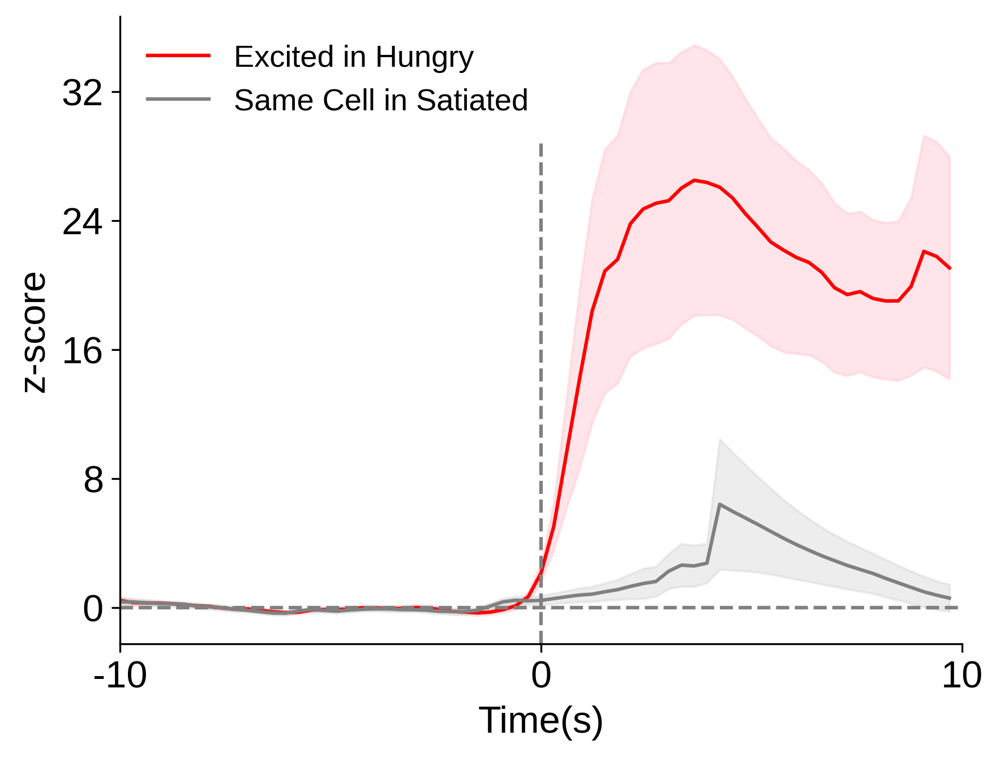

In [80]:
x=np.arange(Bins)
y=excited_hungry_mean
z=excited_hungry_insatiated_mean
erry = excited_hungry_sem
errz = excited_hungry_insatiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Same Cells in Satiated', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry)

31

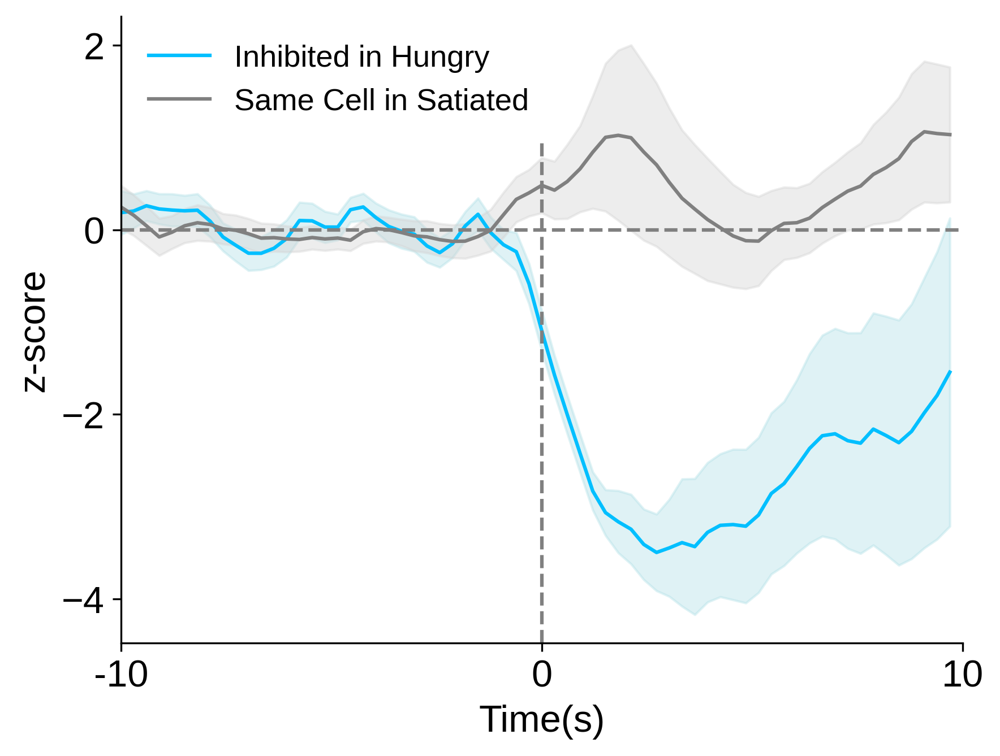

In [81]:
x=np.arange(Bins)
y=inhibited_hungry_mean
z=inhibited_hungry_insatiated_mean
erry = inhibited_hungry_sem
errz = inhibited_hungry_insatiated_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Hungry', color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Satiated', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

41

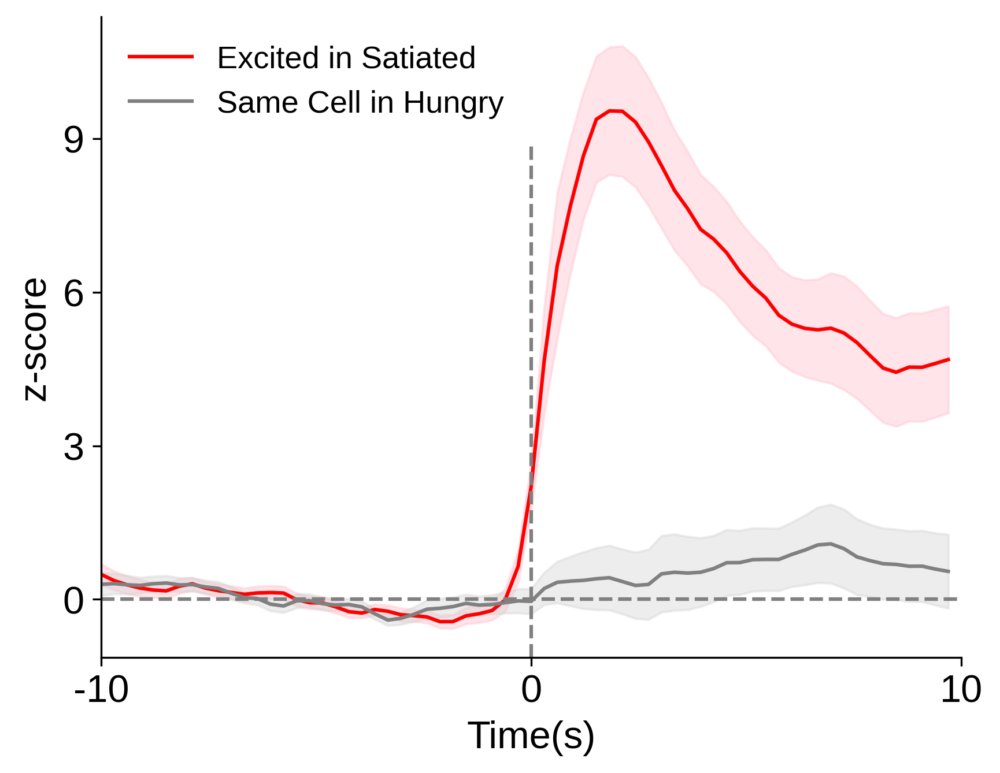

In [82]:
x=np.arange(Bins)
y=excited_satiated_mean
z=excited_satiated_inhungry_mean
erry = excited_satiated_sem
errz = excited_satiated_inhungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Satiated',color='red')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated)

18

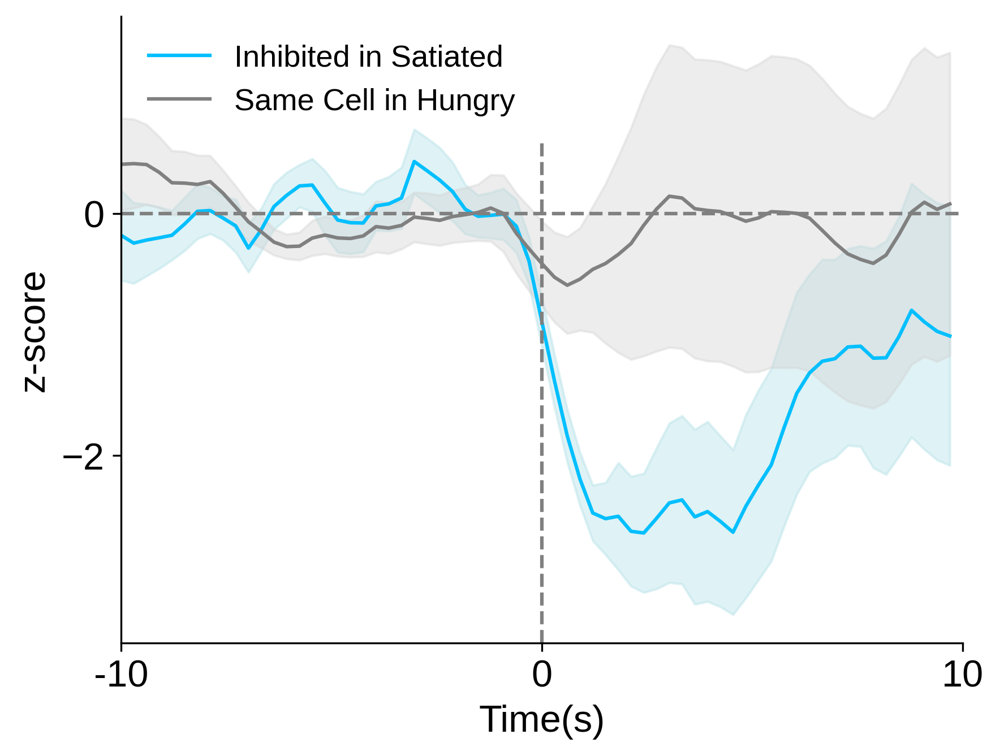

In [83]:
x=np.arange(Bins)
y=inhibited_satiated_mean
z=inhibited_satiated_inhungry_mean
erry = inhibited_satiated_sem
errz = inhibited_satiated_inhungry_sem
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Satiated',color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated)

In [84]:
hungrycells = np.append(excited_indices, inhibited_indices)
satiatedcells = np.append(excited_satiated_indices, inhibited_satiated_indices)

In [85]:
len(np.intersect1d(hungrycells, satiatedcells))

4

In [86]:
len((satiatedcells))

59

In [87]:
len((hungrycells))

68

In [88]:
trace_hungry.iloc[excited_indices].to_csv(os.path.join(output_dir, 'Excited_Hungry.csv'))
trace_hungry.iloc[inhibited_indices].to_csv(os.path.join(output_dir, 'Inhibited_Hungry.csv'))

In [89]:
trace_satiated.iloc[excited_satiated_indices].to_csv(os.path.join(output_dir, 'Excited_Satiated.csv'))
trace_satiated.iloc[inhibited_satiated_indices].to_csv(os.path.join(output_dir, 'Inhibited_Satiated.csv'))

## Visualization (run on saved csv files)

In [14]:
def calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=None):
    # Identifying cue onsets
    cue = df[df['cell_id'] == 'Tone active'].iloc[:, 2:].squeeze()
    cueonset = np.array(np.where(np.diff(np.concatenate(([0], cue > 0))) > 0)[0])
    if cue_range is not None:
        # Select a subset of cueonset based on cue_range
        if cue_range>0:
            cueonset = cueonset[:cue_range]
        elif cue_range<0:
            cueonset = cueonset[cue_range:]
            
    # Select rows where 'cell_id' is numeric and columns from the third column onwards
    trace = df[df['cell_id'].astype(str).str.isnumeric()].iloc[:, 2:]
#     trace = trace.sub(trace.mean(axis = 1), axis = 0).divide(trace.std(axis = 1), axis = 0)

    tracenew = pd.DataFrame(0, index=trace.index, columns=np.arange(TotalFrame))

    # Aligning traces based on cue onset
    for i in range(TotalFrame):
        start = cueonset - FrameRange_before + i
        valid_starts = start[start >= 0]  # Ensure start is not negative
        tracenew.iloc[:, i] = trace.iloc[:, valid_starts].mean(axis=1)

    # Bin the traces
    tracebin = tracenew.groupby(pd.cut(tracenew.columns, Bins), axis=1).mean()
    tracebin.columns = np.arange(0, Bins)
    
    # Calculate the mean and std, handle the situation of 0 std
    mean_vals = tracebin.iloc[:, Baseline_bins:Bins_before].mean(axis=1)
    std_vals = tracebin.iloc[:, Baseline_bins:Bins_before].std(axis=1)
    
    # Create a mask where the mean is < 0.001 or std is < 0.001
    low_variance_mask = (std_vals < 0.001) #(mean_vals < 0.001) | (std_vals < 0.001)
    
    # Replace std values that are 0 with NaN, as well as where the mean is < 0.001
    std_vals_replaced = std_vals.mask(low_variance_mask, np.nan)
    
    # Calculate Z-scores, NaN will result in the Z-scores where std is zero
    tracezscore = tracebin.sub(mean_vals, axis=0).divide(std_vals_replaced, axis=0)
    
    # Replace NaN Z-scores with 0, as these are the ones with std of 0
    tracezscore = tracezscore.fillna(0)

    return tracebin, tracezscore


In [15]:
hungrycue = 12

# Create a list to hold the dataframes
trace_hungry_list = []
trace_hungry_list_c = []

# Loop through each animal's DataFrame
for df in all_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id']  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=hungrycue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'cell_id']]
    tracebin = tracebin[columns]
    
    trace_hungry_list.append(tracesub)
    trace_hungry_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_hungry = pd.concat(trace_hungry_list, ignore_index=True)
trace_hungry_c = pd.concat(trace_hungry_list_c, ignore_index=True)




In [16]:
satiatedcue = -12

# Create a list to hold the dataframes
trace_satiated_list = []
trace_satiated_list_c = []

# Loop through each animal's DataFrame
for df in all_dataframes:
    animal_id = df['Animal_ID'].iloc[0]  # Extract animal ID
    cell_ids = df['cell_id']  # Extract cell IDs

    tracebin, tracesub = calculate_traces_zscore(df, FrameRange_before, TotalFrame, Bins, Bins_before, cue_range=satiatedcue)
    tracesub['Animal_ID'] = animal_id  # Add animal ID
    tracesub['cell_id'] = cell_ids  # Add cell IDs
    tracebin['Animal_ID'] = animal_id  # Add animal ID
    tracebin['cell_id'] = cell_ids  # Add cell IDs
    
    # Reorder columns to make 'Animal_ID' front
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracesub.columns if col not in ['Animal_ID', 'cell_id']]
    tracesub = tracesub[columns]
    columns = ['Animal_ID', 'cell_id'] + [col for col in tracebin.columns if col not in ['Animal_ID', 'cell_id']]
    tracebin = tracebin[columns]
    
    trace_satiated_list.append(tracesub)
    trace_satiated_list_c.append(tracebin)

# Concatenate all dataframes in the list
trace_satiated = pd.concat(trace_satiated_list, ignore_index=True)
trace_satiated_c = pd.concat(trace_satiated_list_c, ignore_index=True)



In [17]:
trace_hungry

,Animal_ID,cell_id,0,1,2,3,4,5,6,7,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,-0.974356,-1.036490,-1.091343,-1.143929,-1.194341,-1.242669,-1.269454,-1.306804,...,-0.266947,-0.308855,-0.352319,-0.389579,-0.461036,-0.526811,-0.602732,-0.675516,-0.700053,-0.751454
1,6S5,2,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,-0.867709,-0.848311,...,2.944911,2.857944,2.584875,2.047427,2.060740,2.149064,1.723274,2.655658,3.060550,3.285084
2,6S5,3,1.162811,1.060209,0.978639,0.825957,0.676933,1.006085,1.231004,1.353798,...,16.338843,15.991282,15.647480,15.307396,15.011186,14.822836,14.617208,14.510671,14.186479,13.835385
3,6S5,4,0.552738,0.341283,0.095955,-0.134774,-0.351774,-0.174224,-0.388876,-0.358703,...,8.961927,8.230150,7.515375,6.843135,6.210898,5.616283,5.080222,5.604845,6.244997,7.236901
4,6S5,5,0.105960,0.052360,-0.021338,-0.186413,-0.425214,-0.617182,-0.695160,-0.699846,...,-2.267180,-2.236629,-1.877391,-1.288693,-1.043495,-1.113494,-1.101320,-1.054556,-1.217426,-1.357268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,-1.010739,-1.068321,-1.116711,-1.160988,-1.201501,-1.238571,-0.553179,0.436075,...,-1.562624,-1.568999,-1.574832,-1.580170,-1.585053,-1.589522,-1.593610,-1.597352,-1.600775,-1.604152
1107,8H6,71,-0.577090,-0.675036,-0.758042,-0.834600,-0.905210,-0.970334,-1.030398,-1.085797,...,-1.267579,-1.264059,-1.301304,-1.335656,-1.367339,-1.396560,-1.423511,-1.448369,-1.320394,-1.284156
1108,8H6,73,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1109,8H6,75,2.538170,1.966359,1.517038,1.131163,0.799775,0.515181,0.270773,0.133675,...,0.838804,0.548699,0.299558,0.085598,-0.098151,-0.255953,-0.391473,-0.507857,-0.607806,-0.700043


1111 neurons in Combined


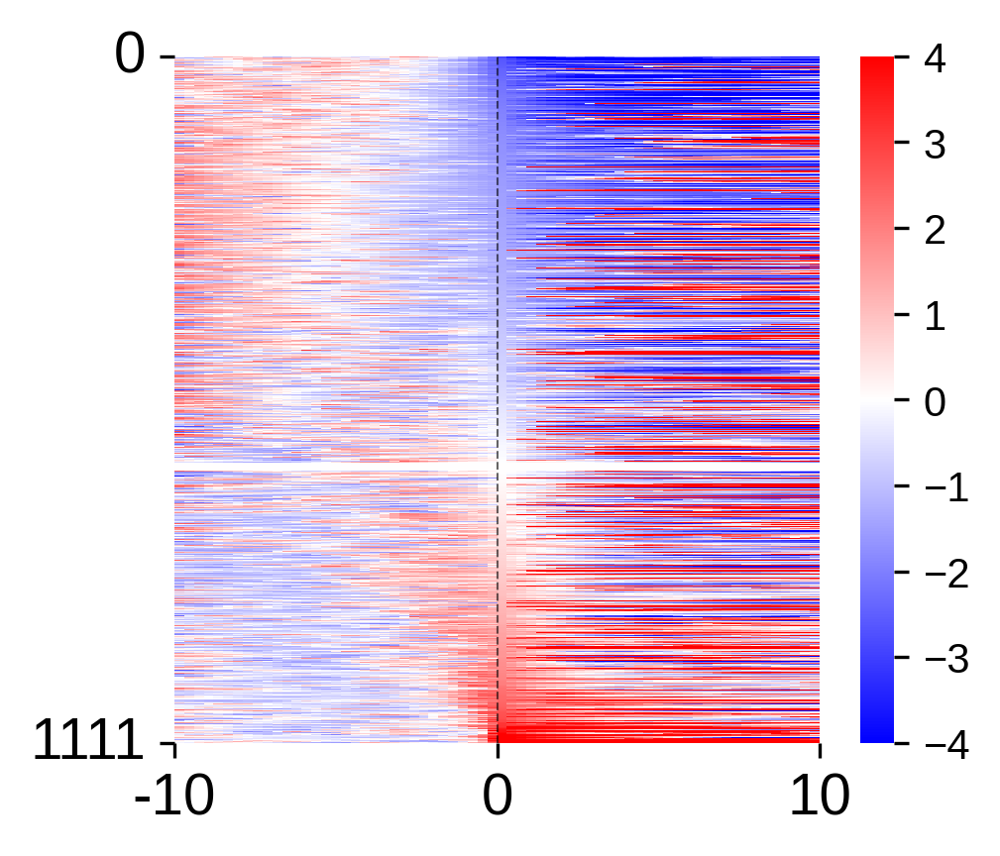

In [18]:
# Sorting and creating the heatmap
tracesorted = trace_hungry.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Combined")

plt.show()

1111 neurons in Combined


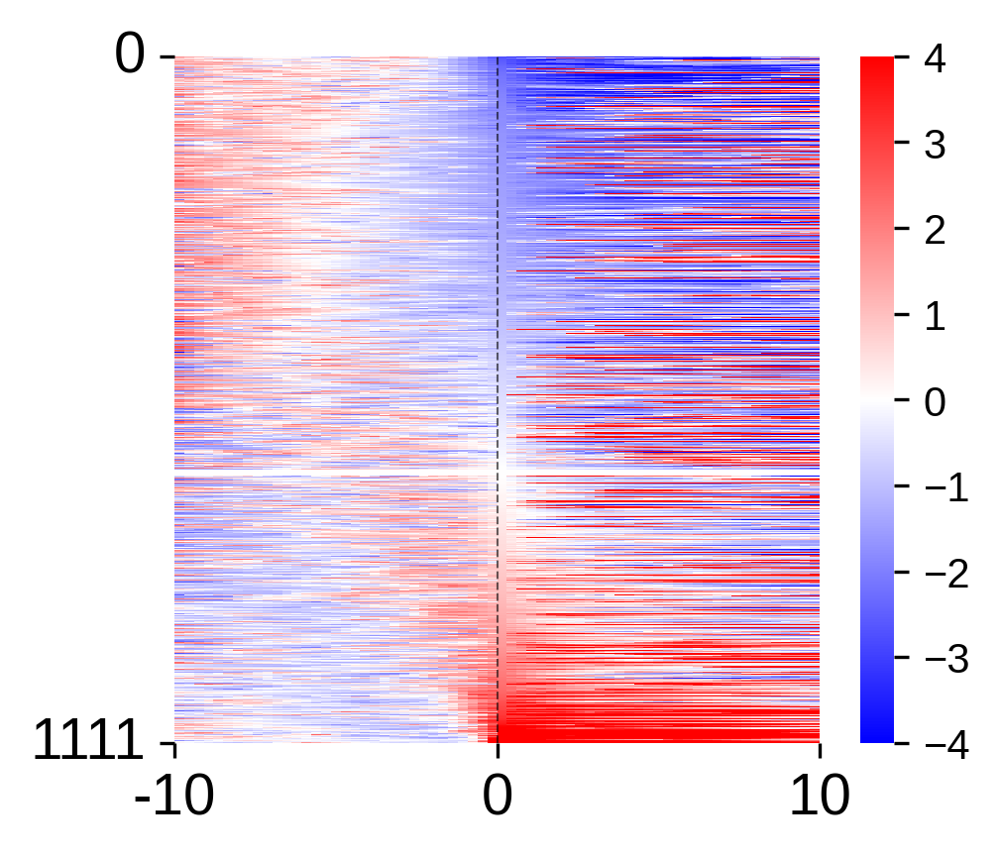

In [19]:
# Sorting and creating the heatmap
tracesorted = trace_satiated.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 2:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry)} neurons in Combined")

plt.show()

In [20]:

excited_hungry = pd.read_csv(os.path.join(output_dir, 'Excited_Hungry.csv'), index_col= 0)
inhibited_hungry = pd.read_csv(os.path.join(output_dir, 'Inhibited_Hungry.csv'), index_col= 0)

excited_indices = excited_hungry.index.values.tolist()
inhibited_indices = inhibited_hungry.index.values.tolist()


excited_hungry_mean = excited_hungry.iloc[:,2:].mean(axis=0).astype('float')
excited_hungry_sem = excited_hungry.iloc[:,2:].sem(axis=0).astype('float')
inhibited_hungry_mean = inhibited_hungry.iloc[:,2:].mean(axis=0).astype('float')
inhibited_hungry_sem = inhibited_hungry.iloc[:,2:].sem(axis=0).astype('float')

excited_hungry_median = excited_hungry.iloc[:,2:].median(axis=0).astype('float')
excited_hungry_mad =  excited_hungry.iloc[:,2:].sub(excited_hungry_median, axis=0).abs().median(axis=0).astype('float')

In [21]:
excited_hungry_mean

0      0.456760
1      0.326215
2      0.301072
3      0.295354
4      0.260149
        ...    
61    19.019910
62    19.912859
63    22.088013
64    21.770124
65    21.066728
Length: 66, dtype: float64

37

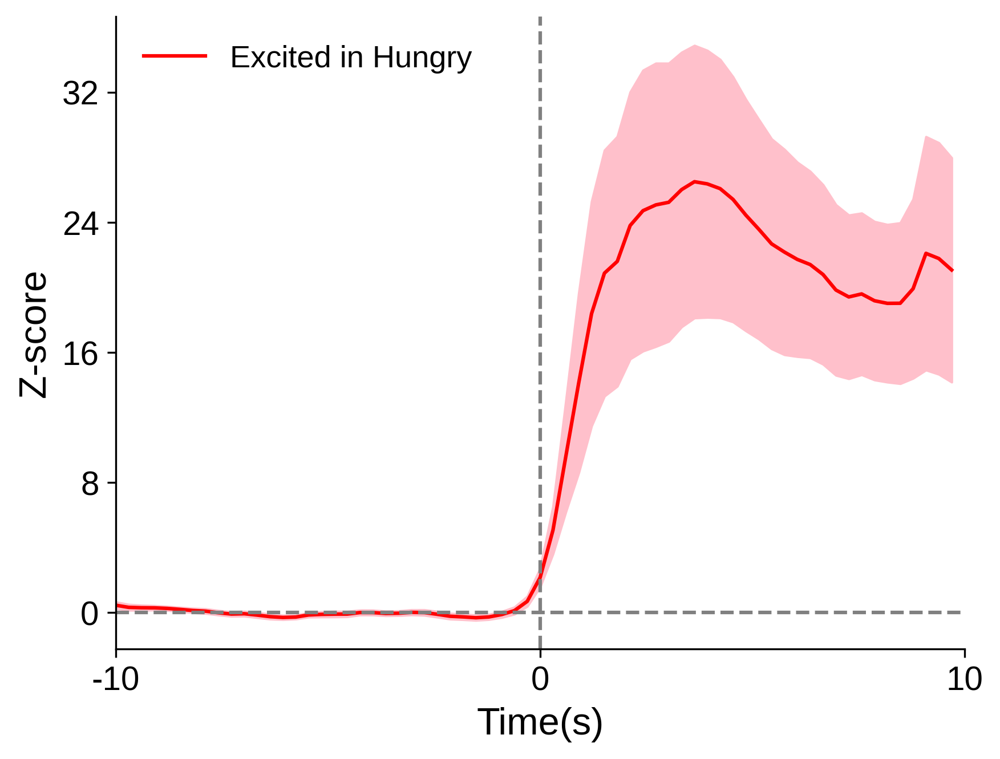

In [22]:
x=np.arange(Bins)
y=excited_hungry_mean
err = excited_hungry_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_hungry)

31

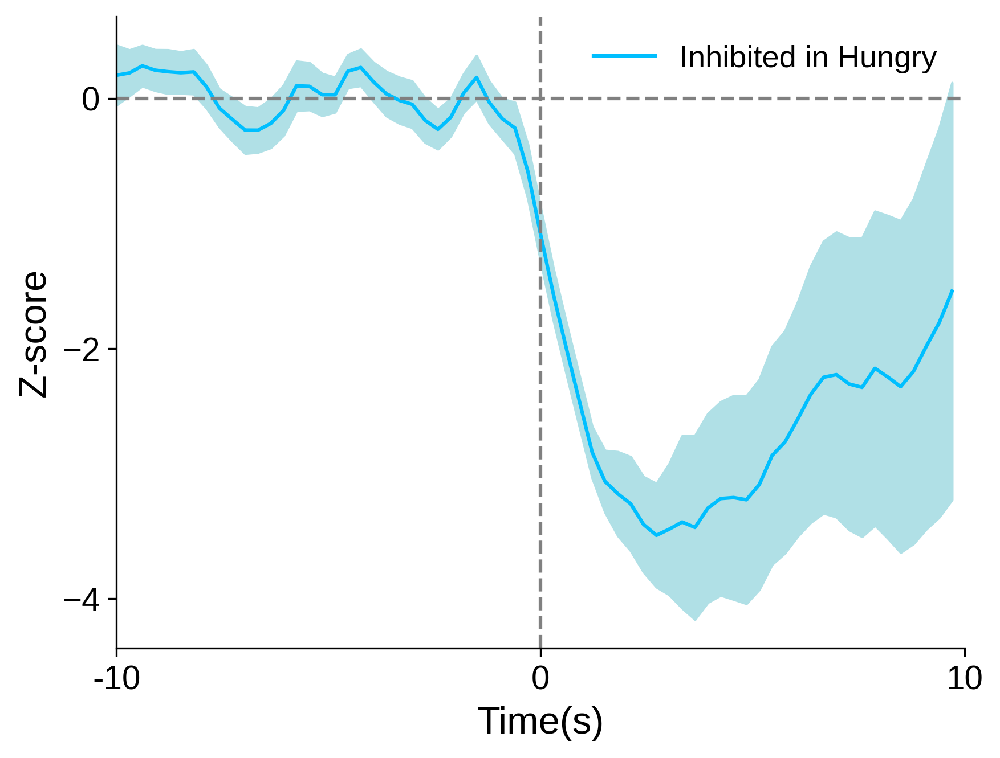

In [23]:
x=np.arange(Bins)
y=inhibited_hungry_mean
err = inhibited_hungry_sem
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in Hungry', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


37

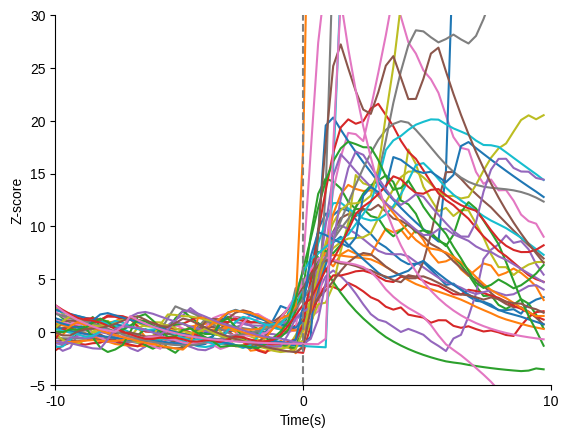

In [24]:
x=np.arange(Bins)
y=excited_hungry.iloc[:,2:]
err = excited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


31

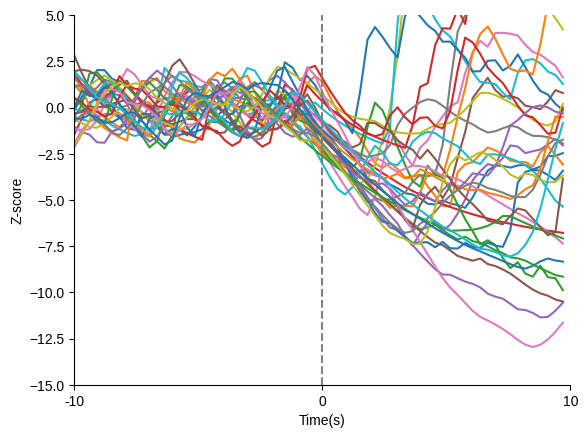

In [25]:
x=np.arange(Bins)
y=inhibited_hungry.iloc[:,2:]
err = inhibited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry)

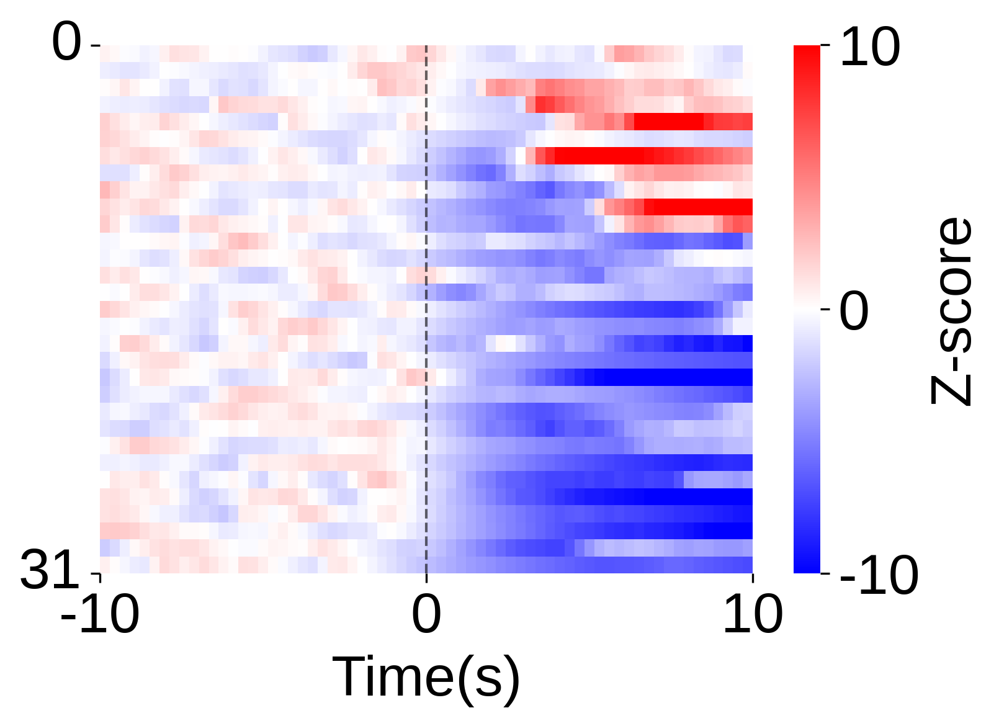

In [26]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_hungry_sort = inhibited_hungry.copy()
inhibited_hungry_sort['count_gt_2'] = (inhibited_hungry_sort.iloc[:, Bins_before + 2:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_hungry_sorted = inhibited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

fig, ax = plt.subplots(figsize=(5.5,4), dpi = 300)
ax = sb.heatmap(inhibited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_hungry_sorted)])
ax.set_yticklabels([0, len(inhibited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 22)
# ax.set_ylabel('Neuron ID', fontsize = 22)

ax.tick_params(labelsize = 22)
cbar = ax.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 22)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_hungry_heatmap.svg", transparent=True)


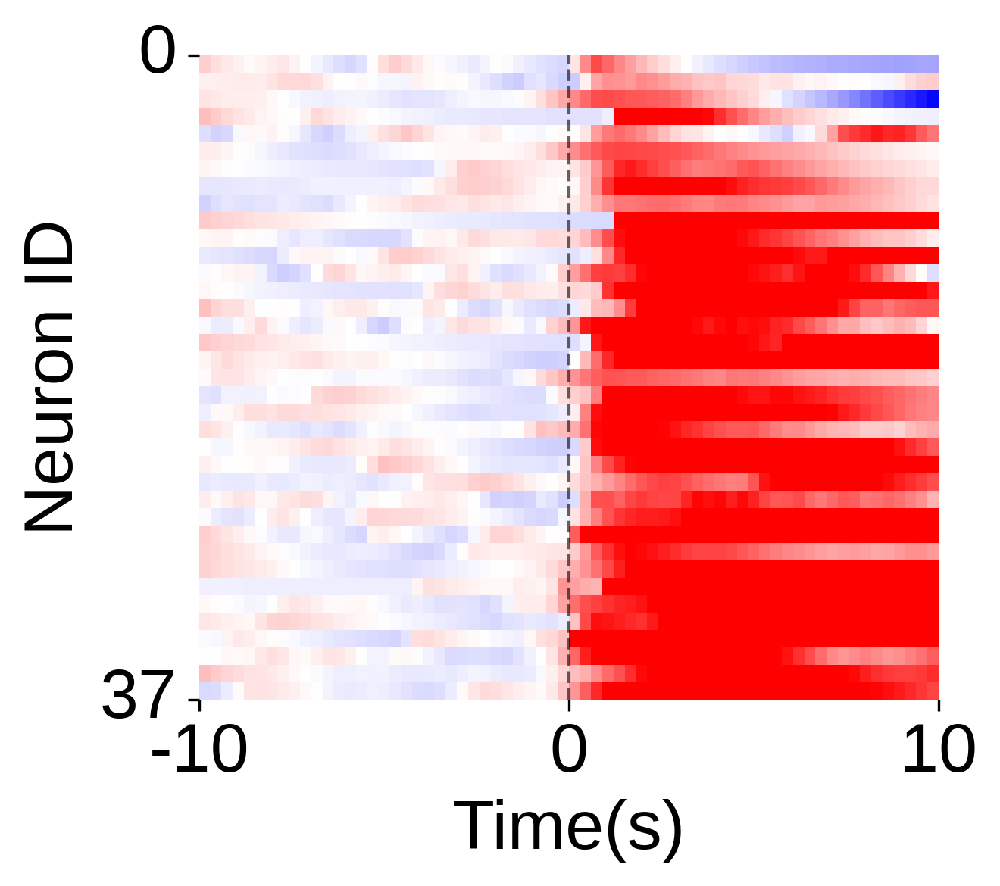

In [27]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_hungry_sort = excited_hungry.copy()
excited_hungry_sort['count_gt_2'] = (excited_hungry_sort.iloc[:, Bins_before + 2:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_hungry_sorted = excited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)
fig, ax = plt.subplots(figsize=(4.5,4),dpi = 300)
ax = sb.heatmap(excited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr", cbar= False)
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_hungry_sorted)])
ax.set_yticklabels([0, len(excited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 22)
ax.set_ylabel('Neuron ID', fontsize = 22)

ax.tick_params(labelsize = 22)
# cbar = ax.collections[0].colorbar
# ticks = [-10,0,10]
# cbar.set_ticks(ticks)
# cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)
# cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 22)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_heatmap.svg", transparent=True)



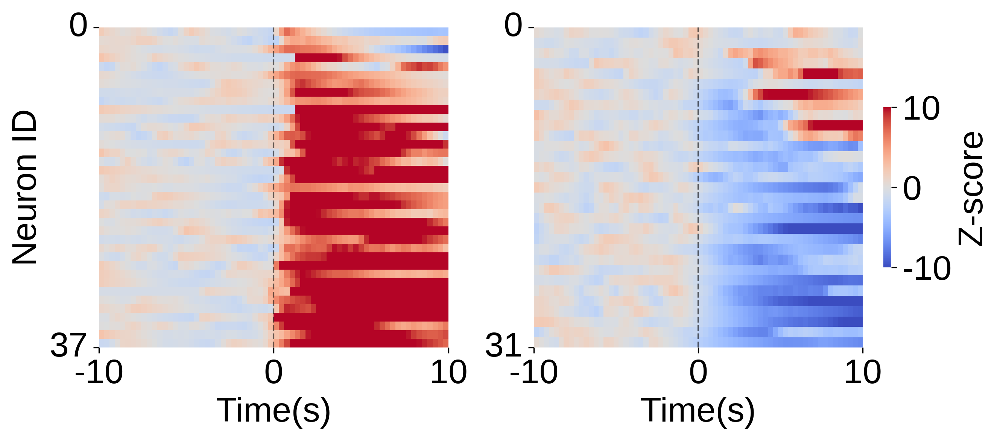

In [28]:
width_ratios = [excited_hungry_sorted.shape[1]*0.85, inhibited_hungry_sorted.shape[1]]
fig = plt.figure(figsize=(9, 4), dpi=300)
gs = gridspec.GridSpec(1, 2, width_ratios=width_ratios)

# Create axes for the subplots with the gridspec
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

sb.heatmap(excited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "coolwarm", cbar= False, ax = ax1)
ax1.set_xticks([0,Bins_before,Bins])
ax1.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax1.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax1.set_yticks([0,len(excited_hungry_sorted)])
ax1.set_yticklabels([0, len(excited_hungry_sorted)])
ax1.set_xlabel('Time(s)', fontsize = 22)
ax1.set_ylabel('Neuron ID', fontsize = 22)
ax1.tick_params(labelsize = 22)

sb.heatmap(inhibited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "coolwarm", cbar= True, ax = ax2, cbar_kws= {'shrink': 0.5})
ax2.set_xticks([0,Bins_before,Bins])
ax2.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax2.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax2.set_yticks([0,len(inhibited_hungry_sorted)])
ax2.set_yticklabels([0, len(inhibited_hungry_sorted)])
ax2.set_xlabel('Time(s)', fontsize = 22)

ax2.tick_params(labelsize = 22)
cbar = ax2.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 22)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_inhibited_hungry_heatmap.svg", transparent=True)


In [32]:

excited_satiated = pd.read_csv(os.path.join(output_dir, 'Excited_Satiated.csv'), index_col= 0)
inhibited_satiated = pd.read_csv(os.path.join(output_dir, 'Inhibited_Satiated.csv'), index_col= 0)

excited_satiated_indices = excited_satiated.index.values.tolist()
inhibited_satiated_indices = inhibited_satiated.index.values.tolist()


excited_satiated_mean = excited_satiated.iloc[:,2:].mean(axis=0).astype('float')
excited_satiated_sem = excited_satiated.iloc[:,2:].sem(axis=0).astype('float')
inhibited_satiated_mean = inhibited_satiated.iloc[:,2:].mean(axis=0).astype('float')
inhibited_satiated_sem = inhibited_satiated.iloc[:,2:].sem(axis=0).astype('float')


In [33]:
excited_satiated_mean

0     0.487286
1     0.364518
2     0.282882
3     0.219355
4     0.181606
        ...   
61    4.437464
62    4.537295
63    4.534206
64    4.608154
65    4.685629
Length: 66, dtype: float64

41

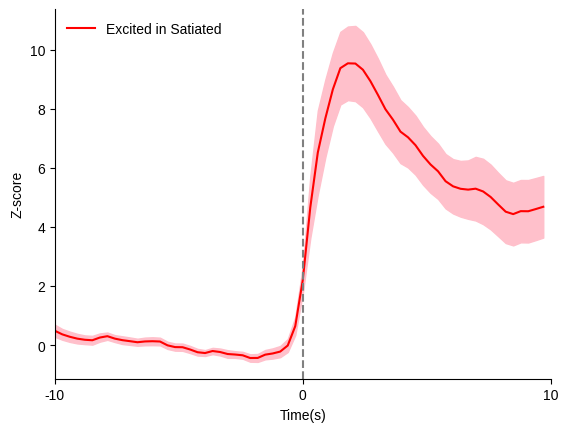

In [34]:
x=np.arange(Bins)
y=excited_satiated_mean
err = excited_satiated_sem
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Excited in Satiated', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0)
len(excited_satiated)

18

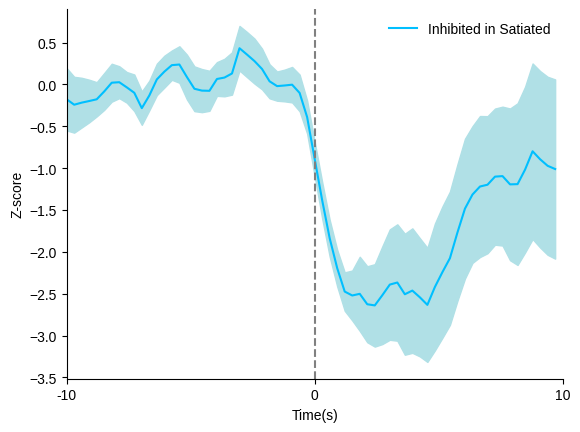

In [35]:
x=np.arange(Bins)
y=inhibited_satiated_mean
err = inhibited_satiated_sem
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Inhibited in Satiated', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-,1)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


41

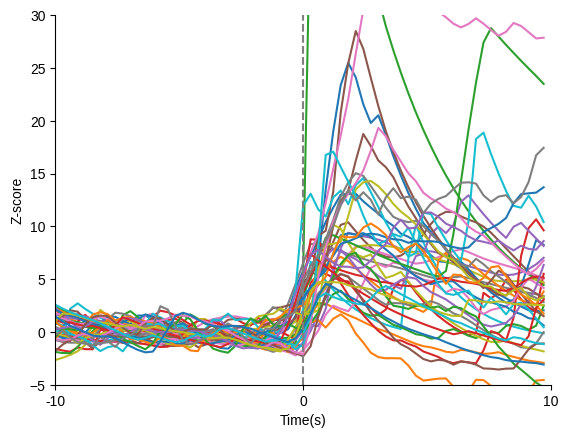

In [36]:
x=np.arange(Bins)
y=excited_satiated.iloc[:,2:]
err = excited_hungry_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


18

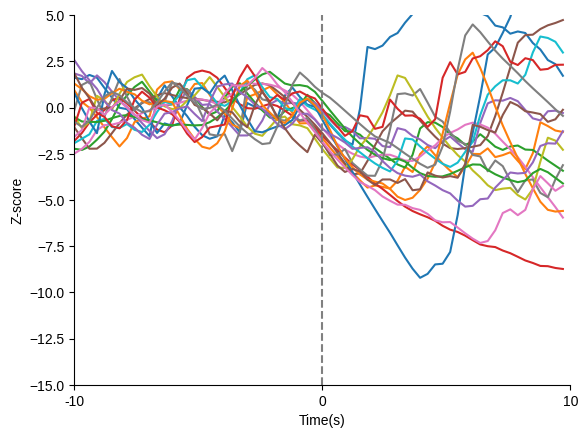

In [37]:
x=np.arange(Bins)
y=inhibited_satiated.iloc[:,2:]
err = inhibited_satiated_sem
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated)

[Text(0, 0, '0'), Text(0, 18, '18')]

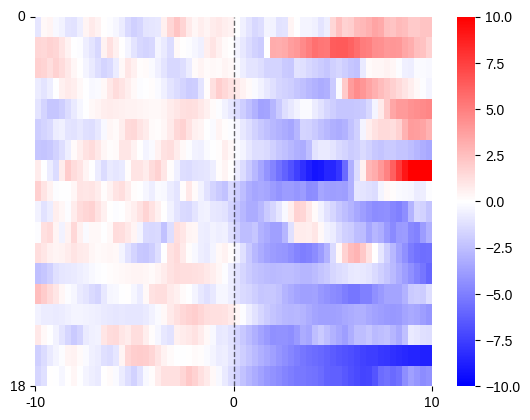

In [38]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_satiated_sort = inhibited_satiated.copy()
inhibited_satiated_sort['count_gt_2'] = (inhibited_satiated_sort.iloc[:, Bins_before + 2:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_satiated_sorted = inhibited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(inhibited_satiated_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_satiated_sorted)])
ax.set_yticklabels([0, len(inhibited_satiated_sorted)])

[Text(0, 0, '0'), Text(0, 41, '41')]

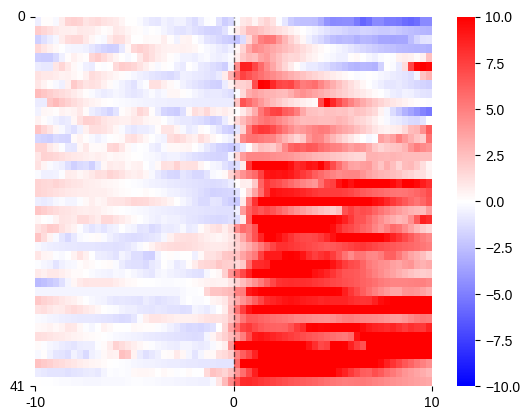

In [39]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_satiated_sort = excited_satiated.copy()
excited_satiated_sort['count_gt_2'] = (excited_satiated_sort.iloc[:, Bins_before + 2:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_satiated_sorted = excited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(excited_satiated_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_satiated_sorted)])
ax.set_yticklabels([0, len(excited_satiated_sorted)])

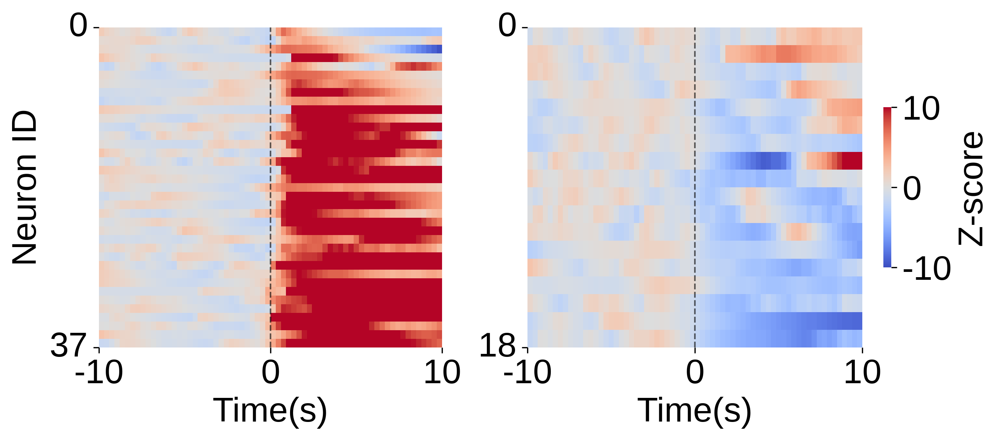

In [40]:
width_ratios = [excited_hungry_sorted.shape[1]*0.82, inhibited_satiated_sorted.shape[1]]
fig = plt.figure(figsize=(9, 4), dpi=300)
gs = gridspec.GridSpec(1, 2, width_ratios=width_ratios)

# Create axes for the subplots with the gridspec
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

sb.heatmap(excited_hungry_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "coolwarm", cbar= False, ax = ax1)
ax1.set_xticks([0,Bins_before,Bins])
ax1.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax1.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax1.set_yticks([0,len(excited_hungry_sorted)])
ax1.set_yticklabels([0, len(excited_hungry_sorted)])
ax1.set_xlabel('Time(s)', fontsize = 22)
ax1.set_ylabel('Neuron ID', fontsize = 22)
ax1.tick_params(labelsize = 22)

sb.heatmap(inhibited_satiated_sorted.iloc[:,2:].astype('float'), vmin = -10, vmax= 10, cmap = "coolwarm", cbar= True, ax = ax2, cbar_kws= {'shrink': 0.5})
ax2.set_xticks([0,Bins_before,Bins])
ax2.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax2.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax2.set_yticks([0,len(inhibited_satiated_sorted)])
ax2.set_yticklabels([0, len(inhibited_satiated_sorted)])
ax2.set_xlabel('Time(s)', fontsize = 22)

ax2.tick_params(labelsize = 22)
cbar = ax2.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 22)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 22)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_inhibited_satiated_heatmap.svg", transparent=True)


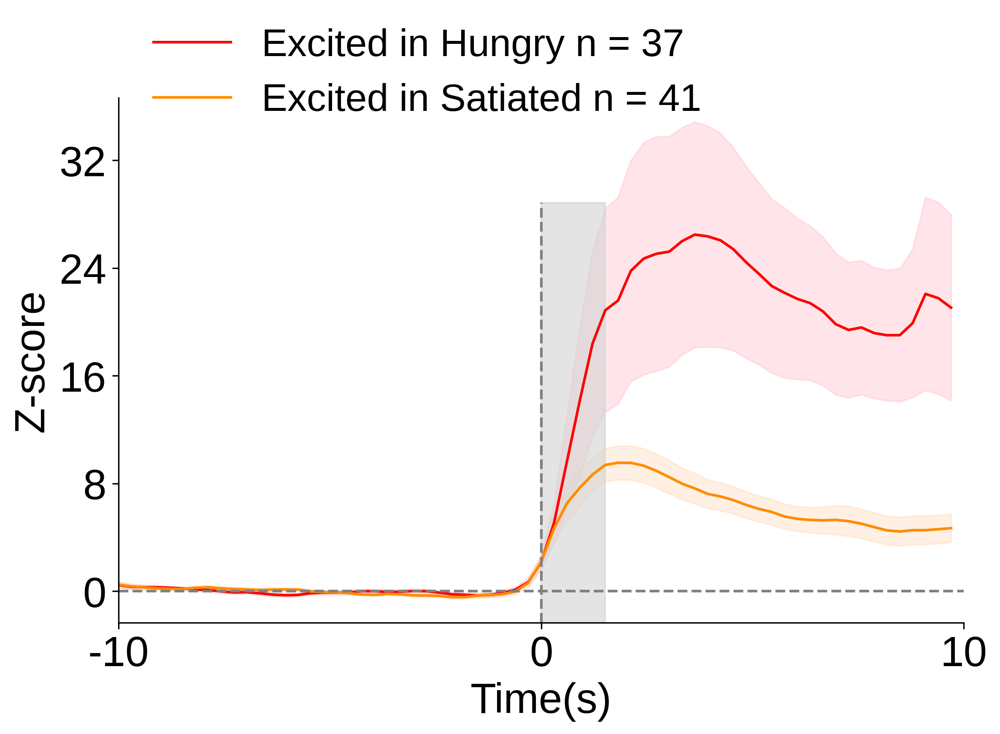

In [41]:
x=np.arange(Bins)
y=excited_hungry_mean
z=excited_satiated_mean
erry = excited_hungry_sem
errz = excited_satiated_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = f'Excited in Hungry n = {len(excited_hungry)}', color = 'red')
ax.plot(x, z, label = f'Excited in Satiated n = {len(excited_satiated)}', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.8)

len(excited_hungry)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_satiated_line.svg", transparent=True)


Mannwhitneyu test results: Statistics = 910.0, p-value = 0.1307913141242451


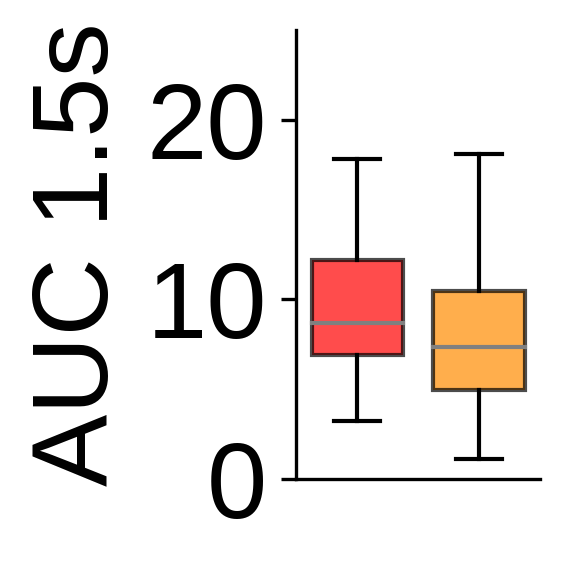

In [42]:
# Sum the selected columns for each dataset
data_hungry = (excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)



normality1 = stats.shapiro(data_hungry)
normality2 = stats.shapiro(data_satiated)
if normality1[1] > 0.05 and normality2[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_ind(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    m_stat, p_value = stats.mannwhitneyu(data_hungry, data_satiated)
    print(f"Mannwhitneyu test results: Statistics = {m_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['red', 'darkorange']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(0, 25)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]-5, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 32)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_satiated_box.svg", transparent=True)

plt.show()


31

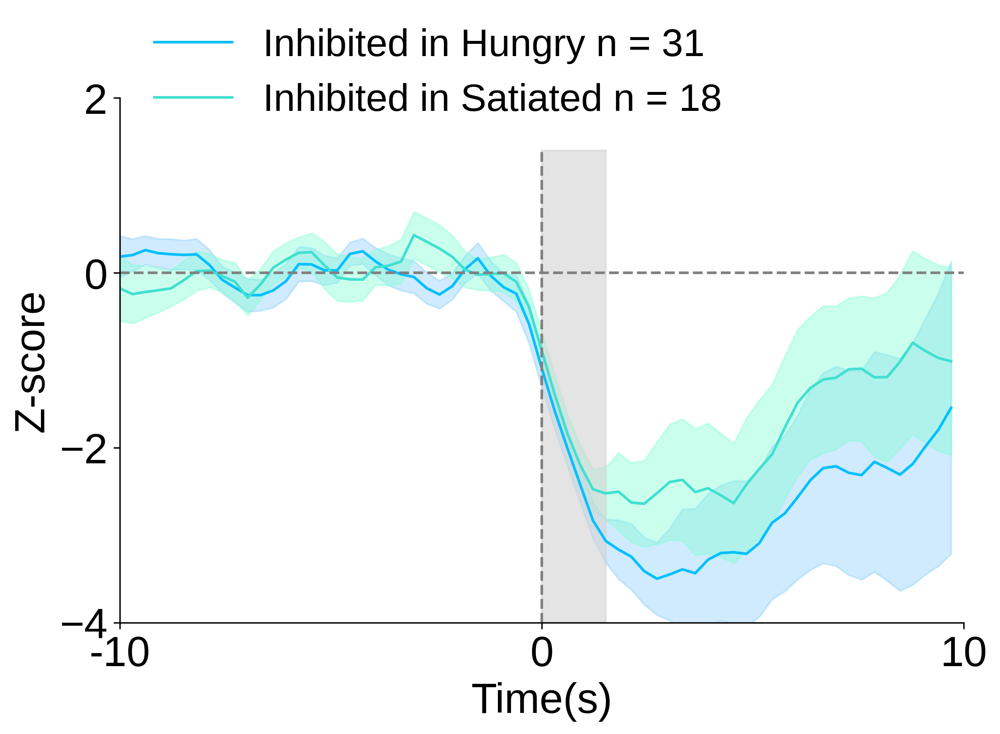

In [43]:
x=np.arange(Bins)
y=inhibited_hungry_mean
z=inhibited_satiated_mean
erry = inhibited_hungry_sem
errz = inhibited_satiated_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = f'Inhibited in Hungry n = {len(inhibited_hungry)}', color = 'deepskyblue')
ax.plot(x, z, label = f'Inhibited in Satiated n = {len(inhibited_satiated)}', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), ymax= 0.9, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.9)
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_hungry_satiated_line.svg", transparent=True)
plt.tight_layout()

len(inhibited_hungry)

Paired t-test results: t-statistic = 0.0, p-value = 1.0


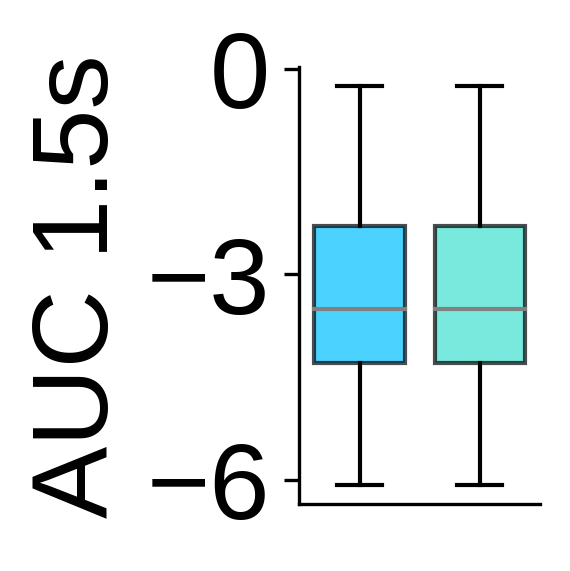

In [44]:
# Sum the selected columns for each dataset
data_hungry = (inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (inhibited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only neg values in the specified range for 'data_hungry'
data_hungry = np.where(
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only neg values in the specified range for 'data_satiated'
data_satiated = np.where(
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05 and normality2[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_ind(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    m_stat, p_value = stats.mannwhitneyu(data_hungry, data_satiated)
    print(f"Mannwhitneyu test results: Statistics = {m_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['deepskyblue', 'turquoise']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(None, None)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]-5, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 32)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_hungry_satiated_box.svg", transparent=True)

plt.show()

In [45]:
excited_hungry_insatiated_mean = trace_satiated.iloc[excited_indices, 2:].mean(axis=0)
excited_hungry_insatiated_sem =  trace_satiated.iloc[excited_indices, 2:].sem(axis=0)
inhibited_hungry_insatiated_mean = trace_satiated.iloc[inhibited_indices, 2:].mean(axis=0)
inhibited_hungry_insatiated_sem =  trace_satiated.iloc[inhibited_indices, 2:].sem(axis=0)
excited_satiated_inhungry_mean = trace_hungry.iloc[excited_satiated_indices, 2:].mean(axis=0)
excited_satiated_inhungry_sem =  trace_hungry.iloc[excited_satiated_indices, 2:].sem(axis=0)
inhibited_satiated_inhungry_mean = trace_hungry.iloc[inhibited_satiated_indices, 2:].mean(axis=0)
inhibited_satiated_inhungry_sem =  trace_hungry.iloc[inhibited_satiated_indices, 2:].sem(axis=0)

37

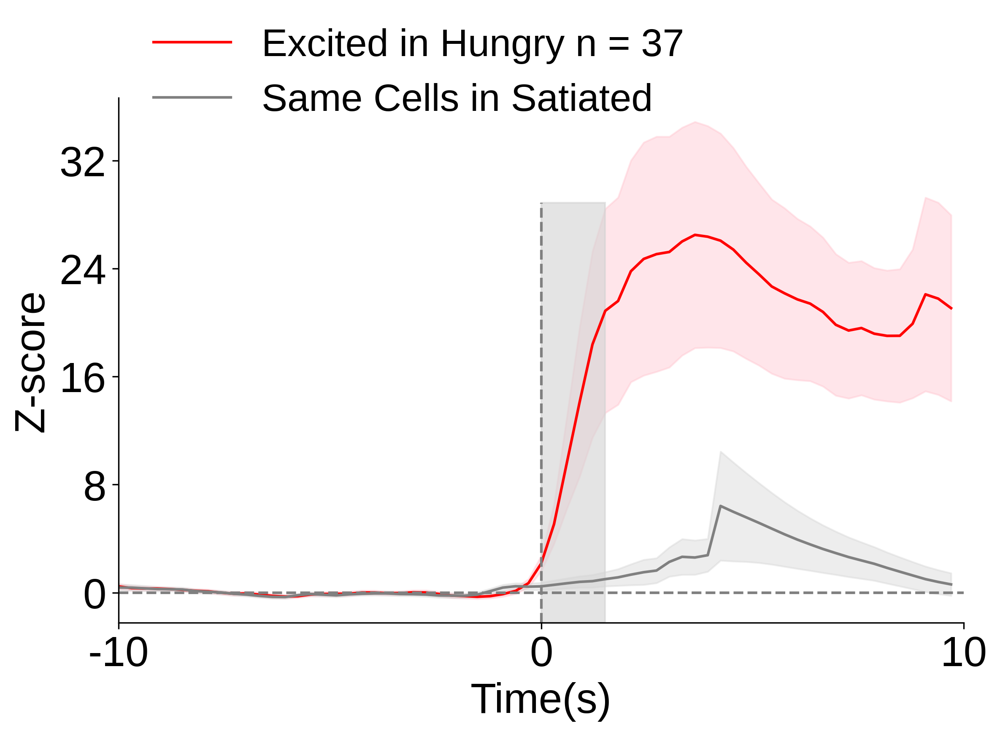

In [46]:
x=np.arange(Bins)
y=excited_hungry_mean
z=excited_hungry_insatiated_mean
erry = excited_hungry_sem
errz = excited_hungry_insatiated_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.plot(x, y, label = f'Excited in Hungry n = {len(excited_hungry)}', color = 'red')
ax.plot(x, z, label = 'Same Cells in Satiated', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.8)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_same_satiated_line.svg", transparent=True)

len(excited_hungry)

Wilcoxon signed-rank test results: Statistics = 0.0, p-value = 1.4551915228366852e-11


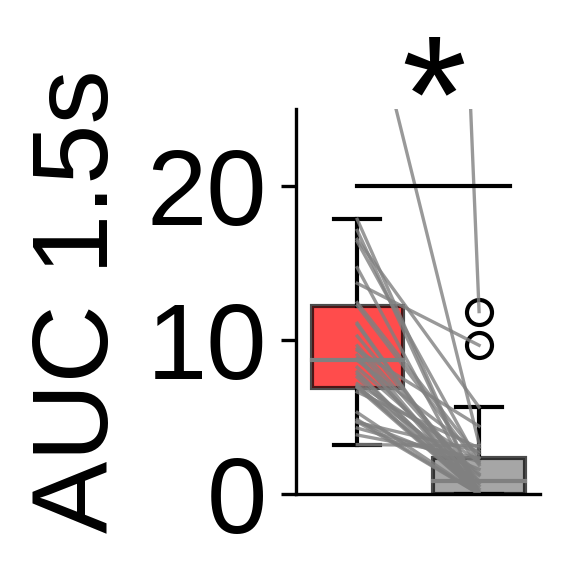

In [47]:
# Sum the selected columns for each dataset
data_hungry = (excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (trace_satiated.iloc[excited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    excited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    trace_satiated.iloc[excited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    trace_satiated.iloc[excited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry - data_satiated)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_satiated)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

    
# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['red', 'grey']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Add connecting lines for individual points
for p1, p2 in zip(data_hungry, data_satiated):
    ax.plot([1, 1.2], [p1, p2], color="grey", alpha=0.8, lw = 0.8)
    
# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(0, 25)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]-5, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 40)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_hungry_same_satiated_box.svg", transparent=True)

plt.show()

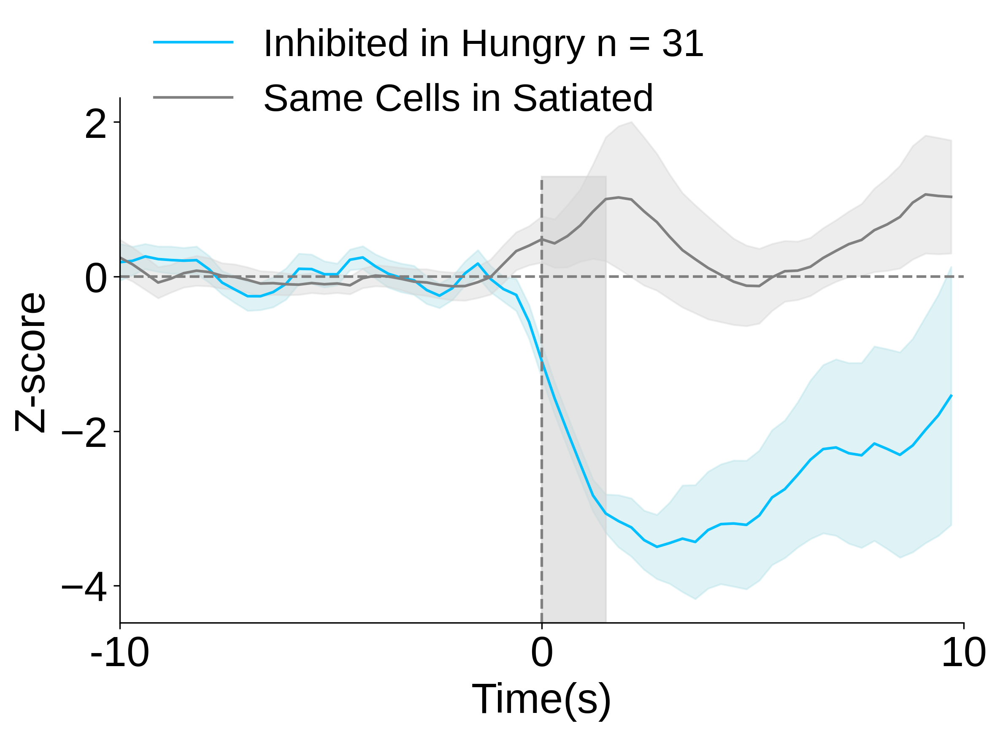

In [48]:
x=np.arange(Bins)
y=inhibited_hungry_mean
z=inhibited_hungry_insatiated_mean
erry = inhibited_hungry_sem
errz = inhibited_hungry_insatiated_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.plot(x, y, label = f'Inhibited in Hungry n = {len(inhibited_hungry)}', color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Satiated', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.85,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.85)
len(inhibited_hungry)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_hungry_same_satiated_line.svg", transparent=True)


Paired t-test results: t-statistic = -8.275206686288477, p-value = 3.0870845261702292e-09


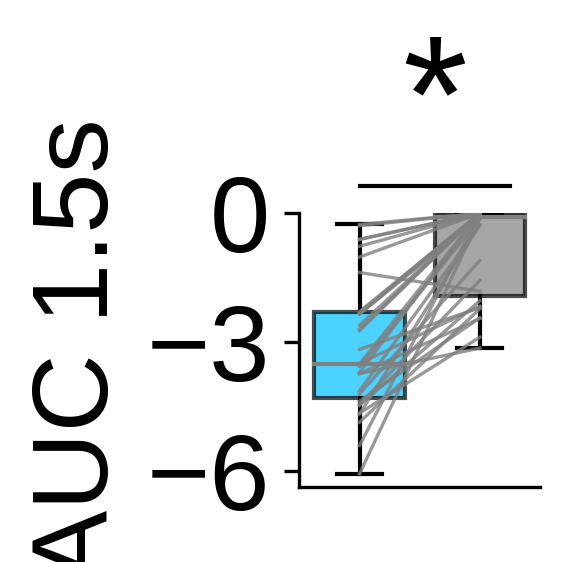

In [49]:
# Sum the selected columns for each dataset
data_hungry = (inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (trace_satiated.iloc[inhibited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    inhibited_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    trace_satiated.iloc[inhibited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    trace_satiated.iloc[inhibited_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry - data_satiated)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_satiated)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['deepskyblue', 'grey']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Add connecting lines for individual points
for p1, p2 in zip(data_hungry, data_satiated):
    ax.plot([1, 1.2], [p1, p2], color="grey", alpha=0.8, lw = 0.8)
    
# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(None, 0)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]+ abs(ax.get_ylim()[0]-ax.get_ylim()[1])*0.1, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 40)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_hungry_same_satiated_box.svg", transparent=True)

plt.show()

In [50]:
excited_hungry_insatiated_mean = trace_satiated.iloc[excited_indices, 2:].mean(axis=0)
excited_hungry_insatiated_sem =  trace_satiated.iloc[excited_indices, 2:].sem(axis=0)
inhibited_hungry_insatiated_mean = trace_satiated.iloc[inhibited_indices, 2:].mean(axis=0)
inhibited_hungry_insatiated_sem =  trace_satiated.iloc[inhibited_indices, 2:].sem(axis=0)
excited_satiated_inhungry_mean = trace_hungry.iloc[excited_satiated_indices, 2:].mean(axis=0)
excited_satiated_inhungry_sem =  trace_hungry.iloc[excited_satiated_indices, 2:].sem(axis=0)
inhibited_satiated_inhungry_mean = trace_hungry.iloc[inhibited_satiated_indices, 2:].mean(axis=0)
inhibited_satiated_inhungry_sem =  trace_hungry.iloc[inhibited_satiated_indices, 2:].sem(axis=0)

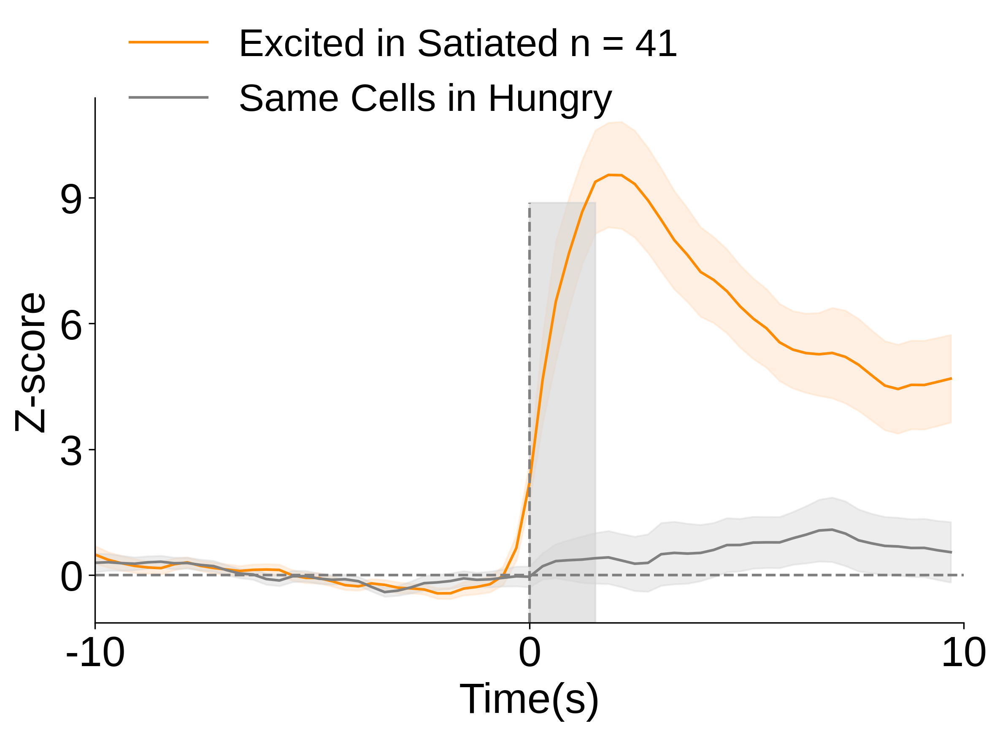

In [51]:
x=np.arange(Bins)
y=excited_satiated_mean
z=excited_satiated_inhungry_mean
erry = excited_satiated_sem
errz = excited_satiated_inhungry_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.plot(x, y, label = f'Excited in Satiated n = {len(excited_satiated)}',color='darkorange')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'peachpuff', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.8)
len(excited_satiated)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_satiated_same_hungry_line.svg", transparent=True)


Wilcoxon signed-rank test results: Statistics = 15.0, p-value = 1.2460077414289117e-10


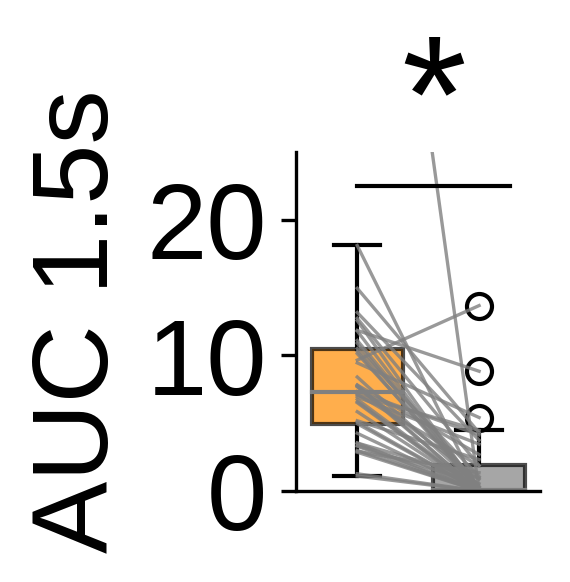

In [52]:
# Sum the selected columns for each dataset
data_hungry = (excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (trace_hungry.iloc[excited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    excited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    trace_hungry.iloc[excited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    trace_hungry.iloc[excited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry - data_satiated)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_satiated)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['darkorange', 'grey']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Add connecting lines for individual points
for p1, p2 in zip(data_hungry, data_satiated):
    ax.plot([1, 1.2], [p1, p2], color="grey", alpha=0.8, lw = 0.8)
    
# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(0, 25)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]- abs(ax.get_ylim()[0]-ax.get_ylim()[1])*0.1, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 40)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_excited_satiated_same_hungry_box.svg", transparent=True)

plt.show()

18

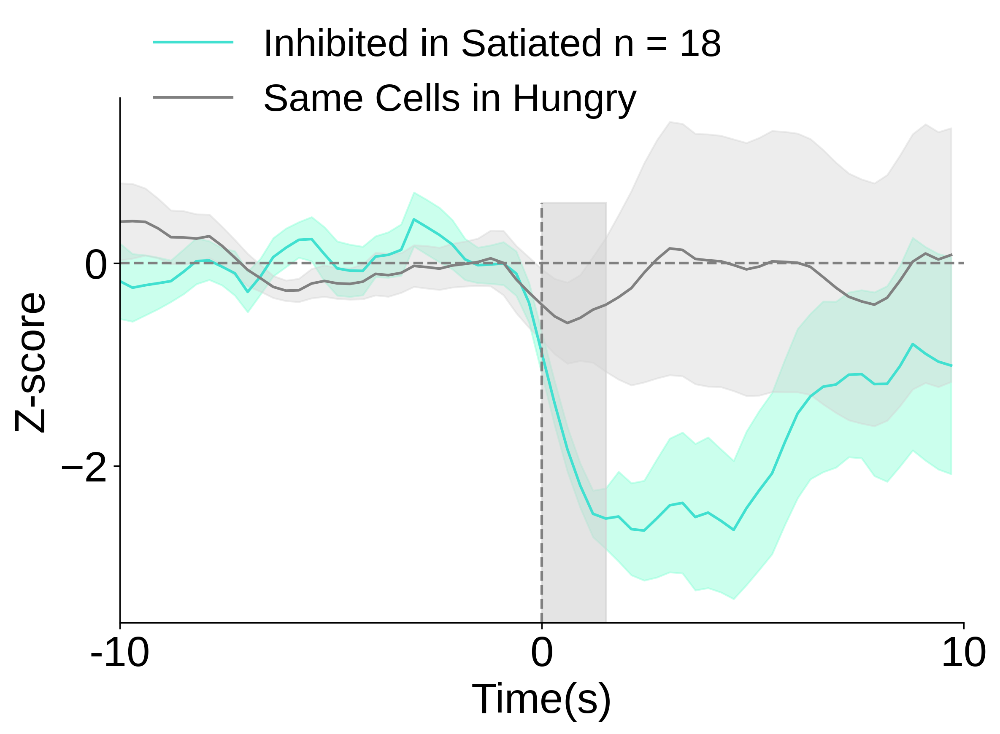

In [53]:
x=np.arange(Bins)
y=inhibited_satiated_mean
z=inhibited_satiated_inhungry_mean
erry = inhibited_satiated_sem
errz = inhibited_satiated_inhungry_sem
fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.tick_params(labelsize = 24)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 24)
ax.set_ylabel('Z-score', fontsize = 24)
ax.plot(x, y, label = f'Inhibited in Satiated n = {len(inhibited_satiated)}',color='turquoise')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'aquamarine', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 22, bbox_to_anchor=(0, 1.2))
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.8)
plt.tight_layout()

plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_satiated_same_hungry_line.svg", transparent=True)

len(inhibited_satiated)

Paired t-test results: t-statistic = -2.2090823633958943, p-value = 0.04118172503217127


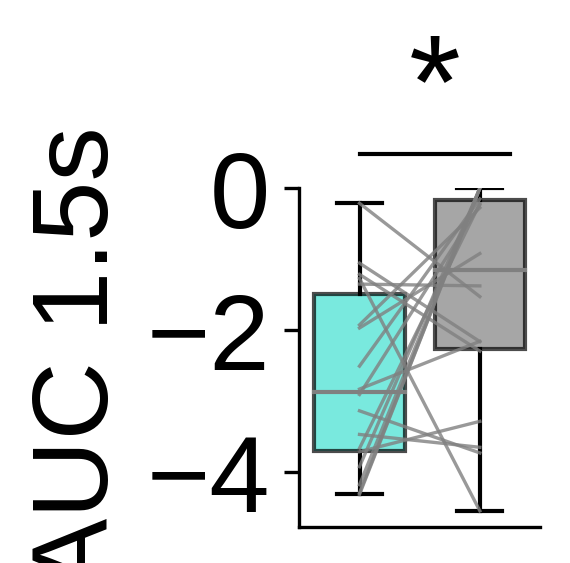

In [54]:
# Sum the selected columns for each dataset
data_hungry = (inhibited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (trace_hungry.iloc[inhibited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values


# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    inhibited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    inhibited_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    trace_hungry.iloc[inhibited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] < 0,
    trace_hungry.iloc[inhibited_satiated_indices, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry - data_satiated)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_satiated)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['turquoise', 'grey']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Add connecting lines for individual points
for p1, p2 in zip(data_hungry, data_satiated):
    ax.plot([1, 1.2], [p1, p2], color="grey", alpha=0.8, lw = 0.8)
    
# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(None, 0)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]+ abs(ax.get_ylim()[0]-ax.get_ylim()[1])*0.1, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=1, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 32)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_inhibited_satiated_same_hungry_box.svg", transparent=True)

plt.show()

In [55]:
tracesatiated_mean = trace_satiated.iloc[:,2:].mean(axis=0)#.dropna(axis=0))
tracesatiated_sem = trace_satiated.iloc[:,2:].sem(axis=0)#.dropna(axis=0))
tracehungry_mean = trace_hungry.iloc[:,2:].mean(axis=0)#.dropna(axis=0)
tracehungry_sem = trace_hungry.iloc[:,2:].sem(axis=0)#.dropna(axis=0)

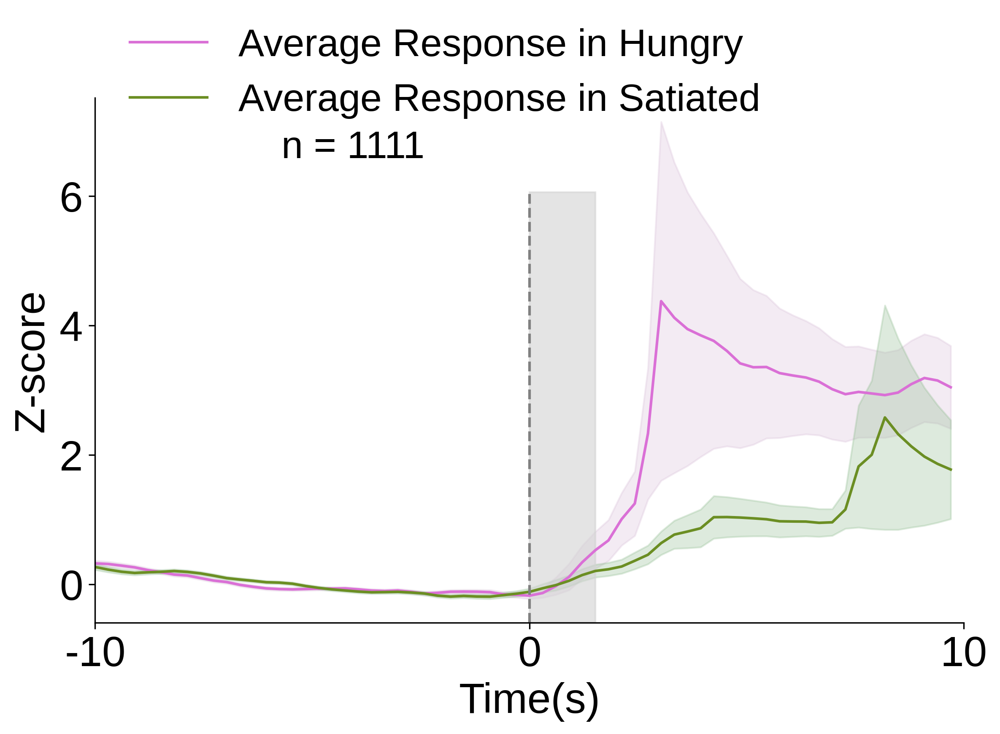

In [56]:

x = np.arange(Bins)
z = tracesatiated_mean
y = tracehungry_mean
errz = tracesatiated_sem
erry = tracehungry_sem

fig, ax = plt.subplots(figsize = (8,6), dpi =300)
ax.plot(x, y, label='Average Response in Hungry', color='orchid')
ax.plot(x, z, label='Average Response in Satiated', color='olivedrab')
legend = ax.legend(loc=2, framealpha=0, fontsize=22, bbox_to_anchor=(0, 1.2))

# Draw the legend and get its bounding box for positioning the text
plt.draw()  # This is necessary to draw the legend and get the bbox
bbox = legend.get_window_extent().transformed(fig.transFigure.inverted())

# Use the bounding box to position your text
# Adjust the second parameter of 'bbox.y0' to move the text up or down relative to the legend
ax.text(bbox.x0+ 0.14, bbox.y0 - 0.08, f'n = {len(trace_hungry)}', transform=fig.transFigure, fontsize=22)

ax.fill_between(x, y-erry, y+erry, color='thistle', alpha=0.3)
ax.fill_between(x, z-errz, z+errz, color='darkseagreen', alpha=0.3)
ax.set_xlabel('Time(s)', fontsize=24)
ax.set_ylabel('Z-score', fontsize=24)
ax.set_xticks([0, int((Bins/2)), Bins])
ax.set_xticklabels([-TimeRange_before, '0', TimeRange_after])
ax.set_xlim(0, Bins)
ax.tick_params(labelsize=24)
ax.axvline(int((Bins/2)), color='grey', ls='--', ymax=0.82)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.tick_params(labelsize=24)
ax.yaxis.set_major_locator(MaxNLocator(5, integer=True))
ax.axvspan(int((Bins/2)),int((Bins/2)+FR*1.5/BinSize), color = "lightgrey", alpha=0.6, ymax = 0.82)

plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_ave_satiation_line.svg", transparent=True)

plt.show()


Wilcoxon signed-rank test results: Statistics = 153600.0, p-value = 0.9182233117603729


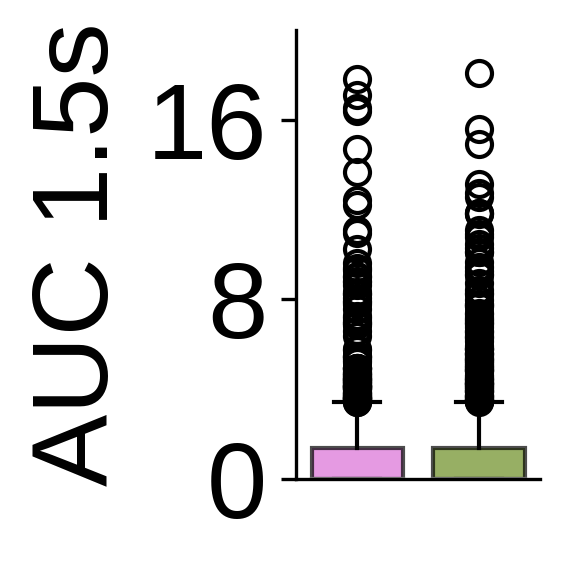

In [57]:
# Sum the selected columns for each dataset
data_hungry = (trace_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values
data_satiated = (trace_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2]*(BinSize/FR)).sum(axis=1).values

# Adjustments for summing only positive values in the specified range for 'data_hungry'
data_hungry = np.where(
    trace_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    trace_hungry.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

# Adjustments for summing only positive values in the specified range for 'data_satiated'
data_satiated = np.where(
    trace_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2] > 0,
    trace_satiated.iloc[:, Bins_before+2 : Bins_before+int(CompareRange_after*FR/BinSize)+2],
    0
).sum(axis=1) * (BinSize / FR)

normality1 = stats.shapiro(data_hungry)
normality2 = stats.shapiro(data_satiated)
# Check if both datasets are normally distributed
if normality1[1] > 0.05 and normality2[1] > 0.05:
    # Perform paired t-test
    t_stat, p_value = stats.ttest_rel(data_hungry, data_satiated)
    print(f"Paired t-test results: t-statistic = {t_stat}, p-value = {p_value}")
else:
    # Perform Wilcoxon signed-rank test
    w_stat, p_value = stats.wilcoxon(data_hungry, data_satiated)
    print(f"Wilcoxon signed-rank test results: Statistics = {w_stat}, p-value = {p_value}")

# Combine the data into a list of arrays for boxplot
data_to_plot = [data_hungry, data_satiated]

fig, ax = plt.subplots(figsize = (2,2),dpi =300)
# Create the boxplot
positions = [1, 1.2]  # Adjust the positions to control the distance between boxplots
boxplots = ax.boxplot(data_to_plot, positions=positions, widths=0.15, patch_artist=True)  # Adjust the width as needed

colors = ['orchid', 'olivedrab']
for patch, color in zip(boxplots['boxes'], colors):
    patch.set_facecolor(color)
    patch.set_alpha(0.7)

# Change the median line color
median_color = 'grey'  # Change this to your desired color
for median in boxplots['medians']:
    median.set_color(median_color)
    median.set_linewidth(1)  # You can adjust the line width as needed

# Set x-tick labels if needed
ax.set_xticks([])
ax.set_ylabel('AUC 1.5s', fontsize = 26)
ax.set_ylim(0, 20)
ax.set_xlim(0.9, 1.3)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
# ax.spines['left'].set_visible(False)
# ax.spines['bottom'].set_visible(False)
ax.yaxis.set_major_locator(MaxNLocator(3,integer=True))
ax.tick_params(labelsize = 26)
if p_value< 0.05:
    x1, x2 = 1, 1.25
    y, h, col = ax.get_ylim()[1]- abs(ax.get_ylim()[0]-ax.get_ylim()[1])*0.1, 0, 'k'
    ax.plot([x1, x1, x2, x2], [y, y+h, y+h, y], lw=0.8, c=col,clip_on=False)
    ax.text((x1+x2)*.5, y+h, "*", ha='center', va='bottom', color=col, fontsize = 16)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_ave_satiation_box.svg", transparent=True)

plt.show()

## Overlap

In [58]:
hungrycells = np.append(excited_indices, inhibited_indices)
satiatedcells = np.append(excited_satiated_indices, inhibited_satiated_indices)

In [59]:
len(np.intersect1d(hungrycells, satiatedcells))

4

In [60]:
len((satiatedcells))

59

In [61]:
len((hungrycells))

68

In [62]:
hungrycells_set = set(hungrycells)
satiatedcells_set = set(satiatedcells)
mixedcells_set = set(np.intersect1d(hungrycells, satiatedcells))

In [63]:
trace_hungry.iloc[np.intersect1d(hungrycells, satiatedcells)]

,Animal_ID,cell_id,0,1,2,3,4,5,6,7,...,56,57,58,59,60,61,62,63,64,65
297,7H6,61,-0.492446,-0.651090,-0.734639,-0.634525,-0.706415,-0.972748,-1.177499,-1.378238,...,1.268455,0.802892,0.455959,1.878468,2.552136,2.620402,2.391539,1.948214,1.762892,1.280223
376,1H6,17,1.811121,1.245703,0.780859,0.364250,0.661776,0.771161,1.703252,1.208728,...,15.200297,15.116822,13.255064,11.544027,10.010542,8.636184,7.681160,7.618315,7.276200,7.570848
428,5B6,17,1.972177,2.046376,1.974796,1.732221,1.280827,0.935288,0.975777,0.593338,...,-8.574947,-8.762604,-8.979485,-9.279319,-9.579674,-9.852827,-10.056419,-10.183651,-10.386762,-10.501167
621,2I5,13,-0.658785,0.236290,0.258202,0.714057,1.258207,1.303022,1.155389,1.450987,...,9.866085,9.050657,8.388229,7.673438,7.177160,6.572350,5.964224,5.372145,4.993018,4.748123


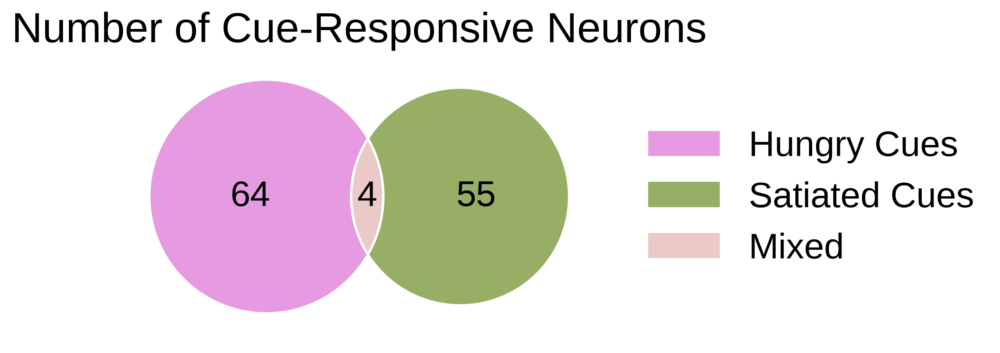

In [64]:
from matplotlib_venn import venn2,venn2_circles

plt.figure(figsize = (9,6),dpi = 300)
venn = venn2([hungrycells_set, satiatedcells_set], ('Cue-Responsive in Hungry', 'Cue-Responsive in Satiated'), set_colors=("orchid", 
                             "olivedrab"),alpha=0.7)

for text in venn.set_labels:
    text.set_visible(False)

for area in ['10', '01', '11']:
    if venn.get_label_by_id(area) is not None:
        venn.get_label_by_id(area).set_fontsize(22)
        venn.get_label_by_id(area).set_color('black')
        
venn2_circles([hungrycells_set, satiatedcells_set], color= 'white', lw = 1.5)

legend_labels = ['Hungry Cues', 'Satiated Cues', 'Mixed']
legend_colors = [venn.get_patch_by_id('10').get_facecolor(), 
                 venn.get_patch_by_id('01').get_facecolor(), 
                 venn.get_patch_by_id('11').get_facecolor()]

legend_handles = [Patch(facecolor=color, label=label) for label, color in zip(legend_labels, legend_colors)]
plt.legend(handles=legend_handles, ncol = 1, fontsize = 22,loc='lower center', frameon=False, bbox_to_anchor=(1.45,0.15))
plt.title('Number of Cue-Responsive Neurons', fontsize = 26)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_satiated_responsive.svg", transparent=True)


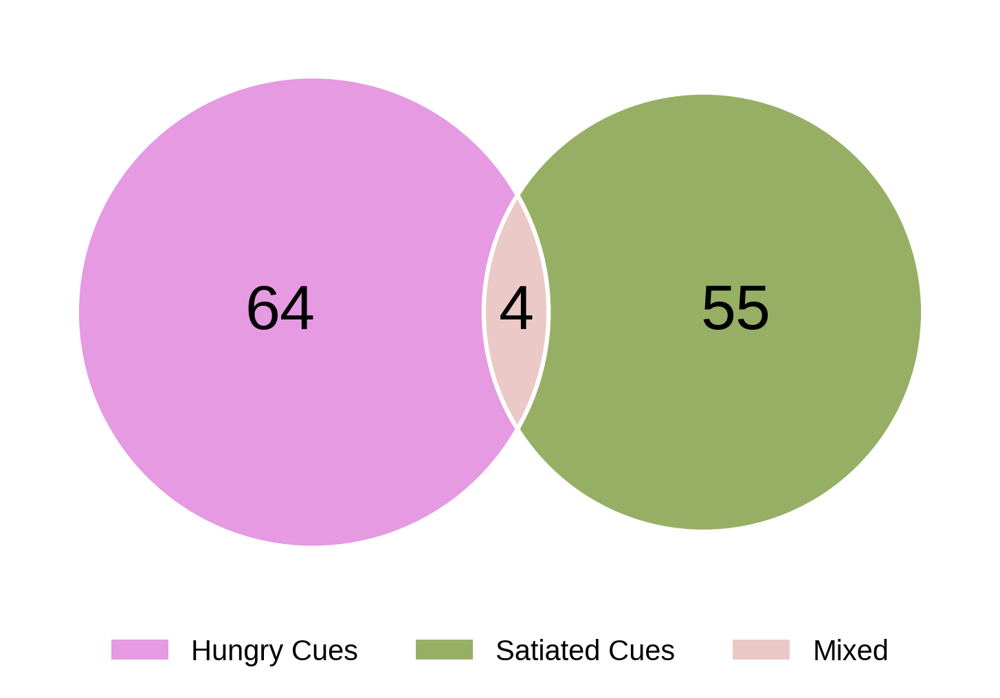

In [65]:
from matplotlib_venn import venn2,venn2_circles

plt.figure(figsize = (6,4),dpi = 300)
venn = venn2([hungrycells_set, satiatedcells_set], ('Hungry-Cue Responsive', 'Satiated-Cue Responsive'), set_colors=("orchid", 
                             "olivedrab"),alpha=0.7)

for text in venn.set_labels:
    text.set_visible(False)

for area in ['10', '01', '11']:
    if venn.get_label_by_id(area) is not None:
        venn.get_label_by_id(area).set_fontsize(22)
        venn.get_label_by_id(area).set_color('black')
        
venn2_circles([hungrycells_set, satiatedcells_set], color= 'white', lw = 1.5)

legend_labels = ['Hungry Cues', 'Satiated Cues', 'Mixed']
legend_colors = [venn.get_patch_by_id('10').get_facecolor(), 
                 venn.get_patch_by_id('01').get_facecolor(), 
                 venn.get_patch_by_id('11').get_facecolor()]

legend_handles = [Patch(facecolor=color, label=label) for label, color in zip(legend_labels, legend_colors)]
plt.legend(handles=legend_handles, ncol = 13, fontsize = 10,loc='lower center', frameon=False, bbox_to_anchor=(0.5,-0.15))


## Subsets

In [297]:
clusters = pd.read_csv("/scratch/09117/xz6783/Xu/PL_miniscope/PL/Analysis/Behavior/satiated_behavior_cluster.csv", index_col= 0)
columns = ['Animal_ID', 'Sex', 'Cluster_Kmeans']
clusters.columns = columns
clusters

,Animal_ID,Sex,Cluster_Kmeans
0,9M6,F,0
1,7H6,F,1
2,2N6,M,1
3,6H6,F,0
4,2I5,M,0
5,8H6,F,1
6,1H6,F,0
7,6S5,M,1
8,8S5,M,0
9,7M6,F,1


In [298]:
trace_hungry = pd.merge(trace_hungry, clusters, on="Animal_ID", how="left")

In [299]:
columns = ['Animal_ID', 'cell_id', 'Sex', 'Cluster_Kmeans'] + [col for col in trace_hungry.columns if col not in ['Animal_ID', 'cell_id', 'Sex', 'Cluster_Kmeans']]
trace_hungry = trace_hungry[columns]
trace_hungry

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,M,1,-0.974356,-1.036490,-1.091343,-1.143929,-1.194341,-1.242669,...,-0.266947,-0.308855,-0.352319,-0.389579,-0.461036,-0.526811,-0.602732,-0.675516,-0.700053,-0.751454
1,6S5,2,M,1,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,...,2.944911,2.857944,2.584875,2.047427,2.060740,2.149064,1.723274,2.655658,3.060550,3.285084
2,6S5,3,M,1,1.162811,1.060209,0.978639,0.825957,0.676933,1.006085,...,16.338843,15.991282,15.647480,15.307396,15.011186,14.822836,14.617208,14.510671,14.186479,13.835385
3,6S5,4,M,1,0.552738,0.341283,0.095955,-0.134774,-0.351774,-0.174224,...,8.961927,8.230150,7.515375,6.843135,6.210898,5.616283,5.080222,5.604845,6.244997,7.236901
4,6S5,5,M,1,0.105960,0.052360,-0.021338,-0.186413,-0.425214,-0.617182,...,-2.267180,-2.236629,-1.877391,-1.288693,-1.043495,-1.113494,-1.101320,-1.054556,-1.217426,-1.357268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,F,1,-1.010739,-1.068321,-1.116711,-1.160988,-1.201501,-1.238571,...,-1.562624,-1.568999,-1.574832,-1.580170,-1.585053,-1.589522,-1.593610,-1.597352,-1.600775,-1.604152
1107,8H6,71,F,1,-0.577090,-0.675036,-0.758042,-0.834600,-0.905210,-0.970334,...,-1.267579,-1.264059,-1.301304,-1.335656,-1.367339,-1.396560,-1.423511,-1.448369,-1.320394,-1.284156
1108,8H6,73,F,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1109,8H6,75,F,1,2.538170,1.966359,1.517038,1.131163,0.799775,0.515181,...,0.838804,0.548699,0.299558,0.085598,-0.098151,-0.255953,-0.391473,-0.507857,-0.607806,-0.700043


In [300]:
trace_satiated = pd.merge(trace_satiated, clusters, on="Animal_ID", how="left")
columns = ['Animal_ID', 'cell_id', 'Sex', 'Cluster_Kmeans'] + [col for col in trace_satiated.columns if col not in ['Animal_ID', 'cell_id', 'Sex', 'Cluster_Kmeans']]
trace_satiated = trace_satiated[columns]
trace_satiated

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,M,1,1.250164,1.550362,1.682813,1.502277,1.316174,1.381780,...,-1.661438,-1.552346,-1.662736,-1.524315,-1.514779,-1.621969,-1.753524,-1.696078,-1.436327,-1.319235
1,6S5,2,M,1,-0.781597,-0.850040,-0.933220,-0.758515,-0.723279,-0.768357,...,4.942090,4.598078,4.218103,3.853804,3.628008,3.303453,3.204487,3.324963,3.227698,3.054948
2,6S5,3,M,1,1.612936,1.535117,1.764393,1.613412,1.056815,0.536475,...,4.434390,4.337976,3.995484,4.115094,4.032020,3.491168,3.140567,2.567306,2.348119,1.719107
3,6S5,4,M,1,1.675302,1.374952,1.115345,0.693751,0.213133,-0.238883,...,-0.138461,-0.459211,-0.562967,-0.617309,-0.947741,-1.183564,-1.401034,-1.594933,-1.930127,-2.225900
4,6S5,5,M,1,-2.491371,-2.571294,-2.379932,-1.606490,-0.517350,0.108520,...,-1.556438,-1.607345,-1.753781,-1.797681,-1.444902,-0.907563,-0.731719,-0.958757,-1.160242,-1.276373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,F,1,0.451044,1.224173,1.131703,1.585711,2.074003,1.771819,...,-0.445855,-0.533855,-0.614376,-0.688052,-0.755466,-0.817150,-0.873591,-0.925234,-0.972488,-1.019103
1107,8H6,71,F,1,2.386009,2.072847,1.807453,1.562677,1.336918,1.128699,...,-1.304324,-1.307347,-1.310135,-1.312707,-1.315078,-1.317266,-1.319283,-1.321144,-1.322860,-1.324568
1108,8H6,73,F,1,2.798212,2.310925,1.919094,1.575196,1.273366,1.008457,...,-0.889857,-0.890144,-0.890396,-0.890616,-0.890810,-0.232855,0.919899,0.698229,0.503676,0.319983
1109,8H6,75,F,1,-0.427598,-0.495524,-0.548900,-0.594739,-0.634105,2.700861,...,-0.871930,-0.872156,-0.872349,-0.872515,-0.872658,-0.872781,-0.872886,-0.872976,-0.873054,-0.873126


In [301]:
excited_hungry = pd.concat([trace_hungry.iloc[i] for i in excited_indices], axis=1).T
excited_hungry

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
1,6S5,2,M,1,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,...,2.944911,2.857944,2.584875,2.047427,2.06074,2.149064,1.723274,2.655658,3.06055,3.285084
6,6S5,8,M,1,0.755368,0.23957,0.632049,1.169772,0.90964,0.342772,...,5.891938,6.484953,6.28284,5.336921,5.59995,6.003926,5.585861,4.997398,4.305344,3.021467
10,6S5,13,M,1,-0.288806,-0.710974,-0.737251,-0.279189,0.683994,1.409912,...,4.352559,3.404175,3.462557,2.558367,2.184381,2.585429,3.101729,2.676781,1.642374,0.323723
13,6S5,17,M,1,0.598231,0.677376,0.722344,0.788024,0.832126,0.754398,...,0.267126,0.041423,0.136707,-0.040584,-0.292054,-0.381404,0.599379,1.40316,1.871256,1.963252
27,6S5,32,M,1,-1.272618,-1.792469,-1.514361,-0.238455,0.375322,0.304668,...,3.634025,6.907566,7.788267,8.289448,9.139957,8.430071,8.596022,7.82363,6.424224,5.424075
44,6S5,51,M,1,0.316848,0.393402,0.413136,0.106892,0.19864,-0.132084,...,4.93747,4.359824,3.690026,3.083262,2.64898,2.336012,2.337634,1.926622,1.347169,0.716797
97,2Z4,51,M,0,0.33276,0.110951,-0.068129,-0.225902,-0.364903,-0.487367,...,15.149322,14.025036,14.434997,13.409372,13.433087,12.426147,11.108644,10.489783,10.249416,9.017189
138,2Z4,113,M,0,-0.586464,-0.600955,-0.612788,-0.623326,-0.632711,-0.641069,...,59.819969,56.737758,59.141655,55.461821,54.623108,51.676831,48.591973,46.055614,47.056207,43.675532
149,2Z4,130,M,0,2.467878,1.713425,1.296032,1.267527,0.639921,-0.005429,...,10.252875,8.951648,7.365546,6.135705,6.131704,5.388102,5.955076,6.378254,6.611535,6.635319
151,2Z4,132,M,0,2.071695,1.860189,1.674208,1.496585,1.326945,1.164929,...,149.234952,142.425831,135.922717,129.711859,123.780121,118.114961,140.516896,223.581086,220.100735,209.301314


In [302]:
inhibited_hungry = pd.concat([trace_hungry.iloc[i] for i in inhibited_indices], axis=1).T
inhibited_hungry

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
36,6S5,43,M,1,-0.141477,0.593709,1.102753,2.025503,2.024476,1.552975,...,-3.141014,-3.155274,-3.250053,-3.133639,-3.098915,-3.345085,-3.196763,-2.636031,-2.622548,-2.465833
49,6S5,56,M,1,1.21964,0.762368,1.186556,0.860345,0.037222,-0.112825,...,-2.317831,-2.534585,-2.87287,-2.947963,-2.950831,-3.190726,-2.425947,-2.082503,-2.557526,-3.098615
71,2Z4,18,M,0,1.152006,1.253656,1.065403,0.788156,0.326772,-0.259023,...,-7.721312,-7.878532,-8.104533,-8.160501,-8.285547,-8.493702,-8.692728,-8.883028,-9.064983,-9.152837
95,2Z4,49,M,0,-1.446412,-0.584418,0.264225,0.475862,1.043301,1.280805,...,-6.105049,-6.200802,-6.290508,-6.374549,-6.453282,-6.527042,-6.596144,-6.660882,-6.721531,-6.782865
98,2Z4,52,M,0,-1.038496,-1.32882,-1.465388,-1.880969,-1.906253,-1.299092,...,-3.157715,-2.739847,-2.050698,-2.112877,-2.466801,-2.362102,-2.274531,-1.994322,-1.70549,-2.053408
132,2Z4,104,M,0,2.79403,1.850683,1.053219,0.541213,0.496114,0.895852,...,0.94519,0.582762,0.63952,0.501463,0.099685,0.022588,-0.092613,0.325399,0.940592,0.784338
167,2Z4,151,M,0,-1.185936,-1.216829,-1.17762,-0.675219,0.15394,0.676407,...,4.031378,4.042965,3.996196,3.89491,3.398229,3.007853,2.863711,2.562441,2.259078,1.636115
198,2N6,1,M,1,1.599401,1.10759,0.77377,1.076518,1.510004,1.387614,...,12.546491,14.70979,18.093901,22.440838,24.882125,27.191233,29.878043,32.940464,36.573054,41.125699
237,2N6,92,M,1,1.2598,0.929406,1.173957,1.491166,1.736434,1.472087,...,9.080847,8.737268,8.167201,7.658383,7.102517,6.526535,5.95592,5.390622,4.830589,4.229846
297,7H6,61,F,1,-0.492446,-0.65109,-0.734639,-0.634525,-0.706415,-0.972748,...,1.268455,0.802892,0.455959,1.878468,2.552136,2.620402,2.391539,1.948214,1.762892,1.280223


In [303]:
excited_satiated = pd.concat([trace_satiated.iloc[i] for i in excited_satiated_indices], axis=1).T
excited_satiated

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
30,6S5,37,M,1,0.804104,0.60072,0.872144,0.932444,0.650705,0.414397,...,4.978173,4.490774,4.02815,3.597397,3.181815,2.785731,2.409782,2.052944,1.948446,2.0356
68,2Z4,14,M,0,2.023182,1.625355,1.274523,0.929863,0.673892,0.629298,...,-1.946891,-2.073411,-2.036039,-1.919628,-2.169601,-2.361275,-2.54096,-2.717938,-2.819419,-2.932113
77,2Z4,26,M,0,2.364077,2.058813,1.799431,1.559603,1.337857,1.132828,...,10.461779,9.568887,8.743312,7.979977,7.274191,6.621616,6.018238,5.46035,4.944522,4.430037
85,2Z4,34,M,0,-1.603898,-1.756859,-1.8755,-1.470293,-1.629883,-1.643227,...,-0.105102,3.704544,3.185713,3.693277,4.95076,3.978345,3.091563,2.323134,1.929055,5.504413
225,2N6,59,M,1,1.679802,1.485876,1.365241,1.212177,1.081429,0.9365,...,6.015565,5.815467,5.617452,5.427774,5.375799,5.430629,5.629105,5.953779,6.395026,7.024254
233,2N6,84,M,1,2.324104,1.366408,0.5455,-0.238073,-0.992652,-1.550433,...,10.379486,9.973315,9.392834,8.66324,7.911614,7.165894,6.423531,5.684099,5.108794,4.668715
235,2N6,86,M,1,-0.268526,-0.475187,-0.654728,-0.779415,-0.858394,-0.904191,...,7.248877,6.951859,6.709914,6.490744,6.280979,6.075415,5.868997,5.631413,5.354139,5.05663
240,2N6,97,M,1,0.047039,-0.010052,-0.061183,-0.11087,-0.159155,-0.206076,...,4.904124,4.714286,4.529805,4.350532,4.176319,4.007024,3.842507,3.700187,3.573529,3.409121
250,2N6,127,M,1,-2.666348,-2.44509,-2.177057,-1.827554,-1.22682,-0.405176,...,5.547374,5.227395,4.940603,4.82038,4.781659,4.797961,4.850649,4.937911,4.971516,4.670048
270,7H6,2,F,1,-0.73063,-0.739477,2.198153,2.704428,2.175214,1.726268,...,2.14201,1.6981,1.32152,1.002058,0.73105,0.501146,0.306114,0.140662,0.000306,-0.127561


In [304]:
inhibited_satiated = pd.concat([trace_satiated.iloc[i] for i in inhibited_satiated_indices], axis=1).T
inhibited_satiated

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
2,6S5,3,M,1,1.612936,1.535117,1.764393,1.613412,1.056815,0.536475,...,4.43439,4.337976,3.995484,4.115094,4.03202,3.491168,3.140567,2.567306,2.348119,1.719107
33,6S5,40,M,1,0.923889,0.301128,-0.015076,-0.518983,-1.073595,-1.602332,...,-2.684251,-2.576387,-2.42057,-2.886468,-3.330631,-2.473595,-0.79571,-1.003435,-1.244433,-1.324352
51,6S5,59,M,1,-2.232073,-2.294516,-2.112067,-1.740434,-1.305435,-0.626349,...,-2.119498,-2.295988,-2.107412,-2.056151,-2.275532,-2.295401,-2.577747,-2.873263,-3.147235,-3.421269
102,2Z4,58,M,0,-1.806489,-1.375877,-0.801035,-0.395366,-0.139049,0.396487,...,-7.550921,-7.739009,-7.882968,-8.077525,-8.276532,-8.411609,-8.571836,-8.585415,-8.682068,-8.736265
186,2Z4,179,M,0,1.842507,1.709916,1.304184,1.739273,1.375721,0.861114,...,0.390497,0.371057,0.518716,0.340603,-0.132896,-0.587591,-0.696743,-0.201568,-0.170242,-0.296429
214,2N6,37,M,1,-1.077761,-1.664388,-2.229347,-2.223917,-1.910283,-1.385143,...,-0.458441,0.804384,2.167543,3.508957,3.920794,3.941272,4.247646,4.448847,4.575316,4.734486
234,2N6,85,M,1,-2.490887,-2.234785,-1.858027,-1.22356,-0.953303,-0.92589,...,-1.416086,-1.847034,-2.259043,-2.687932,-3.214864,-3.768405,-4.31476,-4.854019,-5.386276,-5.954989
339,1I5,46,M,0,-0.126478,1.222861,1.429974,0.454995,-0.48606,0.506023,...,-2.864064,-3.171641,-3.948201,-4.581948,-3.942958,-3.890755,-4.621595,-4.855248,-3.890216,-3.119868
361,1I5,78,M,0,-0.482716,-1.119329,-0.780589,0.634603,0.37964,-0.11428,...,-4.467482,-4.390189,-4.348026,-4.741009,-4.976722,-4.411985,-2.926907,-1.632979,-1.791109,-2.285699
366,1I5,84,M,0,-1.92297,-1.690856,-1.449575,-0.72419,-0.615807,-1.056634,...,1.14869,1.474213,1.472106,1.298138,1.771296,2.978087,3.842778,3.763608,3.558688,2.976502


### Cluster 0 full supression

In [305]:
trace_hungry_cluster0 = trace_hungry[trace_hungry.Cluster_Kmeans==0]
trace_hungry_cluster0

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
58,2Z4,1,M,0,2.166226,1.938305,1.737428,1.545160,1.361131,1.184988,...,-1.854632,-1.892965,-1.923079,-1.823316,-1.862991,-1.807372,-1.664593,-1.711070,-1.755555,-1.801571
59,2Z4,3,M,0,2.232640,1.969550,1.740503,1.523800,1.318777,1.124802,...,-2.033304,-2.046622,-2.059222,-1.665227,-1.421350,-1.467648,-1.413595,-1.365128,-1.414456,-1.464862
60,2Z4,4,M,0,2.104643,1.883594,1.689961,1.505695,1.330343,1.163474,...,-1.861526,-1.873982,-1.885835,-1.897115,-1.907849,-1.918064,-1.927785,-1.937035,-1.945838,-1.954889
61,2Z4,5,M,0,0.380400,0.279245,0.191179,0.107861,0.029035,-0.045543,...,27.456244,25.903170,25.057613,23.667765,23.261011,24.277368,22.895656,22.529783,22.552745,22.249054
62,2Z4,7,M,0,0.990078,1.014533,1.104931,1.391720,1.163685,0.889714,...,-2.314470,-2.403716,-2.487756,-2.393041,-2.261070,-1.943522,-1.622687,-1.642833,-1.561569,-1.457535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1093,6H6,124,F,0,1.714319,1.474457,1.259509,1.055304,1.024997,1.224177,...,-3.728729,-3.799730,-3.868768,-3.935895,-4.001166,-4.064630,-4.126339,-4.186341,-4.244683,-4.306043
1094,6H6,125,F,0,-1.106437,-1.115384,-1.122969,-1.129968,-0.973468,-0.211137,...,0.774453,0.620746,0.553436,2.724155,6.933234,8.675536,8.029734,7.315051,8.209192,11.369872
1095,6H6,127,F,0,0.587696,0.323365,0.090209,-0.133126,-0.347054,-0.551970,...,-1.406584,-1.566871,-1.720407,-1.867476,-2.008350,-2.034173,-1.878185,-1.652499,-1.687911,-1.848339
1096,6H6,130,F,0,0.368361,1.600633,1.845210,1.771588,1.556606,1.265263,...,35.200148,32.952417,30.827194,28.817802,26.917929,25.121606,23.423188,21.817339,20.299014,18.748576


730 neurons in Combined


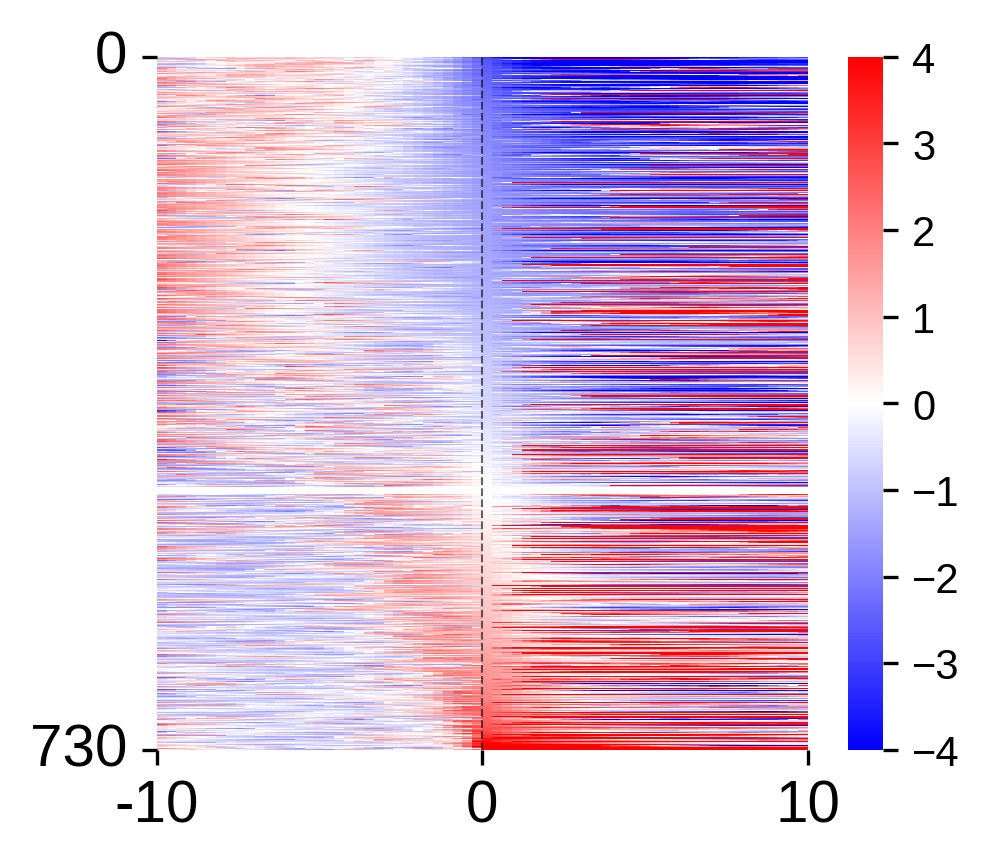

In [306]:
# Sorting and creating the heatmap
tracesorted = trace_hungry_cluster0.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 4:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry_cluster0)} neurons in Combined")

plt.show()

In [307]:
trace_satiated_cluster0 = trace_satiated[trace_satiated.Cluster_Kmeans==0]
trace_satiated_cluster0

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
58,2Z4,1,M,0,1.270632,0.951290,1.258766,1.253146,1.259252,1.038664,...,-0.989886,-1.274005,-1.244641,-1.205535,-1.368959,-1.543849,-1.711619,-1.968503,-1.900885,-1.644473
59,2Z4,3,M,0,1.631245,1.409581,1.325872,1.389123,1.313024,1.180930,...,-1.003024,-1.199354,-1.076611,-1.063896,-1.070182,-1.228138,-1.130537,-1.114741,-1.238558,-1.210676
60,2Z4,4,M,0,-0.057963,-0.427874,-0.607371,-0.166905,0.178012,0.259416,...,3.705706,3.704610,3.714424,3.296762,2.971552,2.484419,2.226849,2.359812,2.879168,2.414022
61,2Z4,5,M,0,1.652027,1.612843,1.383530,0.886351,0.868470,0.953947,...,1.447484,1.484132,1.501288,1.440210,1.410614,2.036634,1.898190,1.446175,1.057540,0.385591
62,2Z4,7,M,0,-0.435400,-0.804165,-0.701027,-0.516766,0.152445,0.617072,...,-1.312328,-0.591840,-0.654331,-0.957582,-1.193827,-1.185849,-1.045740,-0.762206,0.451167,1.641410
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1093,6H6,124,F,0,1.623766,1.745734,1.587704,1.420537,1.257993,1.099947,...,-2.349118,-2.407374,-2.460373,-2.204310,-1.445885,-0.226055,1.396680,3.254599,5.113914,6.233754
1094,6H6,125,F,0,-1.984086,-1.986975,-1.989424,-1.736601,-0.799484,0.346182,...,-1.765824,-1.785372,-1.803409,-1.820051,-1.835407,-1.849575,-1.816417,-1.738966,-1.758133,-1.779859
1095,6H6,127,F,0,1.804927,1.403075,1.048616,0.709089,0.383862,0.266531,...,1.108020,1.221731,0.892583,0.559628,0.303053,0.056818,0.040751,0.362833,1.106376,1.614780
1096,6H6,130,F,0,-1.614177,-1.639672,-1.661853,-1.682825,-1.702654,-1.352132,...,0.359770,0.228613,0.257893,1.050502,1.881305,1.770001,1.561982,1.365300,1.179339,1.005269


730 neurons in Combined


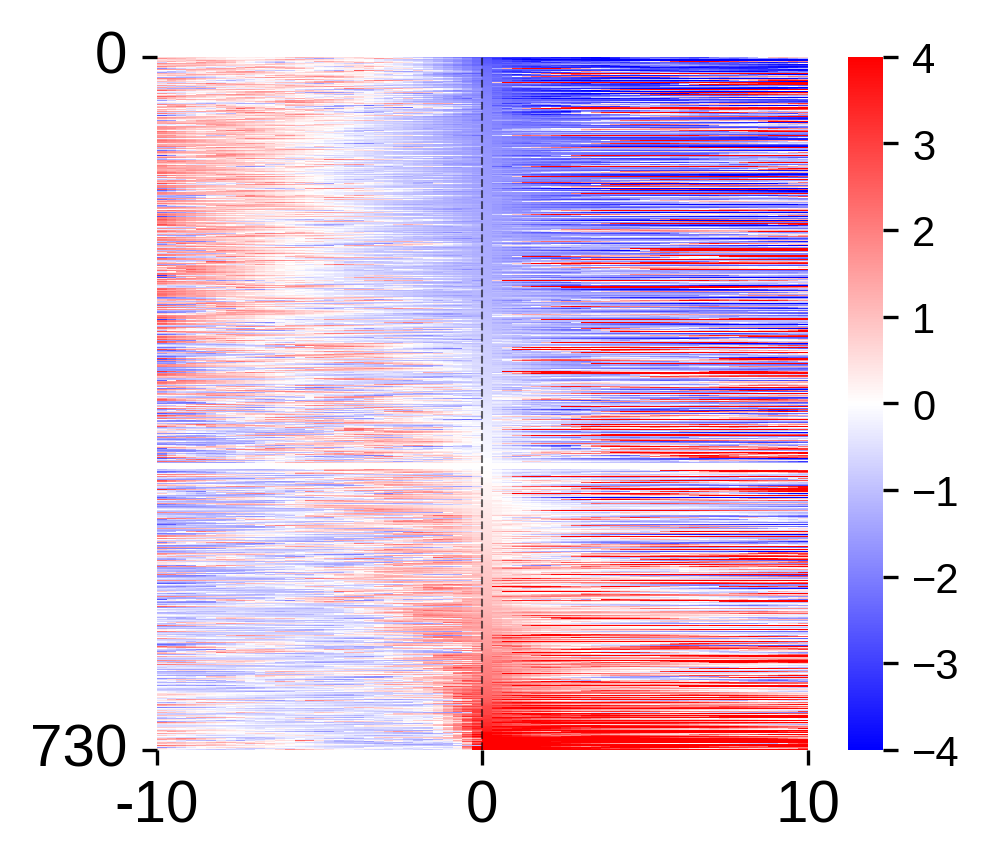

In [308]:
# Sorting and creating the heatmap
tracesorted = trace_satiated_cluster0.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 4:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_satiated_cluster0)} neurons in Combined")

plt.show()

In [309]:

excited_hungry_cluster0 = excited_hungry[excited_hungry.Cluster_Kmeans==0]
inhibited_hungry_cluster0 = inhibited_hungry[inhibited_hungry.Cluster_Kmeans==0]

excited_indices_cluster0 = excited_hungry_cluster0.index.values.tolist()
inhibited_indices_cluster0 = inhibited_hungry_cluster0.index.values.tolist()


excited_hungry_mean_cluster0 = excited_hungry_cluster0.iloc[:,4:].mean(axis=0).astype('float')
excited_hungry_sem_cluster0 = excited_hungry_cluster0.iloc[:,4:].sem(axis=0).astype('float')
inhibited_hungry_mean_cluster0 = inhibited_hungry_cluster0.iloc[:,4:].mean(axis=0).astype('float')
inhibited_hungry_sem_cluster0 = inhibited_hungry_cluster0.iloc[:,4:].sem(axis=0).astype('float')


In [310]:
excited_hungry_mean

0      0.456760
1      0.326215
2      0.301072
3      0.295354
4      0.260149
        ...    
61    19.019910
62    19.912859
63    22.088013
64    21.770124
65    21.066728
Length: 66, dtype: float64

22

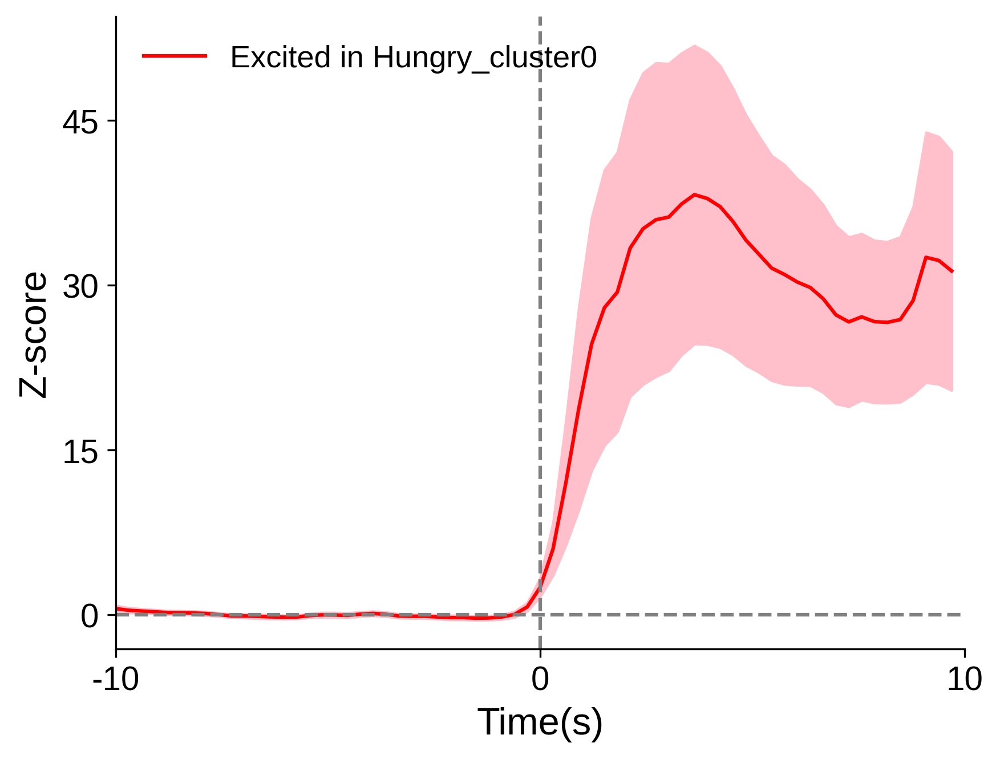

In [311]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster0
err = excited_hungry_sem_cluster0
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in Hungry_cluster0', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_hungry_cluster0)

19

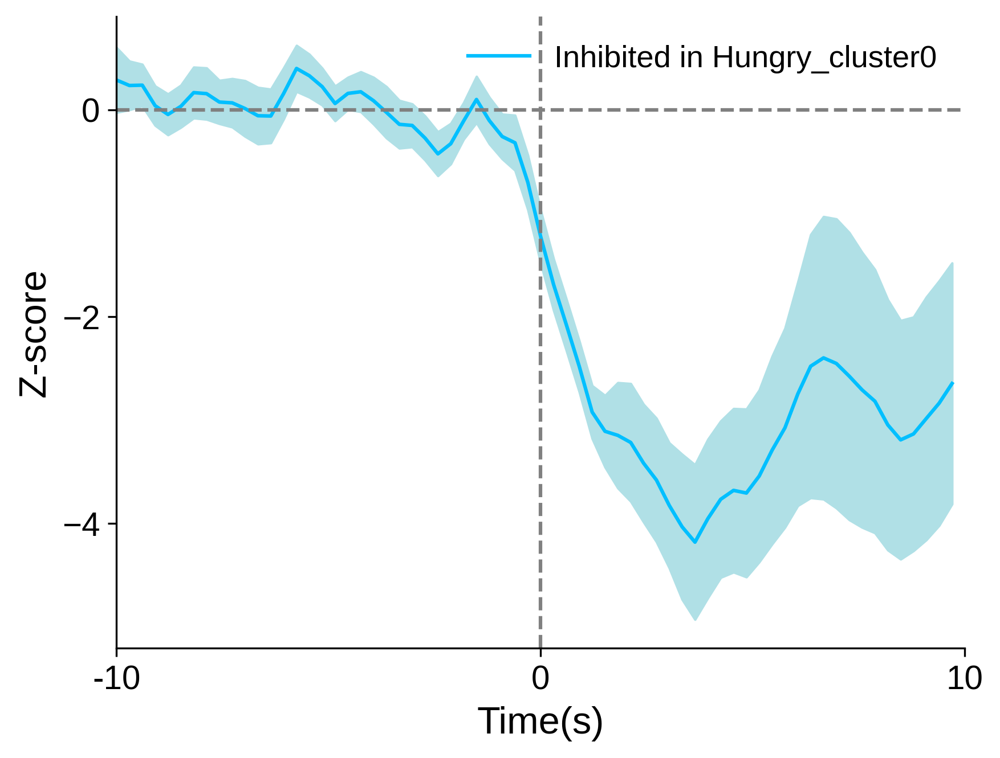

In [312]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster0
err = inhibited_hungry_sem_cluster0
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in Hungry_cluster0', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


22

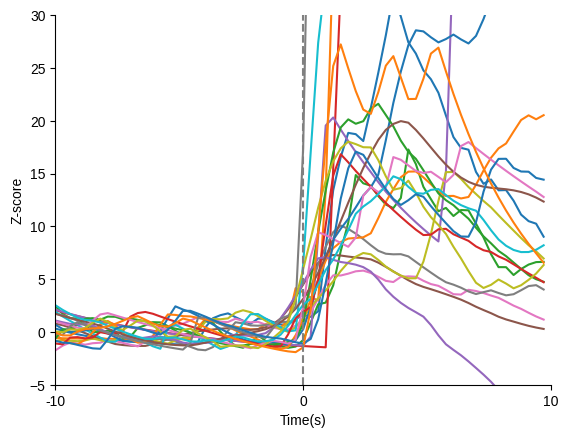

In [313]:
x=np.arange(Bins)
y=excited_hungry_cluster0.iloc[:,4:]
err = excited_hungry_sem_cluster0
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


19

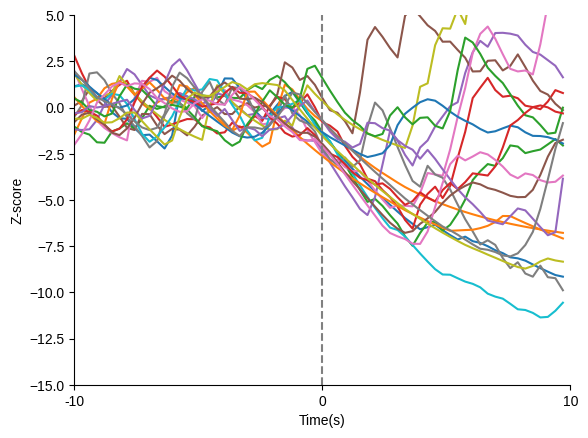

In [314]:
x=np.arange(Bins)
y=inhibited_hungry_cluster0.iloc[:,4:]
err = inhibited_hungry_sem_cluster0
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster0)

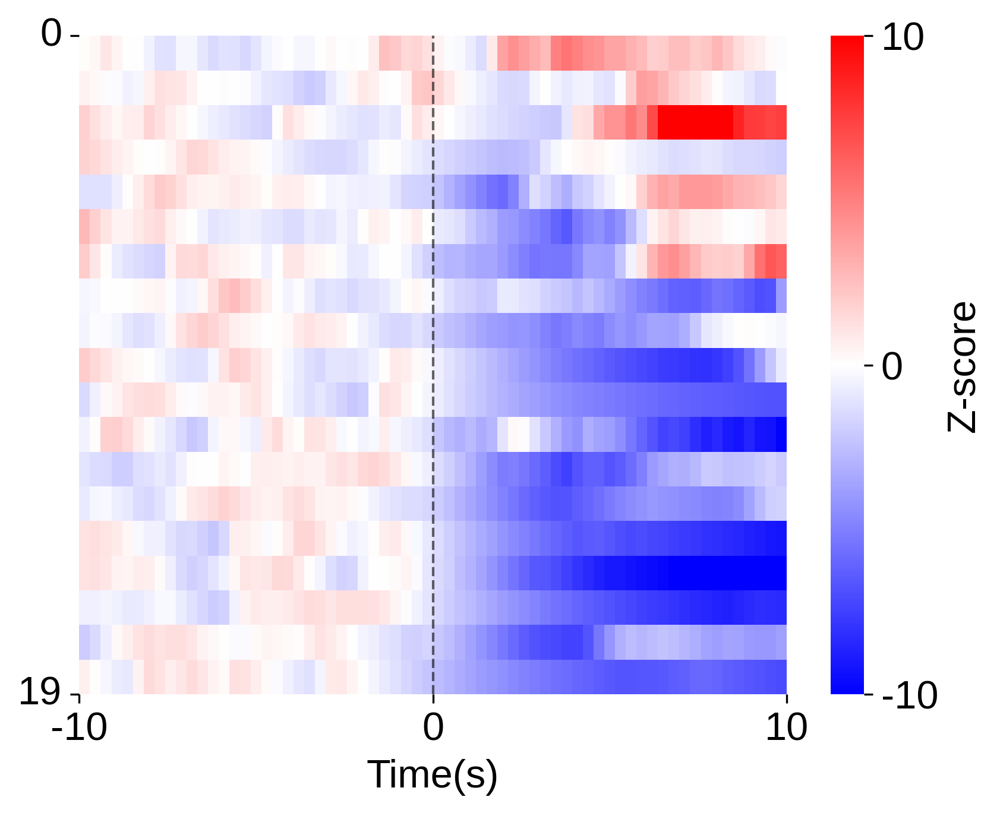

In [315]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_hungry_sort = inhibited_hungry_cluster0.copy()
inhibited_hungry_sort['count_gt_2'] = (inhibited_hungry_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_hungry_sorted = inhibited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

fig, ax = plt.subplots(dpi = 300)
ax = sb.heatmap(inhibited_hungry_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_hungry_sorted)])
ax.set_yticklabels([0, len(inhibited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 16)
ax.tick_params(labelsize = 16)
cbar = ax.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 16)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 16)

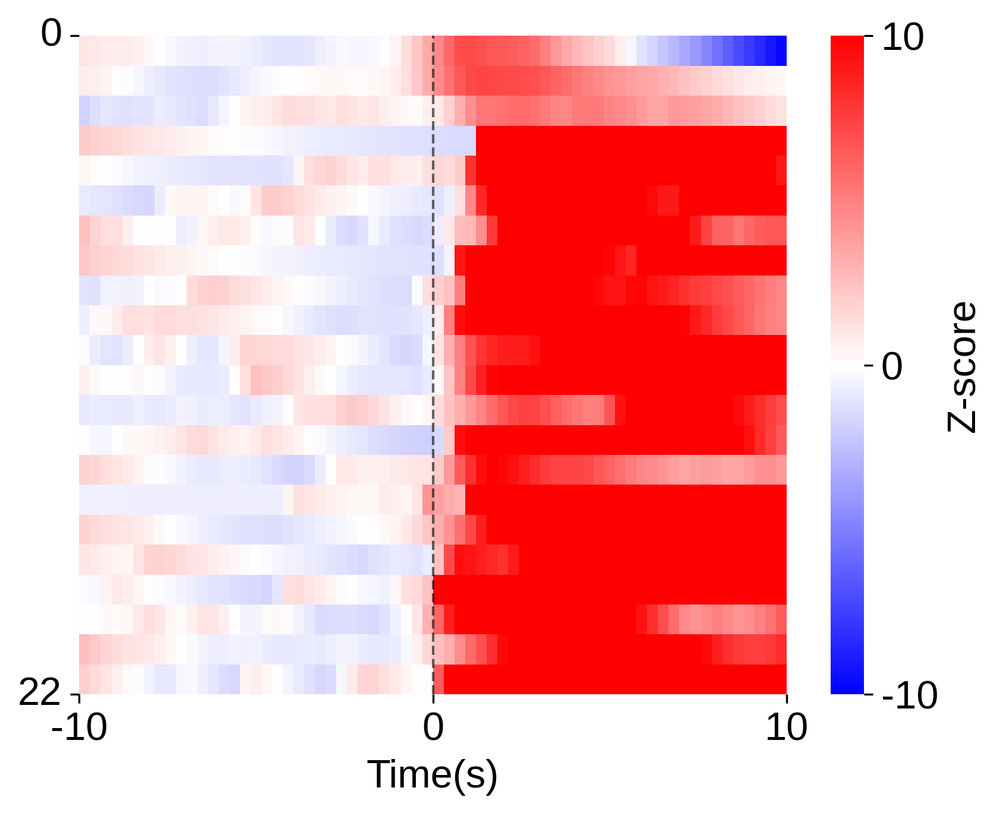

In [316]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_hungry_sort = excited_hungry_cluster0.copy()
excited_hungry_sort['count_gt_2'] = (excited_hungry_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_hungry_sorted = excited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)
fig, ax = plt.subplots(dpi = 300)
ax = sb.heatmap(excited_hungry_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_hungry_sorted)])
ax.set_yticklabels([0, len(excited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 16)
ax.tick_params(labelsize = 16)
cbar = ax.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 16)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 16)

In [317]:
len(all_dataframes)

19

In [318]:
len(np.unique(inhibited_hungry_cluster0.Animal_ID))

8

In [319]:
len(np.unique(excited_hungry_cluster0.Animal_ID))

7

In [320]:

excited_satiated_cluster0 = excited_satiated[excited_satiated.Cluster_Kmeans==0]
inhibited_satiated_cluster0 = inhibited_satiated[inhibited_satiated.Cluster_Kmeans==0]

excited_satiated_indices_cluster0 = excited_satiated_cluster0.index.values.tolist()
inhibited_satiated_indices_cluster0 = inhibited_satiated_cluster0.index.values.tolist()

excited_satiated_mean_cluster0 = excited_satiated_cluster0.iloc[:,4:].mean(axis=0).astype('float')
excited_satiated_sem_cluster0 = excited_satiated_cluster0.iloc[:,4:].sem(axis=0).astype('float')
inhibited_satiated_mean_cluster0 = inhibited_satiated_cluster0.iloc[:,4:].mean(axis=0).astype('float')
inhibited_satiated_sem_cluster0 = inhibited_satiated_cluster0.iloc[:,4:].sem(axis=0).astype('float')

In [321]:
excited_satiated_cluster0

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
68,2Z4,14,M,0,2.023182,1.625355,1.274523,0.929863,0.673892,0.629298,...,-1.946891,-2.073411,-2.036039,-1.919628,-2.169601,-2.361275,-2.54096,-2.717938,-2.819419,-2.932113
77,2Z4,26,M,0,2.364077,2.058813,1.799431,1.559603,1.337857,1.132828,...,10.461779,9.568887,8.743312,7.979977,7.274191,6.621616,6.018238,5.46035,4.944522,4.430037
85,2Z4,34,M,0,-1.603898,-1.756859,-1.8755,-1.470293,-1.629883,-1.643227,...,-0.105102,3.704544,3.185713,3.693277,4.95076,3.978345,3.091563,2.323134,1.929055,5.504413
310,1I5,12,M,0,1.71399,1.699715,0.903306,0.53296,-0.142009,-0.917714,...,2.253525,1.686319,2.078232,2.242571,2.418108,2.941145,4.197327,5.049049,4.60897,4.155083
343,1I5,50,M,0,0.500902,0.113577,-0.263242,-0.584417,-0.927017,-0.711978,...,0.629977,0.173364,-0.261296,-0.635892,-0.791679,-1.1106,-1.462742,-1.52037,-1.080978,-0.022991
376,1H6,17,F,0,0.98478,0.49014,0.083484,-0.280974,-0.607612,0.585252,...,-0.373787,-0.690795,-0.941204,-0.947857,-0.825368,-1.055567,-1.301827,-1.522533,-1.669911,-1.843067
400,1H6,60,F,0,0.172618,-0.097825,-0.32245,-0.525723,-0.709672,-0.876135,...,18.272292,18.869363,16.841701,15.00679,13.346308,11.941252,11.764536,12.895438,11.876719,10.408163
466,4N6,21,M,0,1.326403,1.177232,1.043048,0.912106,0.784328,0.659639,...,23.605049,27.415383,28.764341,27.963461,27.181936,26.419298,25.67509,24.948868,24.240196,23.492032
621,2I5,13,M,0,1.145185,1.485405,2.048906,1.915751,1.200333,0.792077,...,4.832948,4.147135,4.876712,5.789954,5.456516,4.504067,3.607315,2.763003,1.968065,1.490775
663,2I5,64,M,0,1.100803,1.295795,1.015499,0.765997,0.785275,1.176442,...,29.699128,29.190159,28.586751,28.040537,28.424342,29.255839,28.975566,28.38498,27.792363,27.860363


In [322]:
excited_satiated_mean_cluster0

0     0.563367
1     0.443218
2     0.261185
3     0.098514
4    -0.003815
        ...   
61    6.627327
62    6.572757
63    6.505275
64    6.533057
65    6.714311
Length: 66, dtype: float64

19

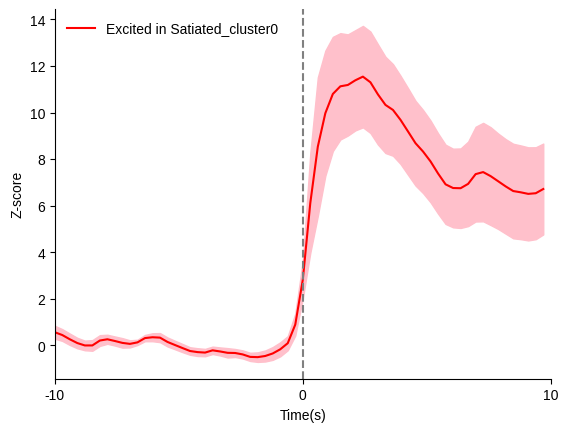

In [323]:
x=np.arange(Bins)
y=excited_satiated_mean_cluster0
err = excited_satiated_sem_cluster0
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Excited in Satiated_cluster0', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0)
len(excited_satiated_cluster0)

8

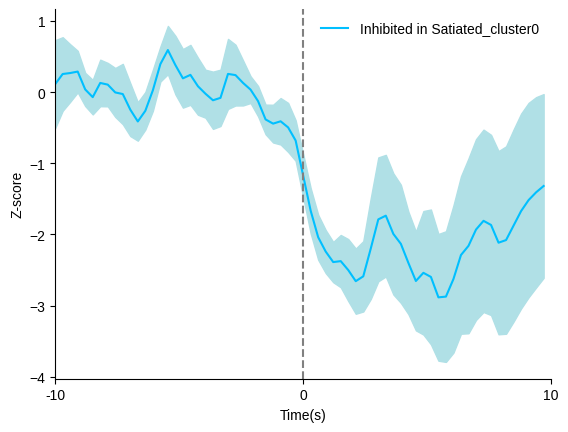

In [324]:
x=np.arange(Bins)
y=inhibited_satiated_mean_cluster0
err = inhibited_satiated_sem_cluster0
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Inhibited in Satiated_cluster0', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-,1)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


19

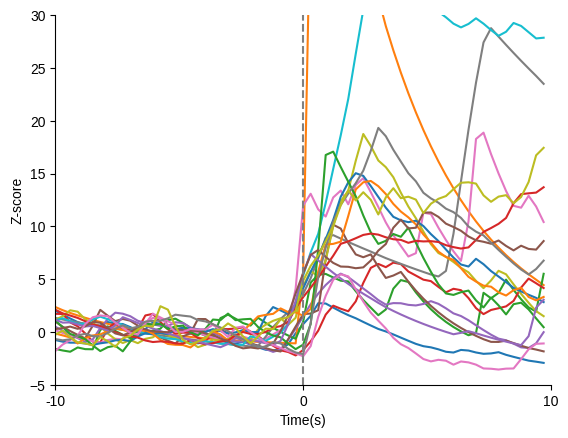

In [325]:
x=np.arange(Bins)
y=excited_satiated_cluster0.iloc[:,4:]
err = excited_hungry_sem_cluster0
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated_cluster0)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


8

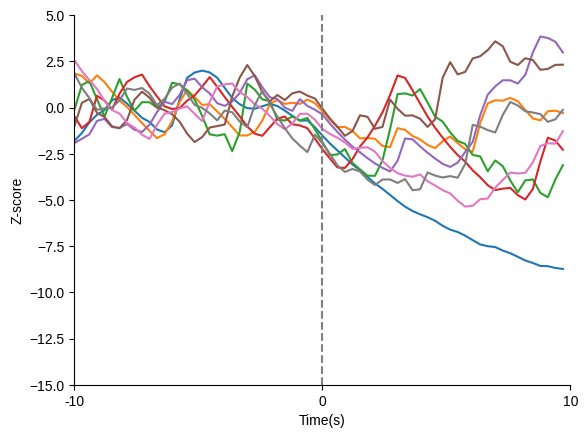

In [326]:
x=np.arange(Bins)
y=inhibited_satiated_cluster0.iloc[:,4:]
err = inhibited_satiated_sem_cluster0
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster0)

[Text(0, 0, '0'), Text(0, 8, '8')]

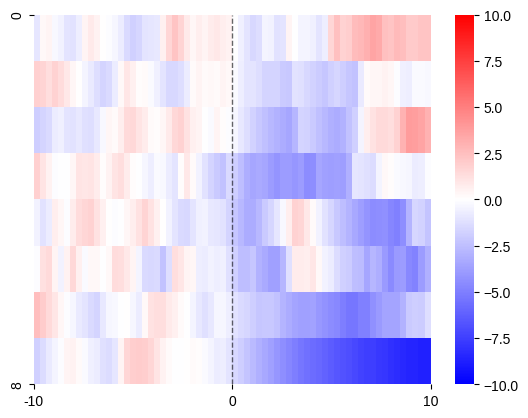

In [327]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_satiated_sort = inhibited_satiated_cluster0.copy()
inhibited_satiated_sort['count_gt_2'] = (inhibited_satiated_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_satiated_sorted = inhibited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(inhibited_satiated_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_satiated_sorted)])
ax.set_yticklabels([0, len(inhibited_satiated_sorted)])

[Text(0, 0, '0'), Text(0, 19, '19')]

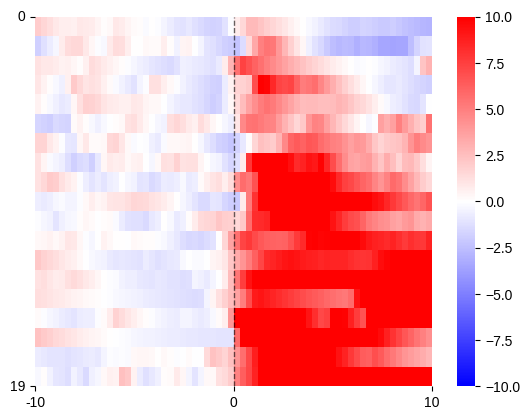

In [328]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_satiated_sort = excited_satiated_cluster0.copy()
excited_satiated_sort['count_gt_2'] = (excited_satiated_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_satiated_sorted = excited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(excited_satiated_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_satiated_sorted)])
ax.set_yticklabels([0, len(excited_satiated_sorted)])

22

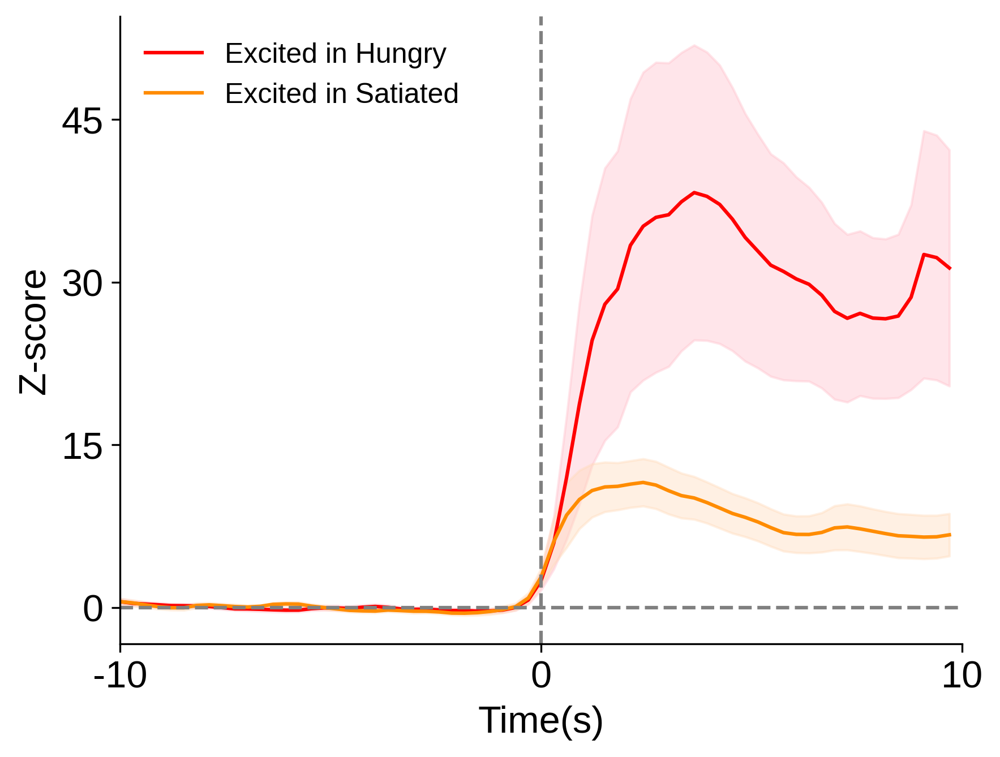

In [329]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster0
z=excited_satiated_mean_cluster0
erry = excited_hungry_sem_cluster0
errz = excited_satiated_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Excited in Satiated', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster0)

19

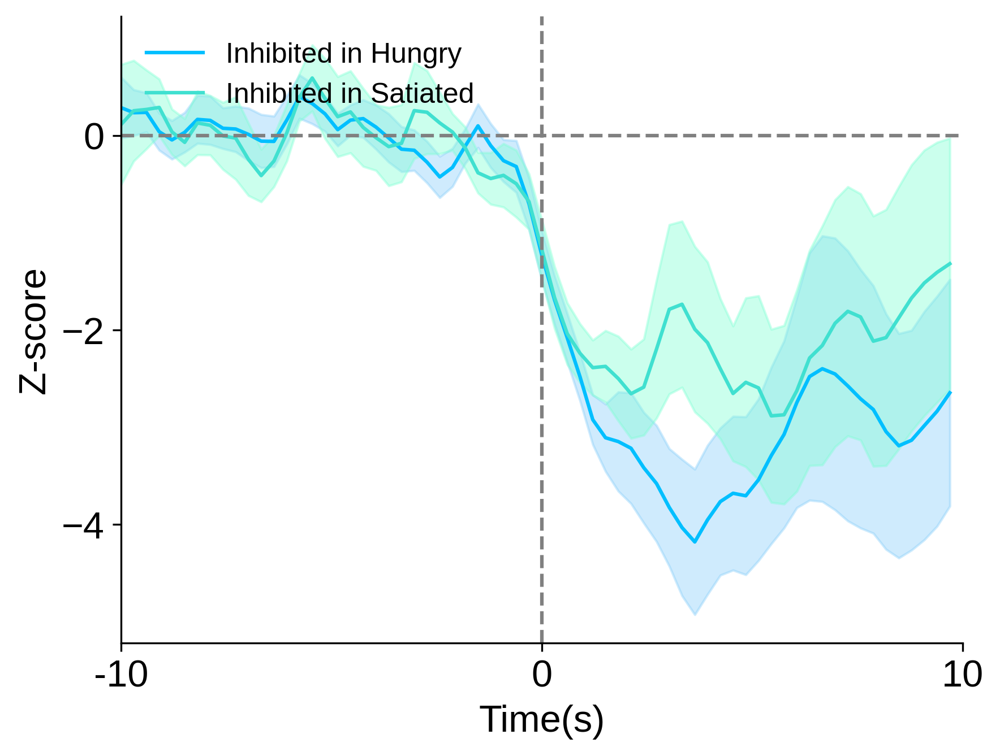

In [330]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster0
z=inhibited_satiated_mean_cluster0
erry = inhibited_hungry_sem_cluster0
errz = inhibited_satiated_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Inhibited in Hungry', color = 'deepskyblue')
ax.plot(x, z, label = 'Inhibited in Satiated', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster0)

In [331]:
excited_hungry_insatiated_mean_cluster0 = trace_satiated.iloc[excited_indices_cluster0, 4:].mean(axis=0)
excited_hungry_insatiated_sem_cluster0 =  trace_satiated.iloc[excited_indices_cluster0, 4:].sem(axis=0)
inhibited_hungry_insatiated_mean_cluster0 = trace_satiated.iloc[inhibited_indices_cluster0, 4:].mean(axis=0)
inhibited_hungry_insatiated_sem_cluster0 =  trace_satiated.iloc[inhibited_indices_cluster0, 4:].sem(axis=0)
excited_satiated_inhungry_mean_cluster0 = trace_hungry.iloc[excited_satiated_indices_cluster0, 4:].mean(axis=0)
excited_satiated_inhungry_sem_cluster0 =  trace_hungry.iloc[excited_satiated_indices_cluster0, 4:].sem(axis=0)
inhibited_satiated_inhungry_mean_cluster0 = trace_hungry.iloc[inhibited_satiated_indices_cluster0, 4:].mean(axis=0)
inhibited_satiated_inhungry_sem_cluster0 =  trace_hungry.iloc[inhibited_satiated_indices_cluster0, 4:].sem(axis=0)

In [332]:
trace_hungry.iloc[excited_indices_cluster0, :]

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
97,2Z4,51,M,0,0.332760,0.110951,-0.068129,-0.225902,-0.364903,-0.487367,...,15.149322,14.025036,14.434997,13.409372,13.433087,12.426147,11.108644,10.489783,10.249416,9.017189
138,2Z4,113,M,0,-0.586464,-0.600955,-0.612788,-0.623326,-0.632711,-0.641069,...,59.819969,56.737758,59.141655,55.461821,54.623108,51.676831,48.591973,46.055614,47.056207,43.675532
149,2Z4,130,M,0,2.467878,1.713425,1.296032,1.267527,0.639921,-0.005429,...,10.252875,8.951648,7.365546,6.135705,6.131704,5.388102,5.955076,6.378254,6.611535,6.635319
151,2Z4,132,M,0,2.071695,1.860189,1.674208,1.496585,1.326945,1.164929,...,149.234952,142.425831,135.922717,129.711859,123.780121,118.114961,140.516896,223.581086,220.100735,209.301314
170,2Z4,154,M,0,2.133475,1.903869,1.703411,1.513252,1.332864,1.161744,...,56.425988,58.183550,65.683668,73.618505,83.446869,97.146956,105.059666,104.767412,106.420487,108.491924
260,4B6,72,F,0,0.778695,0.634724,0.409515,0.153146,-0.116871,-0.386348,...,2.382890,2.071771,1.773131,1.439109,1.181541,0.976436,0.768182,0.575836,0.415017,0.281458
307,1I5,9,M,0,-1.759831,-1.301741,-1.006416,-1.103392,-1.207346,-1.069449,...,3.874825,3.683523,3.443807,3.228734,2.864204,2.490670,2.183549,1.814267,1.464212,1.168250
457,4N6,12,M,0,1.722128,1.595723,1.320984,1.066262,0.786524,0.479276,...,3.587581,3.767733,3.939313,3.685067,3.464833,3.570037,3.947773,4.342855,4.428659,4.016292
473,4N6,28,M,0,-0.903662,-0.741272,-0.833894,-0.880488,-0.800825,-0.623693,...,13.059185,12.398991,11.795403,11.043048,10.314913,9.599305,8.886866,8.212518,7.623436,6.955639
480,4N6,36,M,0,1.928719,1.463099,1.044060,0.634966,0.235582,-0.154322,...,40.147678,45.453524,60.826729,64.667937,70.227723,80.650049,97.165611,108.197613,106.370786,103.223616


In [333]:
trace_satiated.iloc[excited_indices_cluster0, :]

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
97,2Z4,51,M,0,0.368039,0.013766,-0.272258,-0.524252,-0.746265,-0.941863,...,0.658015,0.295340,-0.024185,0.525078,0.346632,0.021004,-0.265882,-0.518635,-0.741316,-0.952411
138,2Z4,113,M,0,2.682544,2.249344,1.895588,1.580548,1.299988,1.050135,...,51.357495,45.629079,40.527612,35.984476,31.938566,28.335462,25.126701,22.269124,19.724295,17.284411
149,2Z4,130,M,0,-0.149902,-0.310831,-0.480548,-0.651791,-0.752424,-0.838948,...,-0.160292,-0.209802,-0.247142,-0.070235,-0.078020,-0.272520,-0.508321,-0.712138,-0.863156,-0.987484
151,2Z4,132,M,0,-1.334828,-1.389516,-1.367228,-1.239159,-0.809565,-0.488640,...,1.172875,1.006063,0.794979,0.523989,0.426737,0.618554,1.428610,2.120602,2.392546,2.417899
170,2Z4,154,M,0,2.427247,2.239099,1.677300,1.094214,1.126881,0.685229,...,1.153040,1.095374,1.261005,1.111798,0.687249,0.438165,0.215829,-0.276786,-0.703052,-0.676965
260,4B6,72,F,0,-0.416998,-0.333795,-0.284585,-0.277072,-0.228054,-0.096808,...,0.649178,0.409804,0.168142,-0.077824,-0.328394,-0.582456,-0.801876,-0.990993,-1.182776,-1.404300
307,1I5,9,M,0,-0.049757,-0.253122,-0.525048,-0.764959,-1.008903,-1.041461,...,2.496579,2.618777,2.274252,2.093178,2.154746,2.366812,2.080255,1.749833,1.451433,1.459237
457,4N6,12,M,0,1.291534,1.637872,1.710839,1.691518,1.504156,1.349032,...,0.797427,0.601036,0.410489,0.225611,0.048107,-0.113547,-0.160069,-0.035378,0.204894,0.594879
473,4N6,28,M,0,1.888222,1.725472,1.579296,1.436858,1.298063,1.162818,...,27.880376,27.065249,26.270970,25.497006,24.742837,24.007958,23.291873,22.594104,21.914181,21.197463
480,4N6,36,M,0,0.511266,0.432245,0.361131,0.291704,0.223924,0.157754,...,1.534707,1.437426,1.342454,1.249736,1.159219,1.070850,0.984579,0.900355,0.818130,0.731282


In [334]:
len(excited_satiated_indices_cluster0)

19

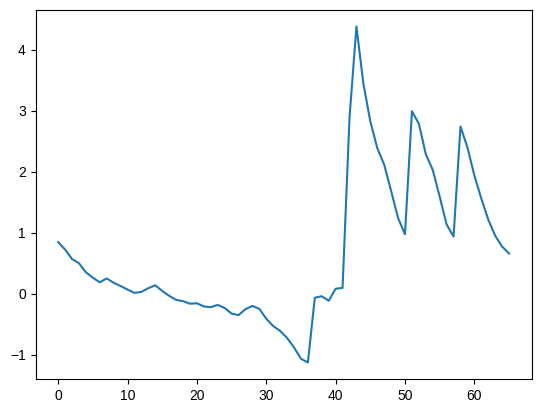

In [335]:
plt.plot(trace_hungry_cluster0.iloc[:28, 4:].mean(axis=0))

22

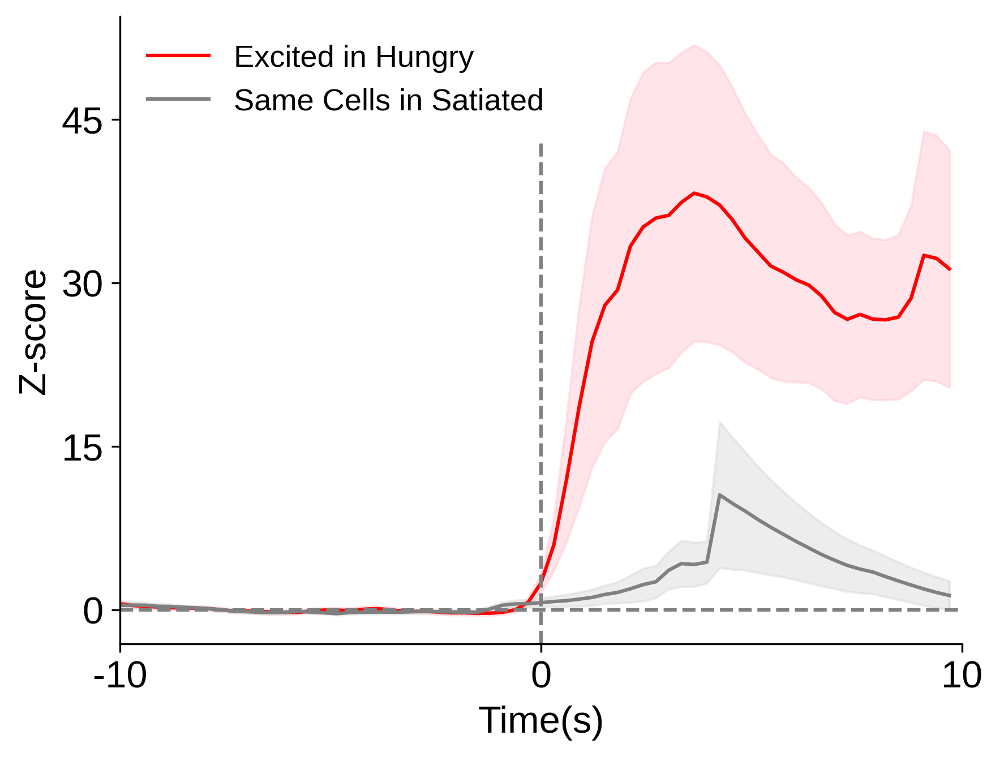

In [336]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster0
z=excited_hungry_insatiated_mean_cluster0
erry = excited_hungry_sem_cluster0
errz = excited_hungry_insatiated_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Same Cells in Satiated', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster0)

19

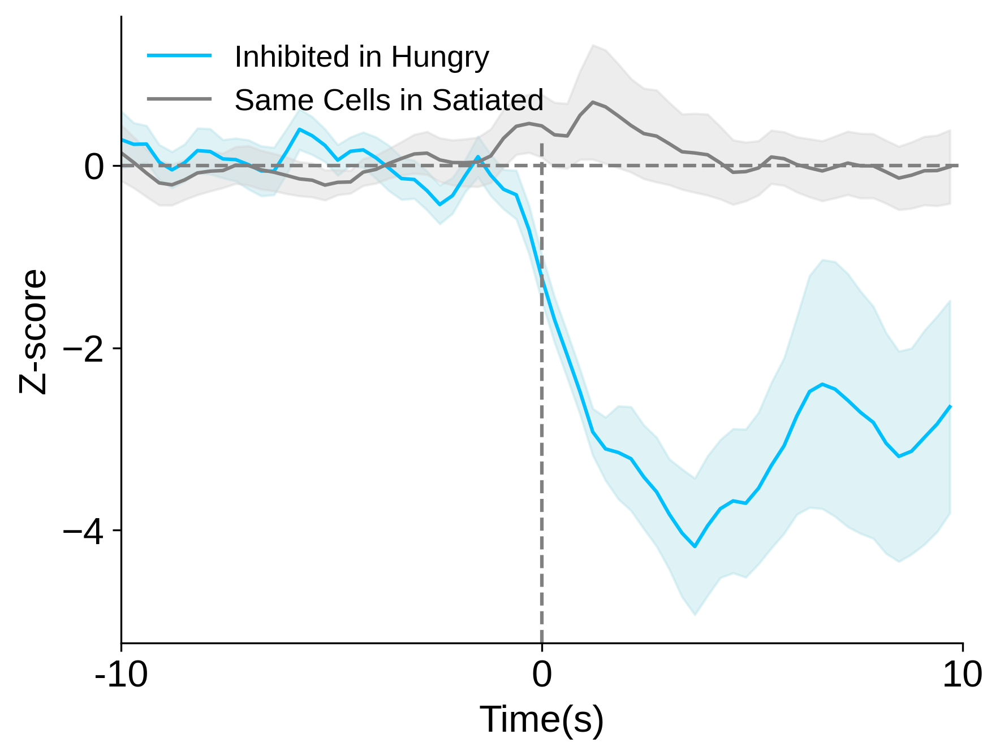

In [337]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster0
z=inhibited_hungry_insatiated_mean_cluster0
erry = inhibited_hungry_sem_cluster0
errz = inhibited_hungry_insatiated_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Hungry', color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Satiated', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster0)

19

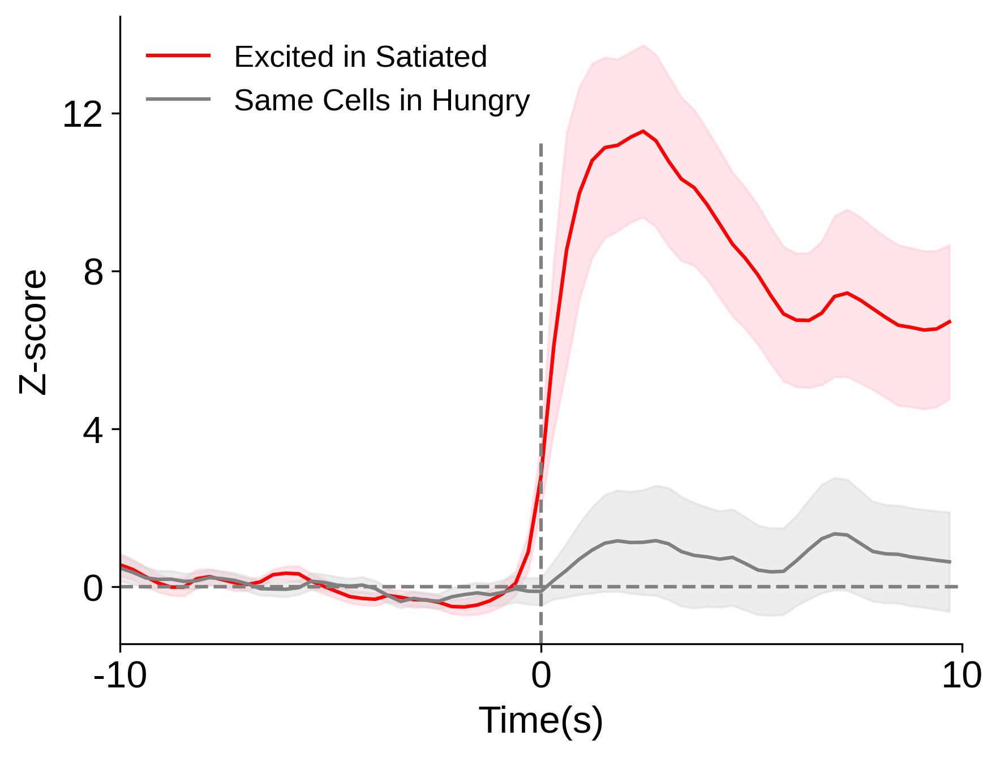

In [338]:
x=np.arange(Bins)
y=excited_satiated_mean_cluster0
z=excited_satiated_inhungry_mean_cluster0
erry = excited_satiated_sem_cluster0
errz = excited_satiated_inhungry_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Satiated',color='red')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated_cluster0)

8

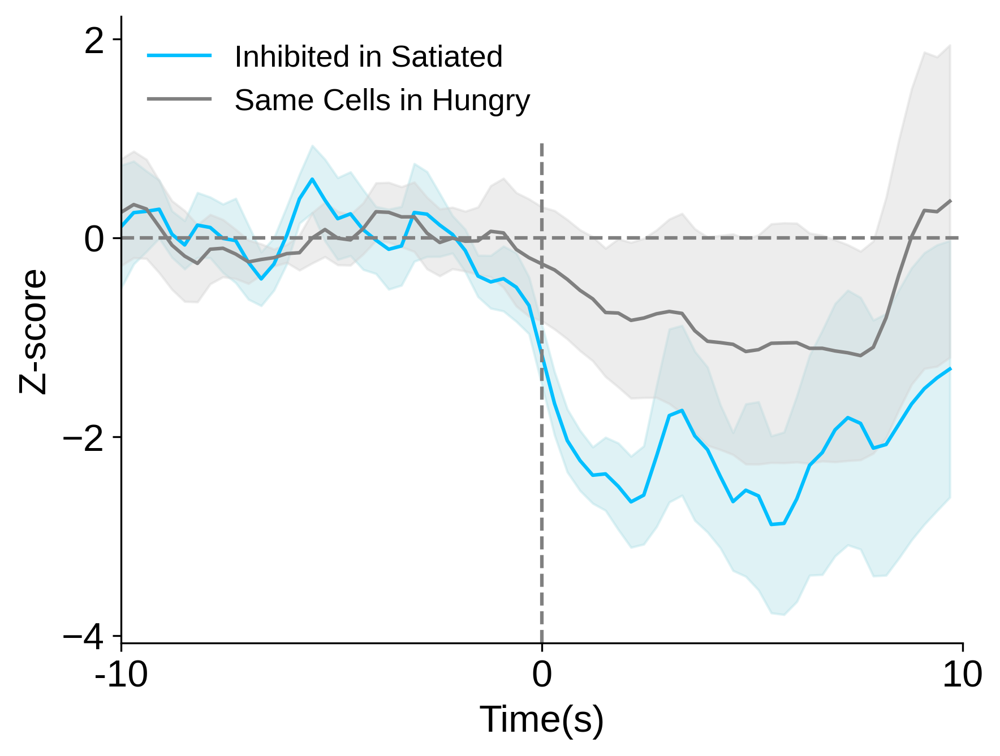

In [339]:
x=np.arange(Bins)
y=inhibited_satiated_mean_cluster0
z=inhibited_satiated_inhungry_mean_cluster0
erry = inhibited_satiated_sem_cluster0
errz = inhibited_satiated_inhungry_sem_cluster0
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Satiated',color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster0)

### Cluster 1 Partial Supression

In [340]:
trace_hungry_cluster1 = trace_hungry[trace_hungry.Cluster_Kmeans==1]
trace_hungry_cluster1

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,M,1,-0.974356,-1.036490,-1.091343,-1.143929,-1.194341,-1.242669,...,-0.266947,-0.308855,-0.352319,-0.389579,-0.461036,-0.526811,-0.602732,-0.675516,-0.700053,-0.751454
1,6S5,2,M,1,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,...,2.944911,2.857944,2.584875,2.047427,2.060740,2.149064,1.723274,2.655658,3.060550,3.285084
2,6S5,3,M,1,1.162811,1.060209,0.978639,0.825957,0.676933,1.006085,...,16.338843,15.991282,15.647480,15.307396,15.011186,14.822836,14.617208,14.510671,14.186479,13.835385
3,6S5,4,M,1,0.552738,0.341283,0.095955,-0.134774,-0.351774,-0.174224,...,8.961927,8.230150,7.515375,6.843135,6.210898,5.616283,5.080222,5.604845,6.244997,7.236901
4,6S5,5,M,1,0.105960,0.052360,-0.021338,-0.186413,-0.425214,-0.617182,...,-2.267180,-2.236629,-1.877391,-1.288693,-1.043495,-1.113494,-1.101320,-1.054556,-1.217426,-1.357268
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,F,1,-1.010739,-1.068321,-1.116711,-1.160988,-1.201501,-1.238571,...,-1.562624,-1.568999,-1.574832,-1.580170,-1.585053,-1.589522,-1.593610,-1.597352,-1.600775,-1.604152
1107,8H6,71,F,1,-0.577090,-0.675036,-0.758042,-0.834600,-0.905210,-0.970334,...,-1.267579,-1.264059,-1.301304,-1.335656,-1.367339,-1.396560,-1.423511,-1.448369,-1.320394,-1.284156
1108,8H6,73,F,1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1109,8H6,75,F,1,2.538170,1.966359,1.517038,1.131163,0.799775,0.515181,...,0.838804,0.548699,0.299558,0.085598,-0.098151,-0.255953,-0.391473,-0.507857,-0.607806,-0.700043


381 neurons in Combined


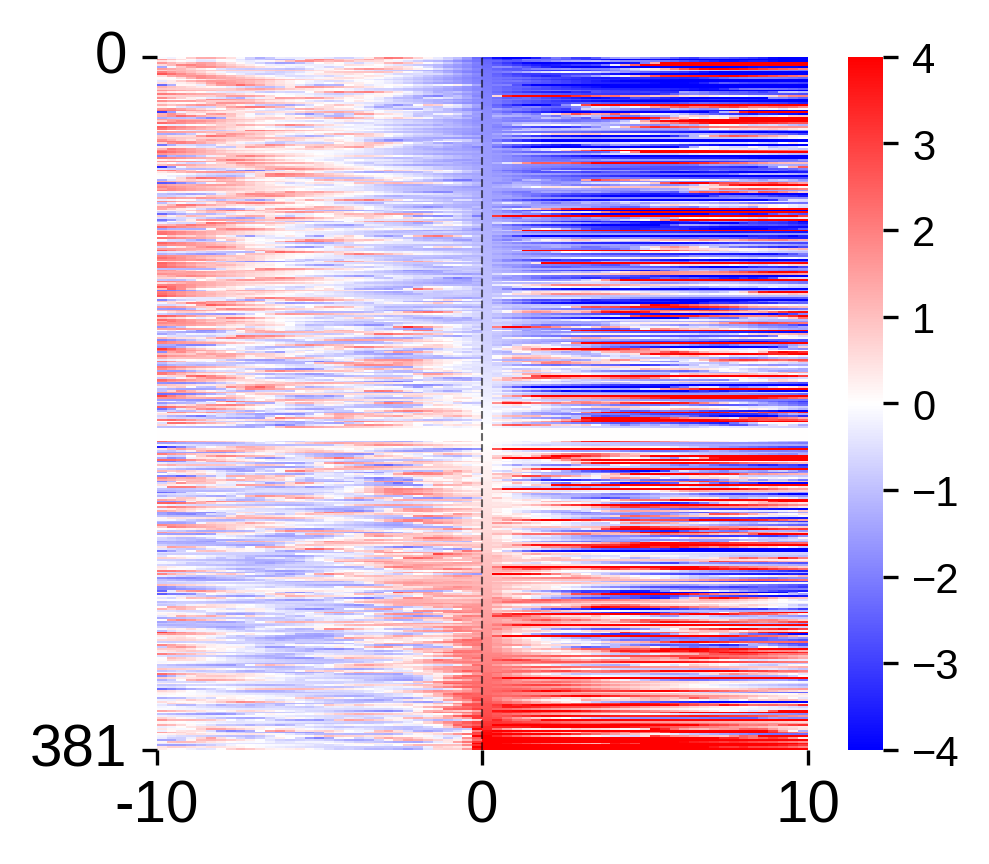

In [341]:
# Sorting and creating the heatmap
tracesorted = trace_hungry_cluster1.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 4:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_hungry_cluster1)} neurons in Combined")

plt.show()

In [342]:
trace_satiated_cluster1 = trace_satiated[trace_satiated.Cluster_Kmeans==1]
trace_satiated_cluster1

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
0,6S5,1,M,1,1.250164,1.550362,1.682813,1.502277,1.316174,1.381780,...,-1.661438,-1.552346,-1.662736,-1.524315,-1.514779,-1.621969,-1.753524,-1.696078,-1.436327,-1.319235
1,6S5,2,M,1,-0.781597,-0.850040,-0.933220,-0.758515,-0.723279,-0.768357,...,4.942090,4.598078,4.218103,3.853804,3.628008,3.303453,3.204487,3.324963,3.227698,3.054948
2,6S5,3,M,1,1.612936,1.535117,1.764393,1.613412,1.056815,0.536475,...,4.434390,4.337976,3.995484,4.115094,4.032020,3.491168,3.140567,2.567306,2.348119,1.719107
3,6S5,4,M,1,1.675302,1.374952,1.115345,0.693751,0.213133,-0.238883,...,-0.138461,-0.459211,-0.562967,-0.617309,-0.947741,-1.183564,-1.401034,-1.594933,-1.930127,-2.225900
4,6S5,5,M,1,-2.491371,-2.571294,-2.379932,-1.606490,-0.517350,0.108520,...,-1.556438,-1.607345,-1.753781,-1.797681,-1.444902,-0.907563,-0.731719,-0.958757,-1.160242,-1.276373
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1106,8H6,63,F,1,0.451044,1.224173,1.131703,1.585711,2.074003,1.771819,...,-0.445855,-0.533855,-0.614376,-0.688052,-0.755466,-0.817150,-0.873591,-0.925234,-0.972488,-1.019103
1107,8H6,71,F,1,2.386009,2.072847,1.807453,1.562677,1.336918,1.128699,...,-1.304324,-1.307347,-1.310135,-1.312707,-1.315078,-1.317266,-1.319283,-1.321144,-1.322860,-1.324568
1108,8H6,73,F,1,2.798212,2.310925,1.919094,1.575196,1.273366,1.008457,...,-0.889857,-0.890144,-0.890396,-0.890616,-0.890810,-0.232855,0.919899,0.698229,0.503676,0.319983
1109,8H6,75,F,1,-0.427598,-0.495524,-0.548900,-0.594739,-0.634105,2.700861,...,-0.871930,-0.872156,-0.872349,-0.872515,-0.872658,-0.872781,-0.872886,-0.872976,-0.873054,-0.873126


381 neurons in Combined


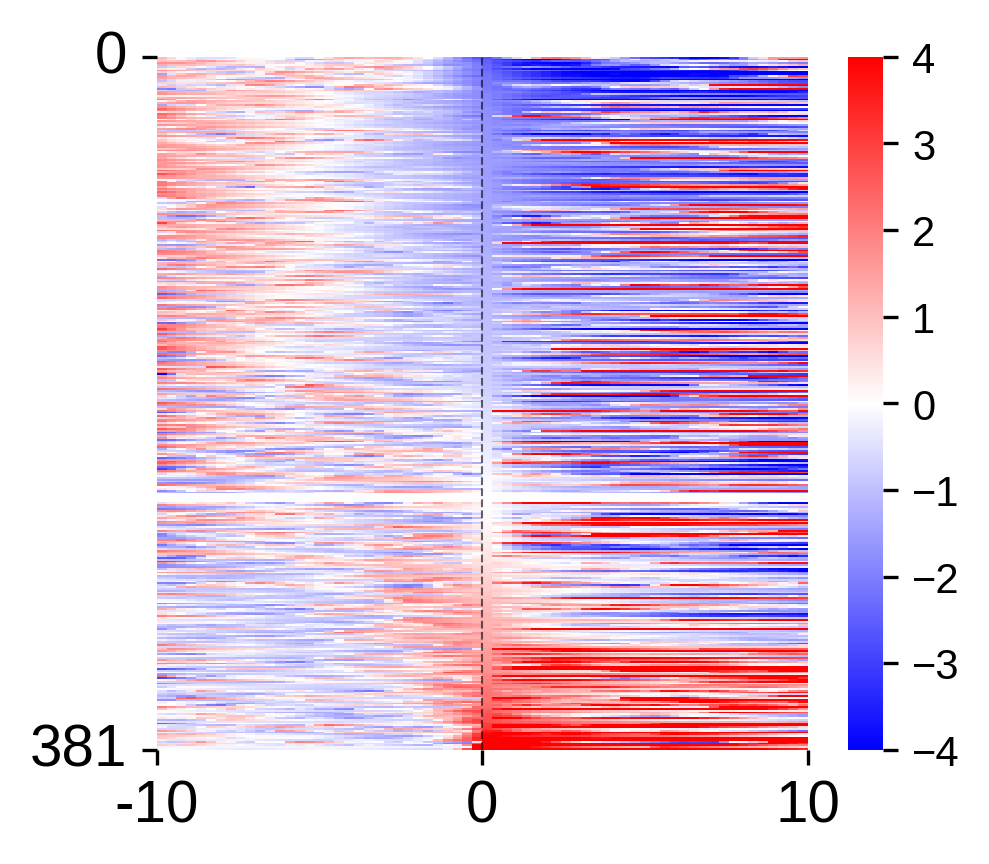

In [343]:
# Sorting and creating the heatmap
tracesorted = trace_satiated_cluster1.sort_values(by=Bins_before, axis=0)
plt.figure(figsize=(3.5,3), dpi=300)
ax = sb.heatmap(tracesorted.iloc[:, 4:], vmin=-4, vmax=4, cmap="bwr")  # Exclude the last two columns (Animal_ID and cell_id)
ax.set_xticks([0, Bins_before, Bins])
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0, len(tracesorted)])
ax.set_yticklabels([0, len(tracesorted)])
ax.tick_params(labelsize = 14)
ax.axvline(Bins_before, ls = '--', lw = 0.5, c = 'black', alpha = 0.6)
print(f"{len(trace_satiated_cluster1)} neurons in Combined")

plt.show()

In [344]:

excited_hungry_cluster1 = excited_hungry[excited_hungry.Cluster_Kmeans==1]
inhibited_hungry_cluster1 = inhibited_hungry[inhibited_hungry.Cluster_Kmeans==1]

excited_indices_cluster1 = excited_hungry_cluster1.index.values.tolist()
inhibited_indices_cluster1 = inhibited_hungry_cluster1.index.values.tolist()


excited_hungry_mean_cluster1 = excited_hungry_cluster1.iloc[:,4:].mean(axis=0).astype('float')
excited_hungry_sem_cluster1 = excited_hungry_cluster1.iloc[:,4:].sem(axis=0).astype('float')
inhibited_hungry_mean_cluster1 = inhibited_hungry_cluster1.iloc[:,4:].mean(axis=0).astype('float')
inhibited_hungry_sem_cluster1 = inhibited_hungry_cluster1.iloc[:,4:].sem(axis=0).astype('float')


In [345]:
excited_hungry_mean

0      0.456760
1      0.326215
2      0.301072
3      0.295354
4      0.260149
        ...    
61    19.019910
62    19.912859
63    22.088013
64    21.770124
65    21.066728
Length: 66, dtype: float64

15

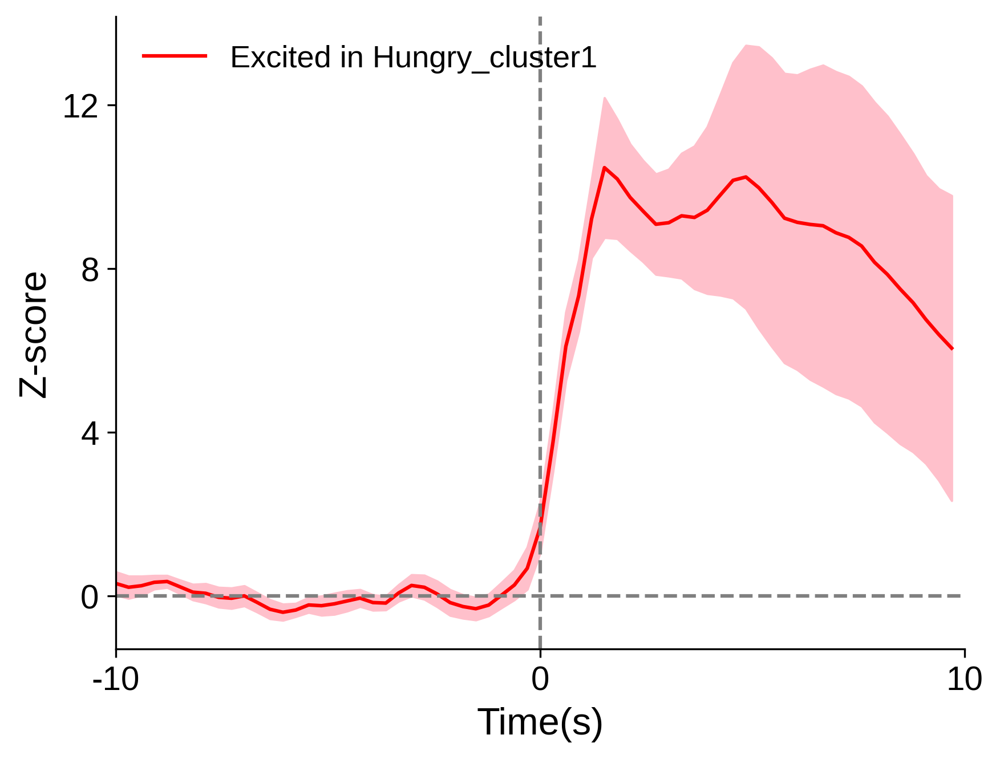

In [346]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster1
err = excited_hungry_sem_cluster1
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Excited in Hungry_cluster1', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0, fontsize='13')
len(excited_hungry_cluster1)

12

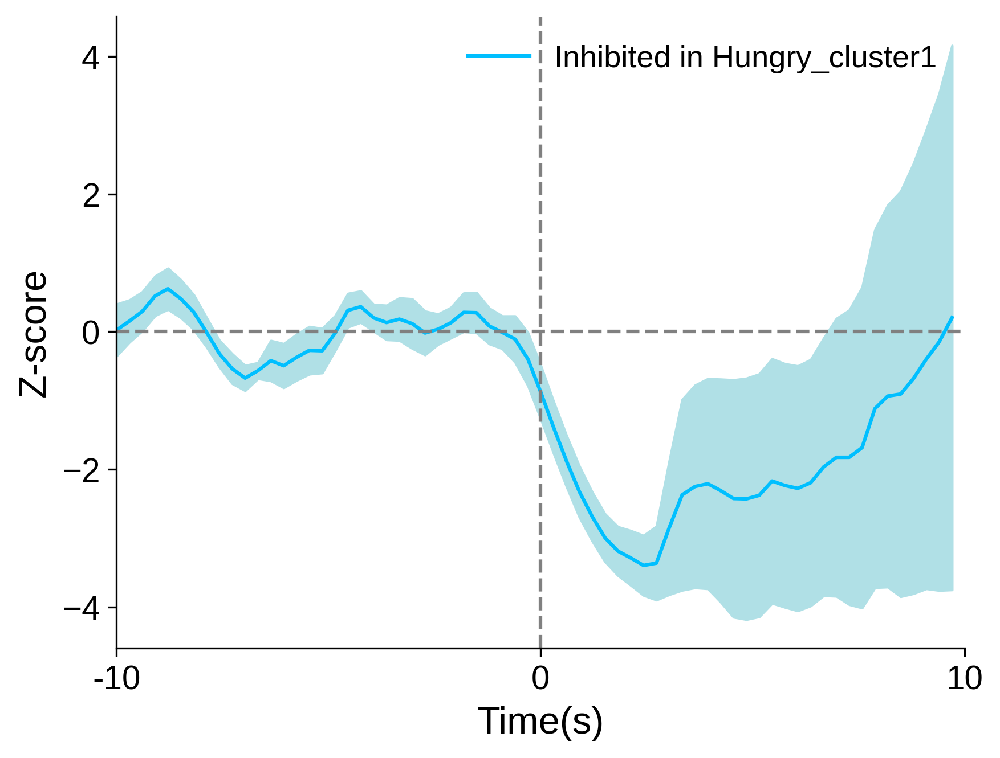

In [347]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster1
err = inhibited_hungry_sem_cluster1
fig, ax = plt.subplots(dpi = 300)
ax.plot(x, y, label = 'Inhibited in Hungry_cluster1', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.tick_params(labelsize = 14)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xticks([0, Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3.5,2)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


15

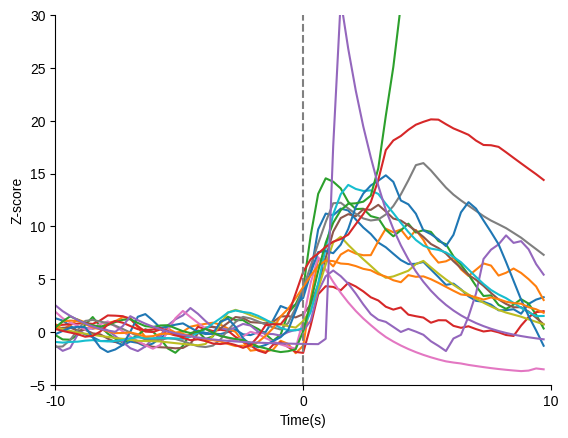

In [348]:
x=np.arange(Bins)
y=excited_hungry_cluster1.iloc[:,4:]
err = excited_hungry_sem_cluster1
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


12

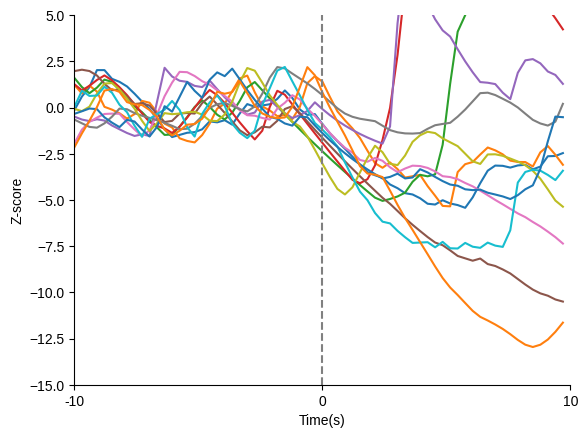

In [349]:
x=np.arange(Bins)
y=inhibited_hungry_cluster1.iloc[:,4:]
err = inhibited_hungry_sem_cluster1
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster1)

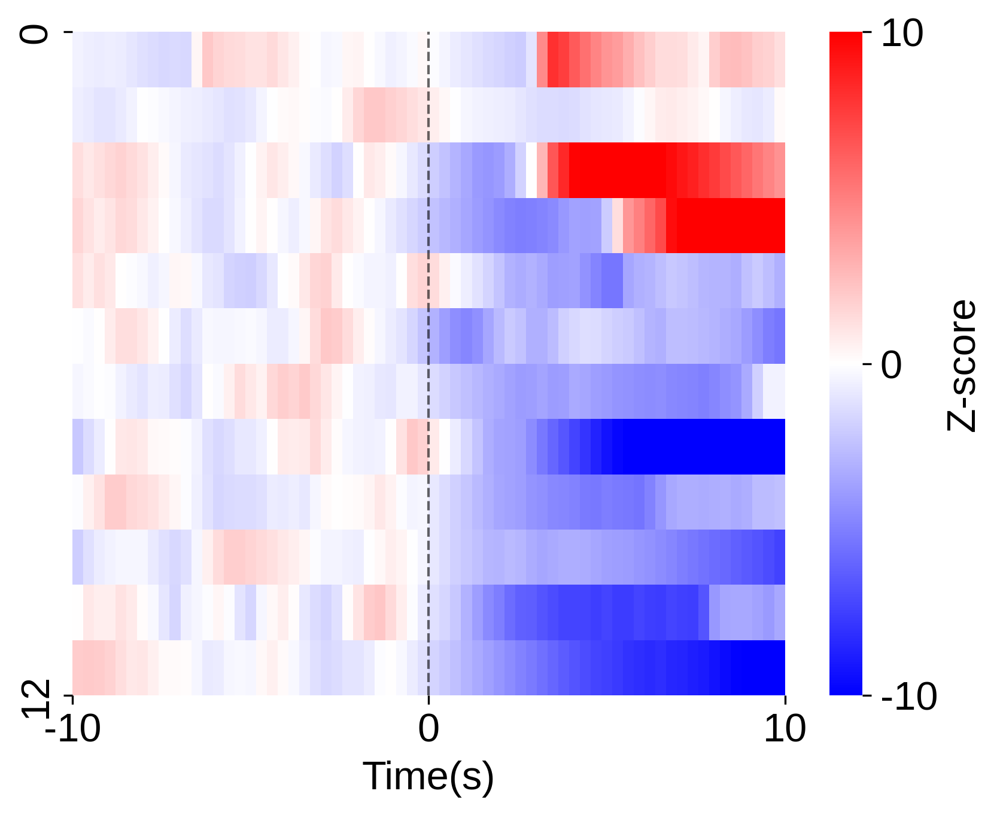

In [350]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_hungry_sort = inhibited_hungry_cluster1.copy()
inhibited_hungry_sort['count_gt_2'] = (inhibited_hungry_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_hungry_sorted = inhibited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

fig, ax = plt.subplots(dpi = 300)
ax = sb.heatmap(inhibited_hungry_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_hungry_sorted)])
ax.set_yticklabels([0, len(inhibited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 16)
ax.tick_params(labelsize = 16)
cbar = ax.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 16)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 16)

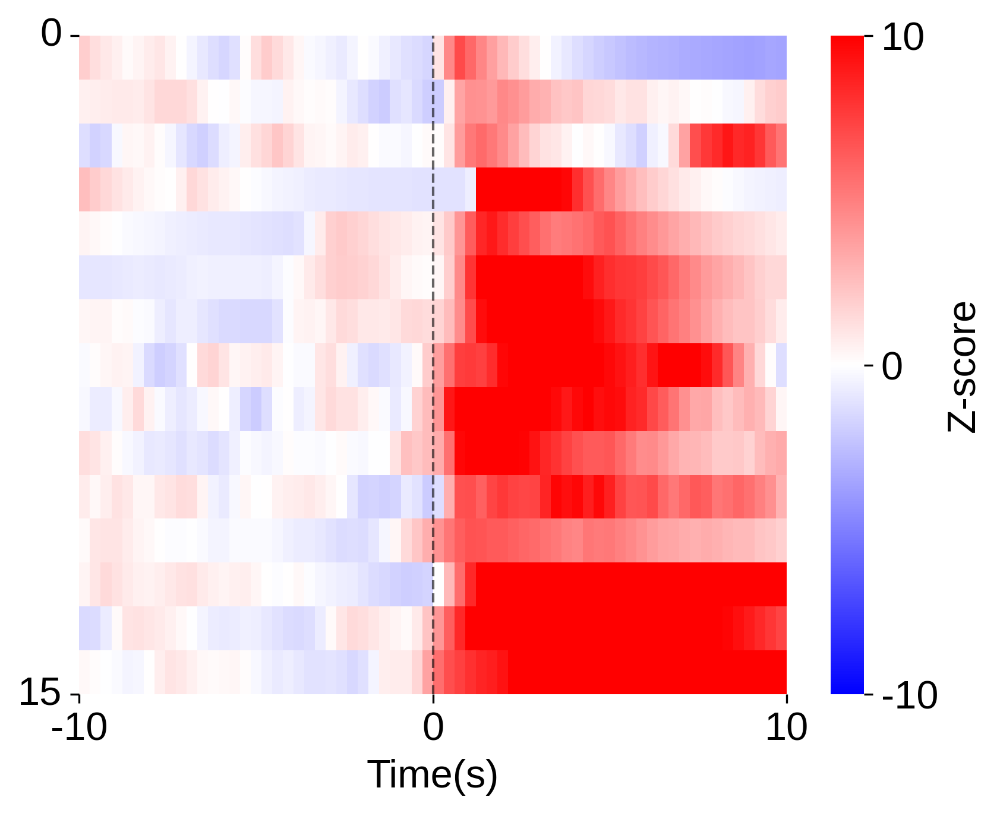

In [351]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_hungry_sort = excited_hungry_cluster1.copy()
excited_hungry_sort['count_gt_2'] = (excited_hungry_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_hungry_sorted = excited_hungry_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)
fig, ax = plt.subplots(dpi = 300)
ax = sb.heatmap(excited_hungry_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_hungry_sorted)])
ax.set_yticklabels([0, len(excited_hungry_sorted)])
ax.set_xlabel('Time(s)', fontsize = 16)
ax.tick_params(labelsize = 16)
cbar = ax.collections[0].colorbar
ticks = [-10,0,10]
cbar.set_ticks(ticks)
cbar.set_ticklabels([tick for tick in ticks], fontsize = 16)
cbar.set_label('Z-score', rotation=90, labelpad=3, fontsize = 16)

In [352]:
len(all_dataframes)

19

In [353]:
len(np.unique(inhibited_hungry_cluster1.Animal_ID))

7

In [354]:
len(np.unique(excited_hungry_cluster1.Animal_ID))

6

In [355]:

excited_satiated_cluster1 = excited_satiated[excited_satiated.Cluster_Kmeans==1]
inhibited_satiated_cluster1 = inhibited_satiated[inhibited_satiated.Cluster_Kmeans==1]

excited_satiated_indices_cluster1 = excited_satiated_cluster1.index.values.tolist()
inhibited_satiated_indices_cluster1 = inhibited_satiated_cluster1.index.values.tolist()

excited_satiated_mean_cluster1 = excited_satiated_cluster1.iloc[:,4:].mean(axis=0).astype('float')
excited_satiated_sem_cluster1 = excited_satiated_cluster1.iloc[:,4:].sem(axis=0).astype('float')
inhibited_satiated_mean_cluster1 = inhibited_satiated_cluster1.iloc[:,4:].mean(axis=0).astype('float')
inhibited_satiated_sem_cluster1 = inhibited_satiated_cluster1.iloc[:,4:].sem(axis=0).astype('float')

In [356]:
excited_satiated_cluster1

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
30,6S5,37,M,1,0.804104,0.60072,0.872144,0.932444,0.650705,0.414397,...,4.978173,4.490774,4.02815,3.597397,3.181815,2.785731,2.409782,2.052944,1.948446,2.0356
225,2N6,59,M,1,1.679802,1.485876,1.365241,1.212177,1.081429,0.9365,...,6.015565,5.815467,5.617452,5.427774,5.375799,5.430629,5.629105,5.953779,6.395026,7.024254
233,2N6,84,M,1,2.324104,1.366408,0.5455,-0.238073,-0.992652,-1.550433,...,10.379486,9.973315,9.392834,8.66324,7.911614,7.165894,6.423531,5.684099,5.108794,4.668715
235,2N6,86,M,1,-0.268526,-0.475187,-0.654728,-0.779415,-0.858394,-0.904191,...,7.248877,6.951859,6.709914,6.490744,6.280979,6.075415,5.868997,5.631413,5.354139,5.05663
240,2N6,97,M,1,0.047039,-0.010052,-0.061183,-0.11087,-0.159155,-0.206076,...,4.904124,4.714286,4.529805,4.350532,4.176319,4.007024,3.842507,3.700187,3.573529,3.409121
250,2N6,127,M,1,-2.666348,-2.44509,-2.177057,-1.827554,-1.22682,-0.405176,...,5.547374,5.227395,4.940603,4.82038,4.781659,4.797961,4.850649,4.937911,4.971516,4.670048
270,7H6,2,F,1,-0.73063,-0.739477,2.198153,2.704428,2.175214,1.726268,...,2.14201,1.6981,1.32152,1.002058,0.73105,0.501146,0.306114,0.140662,0.000306,-0.127561
274,7H6,7,F,1,0.33564,0.048038,-0.132588,0.495474,1.091866,1.012642,...,5.120989,4.393573,3.73576,3.232285,2.768101,3.050449,4.331474,6.40591,8.699746,8.250661
275,7H6,8,F,1,2.249233,1.909693,1.623096,1.359765,1.118333,1.084924,...,6.089461,5.463557,4.888463,4.360055,3.874541,3.428441,3.018555,2.755718,2.614799,3.83452
277,7H6,15,F,1,-1.89497,-1.996667,-2.010717,-1.423023,-0.594344,0.079208,...,-0.581783,-0.210568,-0.017232,-0.106614,0.573864,0.736646,0.56578,0.211949,0.590215,2.45912


In [357]:
excited_satiated_mean_cluster1

0     0.421579
1     0.296550
2     0.301620
3     0.323718
4     0.341742
        ...   
61    2.546219
62    2.779396
63    2.831919
64    2.945737
65    2.933586
Length: 66, dtype: float64

22

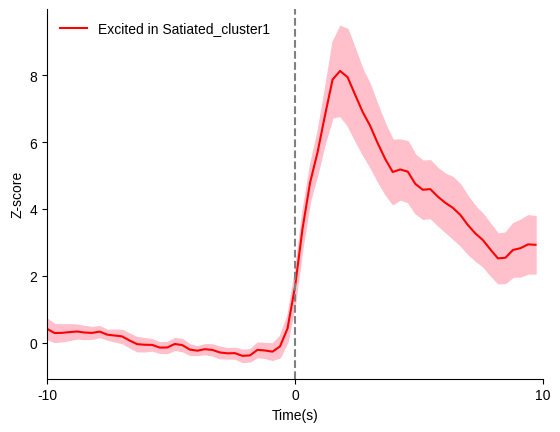

In [358]:
x=np.arange(Bins)
y=excited_satiated_mean_cluster1
err = excited_satiated_sem_cluster1
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Excited in Satiated_cluster1', color = 'red')
ax.fill_between(x, y-err, y+err, color='pink')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.legend(loc = 2, framealpha = 0)
len(excited_satiated_cluster1)

10

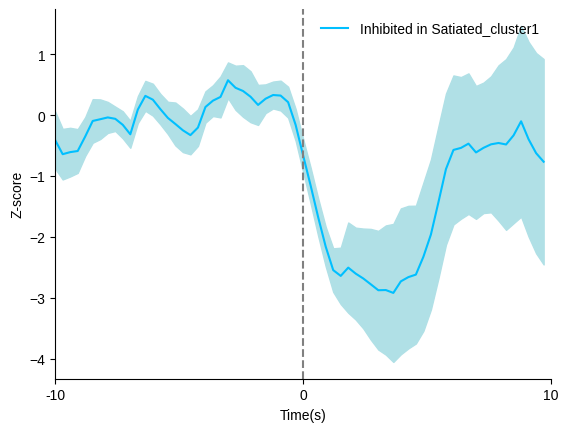

In [359]:
x=np.arange(Bins)
y=inhibited_satiated_mean_cluster1
err = inhibited_satiated_sem_cluster1
fig, ax = plt.subplots()
ax.plot(x, y, label = 'Inhibited in Satiated_cluster1', color = 'deepskyblue', linestyle = '-')
ax.fill_between(x, y-err, y+err, color='powderblue')
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-,1)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


22

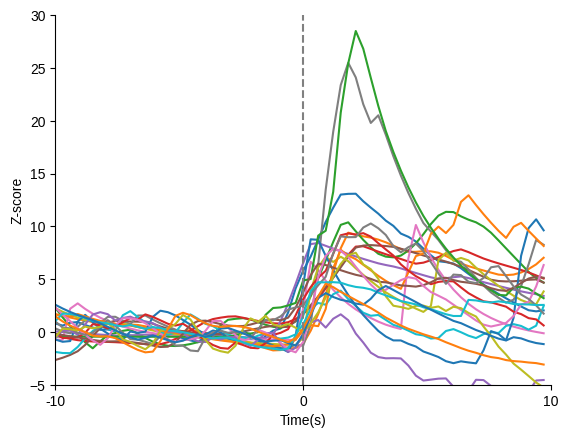

In [360]:
x=np.arange(Bins)
y=excited_satiated_cluster1.iloc[:,4:]
err = excited_hungry_sem_cluster1
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-5,30)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated_cluster1)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


10

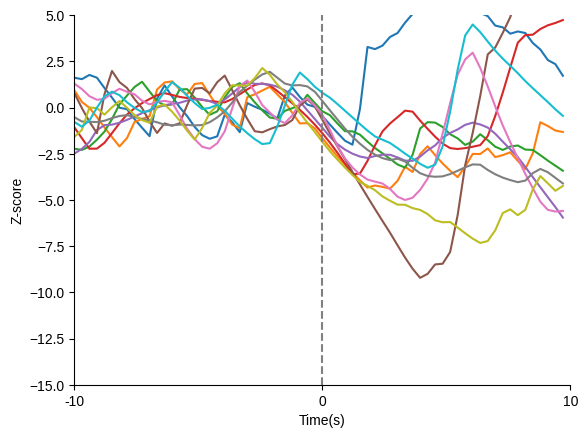

In [361]:
x=np.arange(Bins)
y=inhibited_satiated_cluster1.iloc[:,4:]
err = inhibited_satiated_sem_cluster1
fig, ax = plt.subplots()
for i in range(len(y)):
    ax.plot(x, y.iloc[i,:])
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,Bins_before,Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.set_ylim(-15,5)
ax.axvline(Bins_before, color = 'grey', ls = '--')
ax.legend(loc = 0, framealpha = 0)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster1)

[Text(0, 0, '0'), Text(0, 10, '10')]

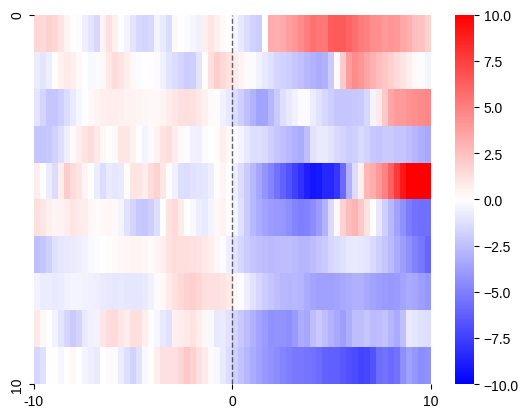

In [362]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
inhibited_satiated_sort = inhibited_satiated_cluster1.copy()
inhibited_satiated_sort['count_gt_2'] = (inhibited_satiated_sort.iloc[:, Bins_before + 4:].astype('float') < -1.98).sum(axis=1)

# Sort the DataFrame based on this count
inhibited_satiated_sorted = inhibited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(inhibited_satiated_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(inhibited_satiated_sorted)])
ax.set_yticklabels([0, len(inhibited_satiated_sorted)])

[Text(0, 0, '0'), Text(0, 22, '22')]

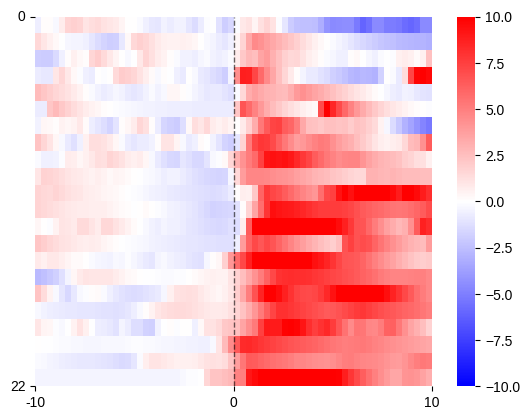

In [363]:
# Calculate the count of bins with value > 2 after int(Bins/2) for each neuron
excited_satiated_sort = excited_satiated_cluster1.copy()
excited_satiated_sort['count_gt_2'] = (excited_satiated_sort.iloc[:, Bins_before + 4:].astype('float') > 1.98).sum(axis=1)

# Sort the DataFrame based on this count
excited_satiated_sorted = excited_satiated_sort.sort_values(by='count_gt_2', ascending=True).drop('count_gt_2', axis=1)

ax = sb.heatmap(excited_satiated_sorted.iloc[:,4:].astype('float'), vmin = -10, vmax= 10, cmap = "bwr")
ax.set_xticks([0,Bins_before,Bins])
ax.axvline(Bins_before, ls = '--', lw = 1, c = 'black', alpha = 0.6)
ax.set_xticklabels([-TimeRange_before, 0, TimeRange_after])
ax.set_yticks([0,len(excited_satiated_sorted)])
ax.set_yticklabels([0, len(excited_satiated_sorted)])

15

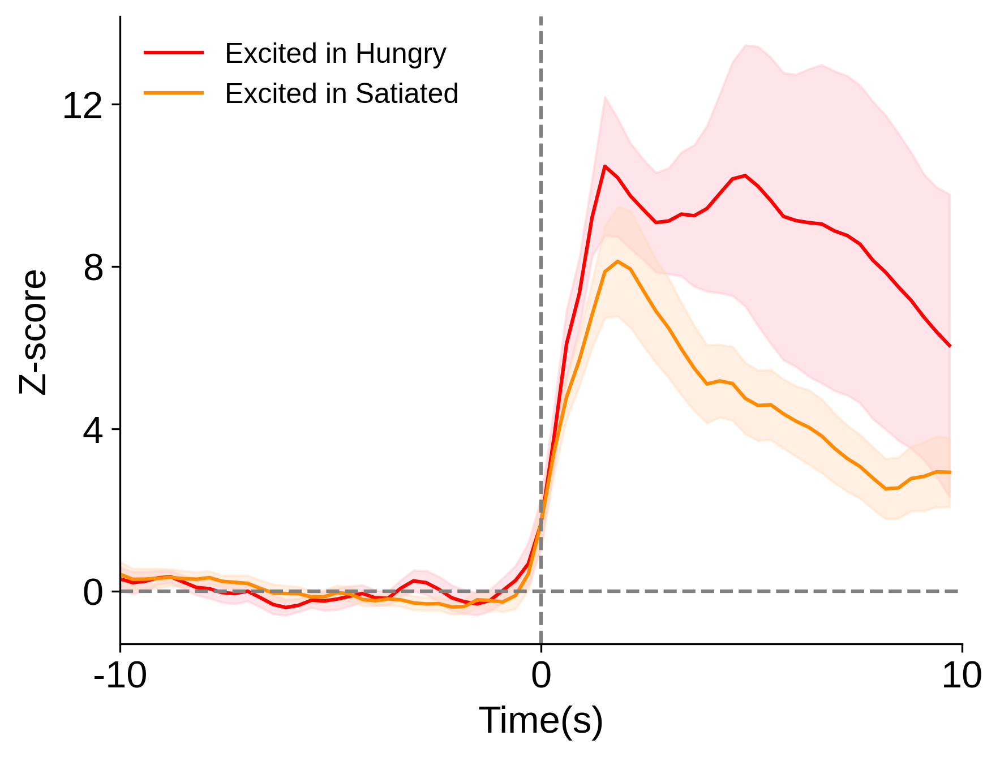

In [364]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster1
z=excited_satiated_mean_cluster1
erry = excited_hungry_sem_cluster1
errz = excited_satiated_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Excited in Satiated', color = 'darkorange')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='peachpuff', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
#ax.set_ylim(0, Bins)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster1)

12

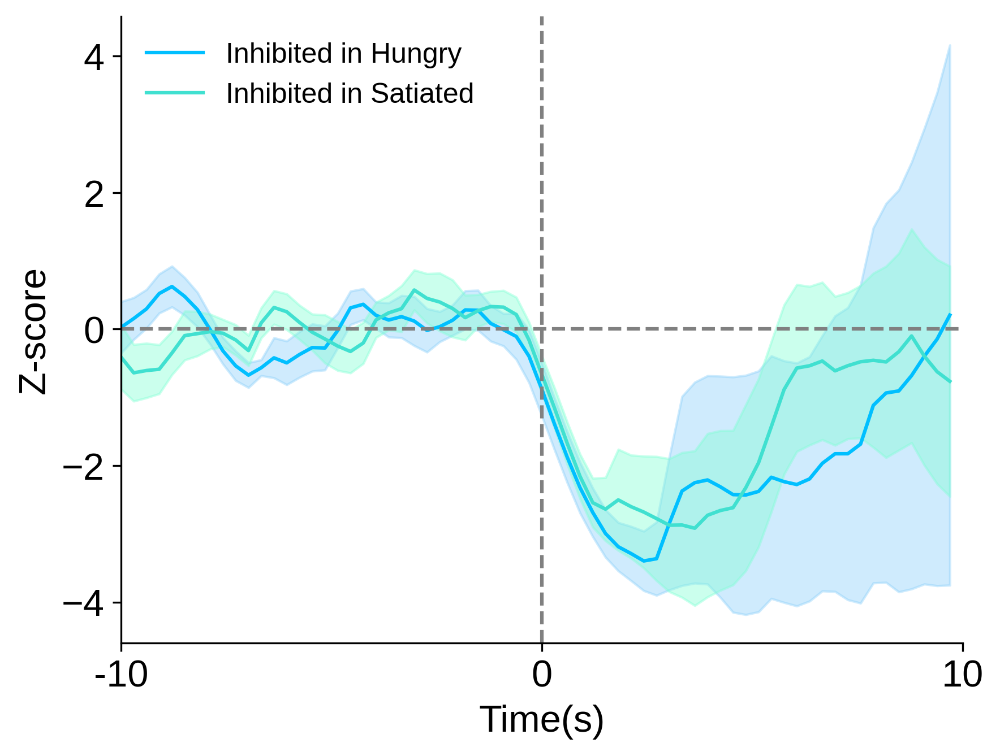

In [365]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster1
z=inhibited_satiated_mean_cluster1
erry = inhibited_hungry_sem_cluster1
errz = inhibited_satiated_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.plot(x, y, label = 'Inhibited in Hungry', color = 'deepskyblue')
ax.plot(x, z, label = 'Inhibited in Satiated', color = 'turquoise')
ax.fill_between(x, y-erry, y+erry, color='lightskyblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='aquamarine', alpha = 0.4)
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 2)
ax.axvline(int((Bins/2)), color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize= 12)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster1)

In [366]:
excited_hungry_insatiated_mean_cluster1 = trace_satiated.iloc[excited_indices_cluster1, 4:].mean(axis=0)
excited_hungry_insatiated_sem_cluster1 =  trace_satiated.iloc[excited_indices_cluster1, 4:].sem(axis=0)
inhibited_hungry_insatiated_mean_cluster1 = trace_satiated.iloc[inhibited_indices_cluster1, 4:].mean(axis=0)
inhibited_hungry_insatiated_sem_cluster1 =  trace_satiated.iloc[inhibited_indices_cluster1, 4:].sem(axis=0)
excited_satiated_inhungry_mean_cluster1 = trace_hungry.iloc[excited_satiated_indices_cluster1, 4:].mean(axis=0)
excited_satiated_inhungry_sem_cluster1 =  trace_hungry.iloc[excited_satiated_indices_cluster1, 4:].sem(axis=0)
inhibited_satiated_inhungry_mean_cluster1 = trace_hungry.iloc[inhibited_satiated_indices_cluster1, 4:].mean(axis=0)
inhibited_satiated_inhungry_sem_cluster1 =  trace_hungry.iloc[inhibited_satiated_indices_cluster1, 4:].sem(axis=0)

In [367]:
trace_hungry.iloc[excited_indices_cluster1, :]

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
1,6S5,2,M,1,1.300211,1.074195,0.573979,0.110636,-0.240893,-0.488262,...,2.944911,2.857944,2.584875,2.047427,2.060740,2.149064,1.723274,2.655658,3.060550,3.285084
6,6S5,8,M,1,0.755368,0.239570,0.632049,1.169772,0.909640,0.342772,...,5.891938,6.484953,6.282840,5.336921,5.599950,6.003926,5.585861,4.997398,4.305344,3.021467
10,6S5,13,M,1,-0.288806,-0.710974,-0.737251,-0.279189,0.683994,1.409912,...,4.352559,3.404175,3.462557,2.558367,2.184381,2.585429,3.101729,2.676781,1.642374,0.323723
13,6S5,17,M,1,0.598231,0.677376,0.722344,0.788024,0.832126,0.754398,...,0.267126,0.041423,0.136707,-0.040584,-0.292054,-0.381404,0.599379,1.403160,1.871256,1.963252
27,6S5,32,M,1,-1.272618,-1.792469,-1.514361,-0.238455,0.375322,0.304668,...,3.634025,6.907566,7.788267,8.289448,9.139957,8.430071,8.596022,7.823630,6.424224,5.424075
44,6S5,51,M,1,0.316848,0.393402,0.413136,0.106892,0.198640,-0.132084,...,4.937470,4.359824,3.690026,3.083262,2.648980,2.336012,2.337634,1.926622,1.347169,0.716797
294,7H6,57,F,1,1.924325,1.300248,0.891984,0.570247,0.201884,0.398492,...,-3.229443,-3.332716,-3.428119,-3.512441,-3.586970,-3.652841,-3.711062,-3.661923,-3.458244,-3.541478
535,6M6,7,F,1,-1.416787,-1.377425,-0.753282,0.187040,1.041250,1.134814,...,11.463592,10.967005,10.544603,10.192538,9.828234,9.378477,8.924522,8.375940,7.841075,7.300593
583,6M6,70,F,1,0.467871,0.270037,0.101439,-0.052837,-0.166271,-0.271151,...,3.141709,2.764046,2.413877,2.089202,1.830658,1.639313,1.440456,1.191103,0.955449,0.719716
590,6M6,80,F,1,-0.947734,-1.009834,-0.948602,-0.923341,-0.825643,-0.777521,...,5.211112,4.544105,3.969632,3.546466,3.198754,2.751081,2.282836,1.868943,1.495306,1.509666


In [368]:
trace_satiated.iloc[excited_indices_cluster1, :]

,Animal_ID,cell_id,Sex,Cluster_Kmeans,0,1,2,3,4,5,...,56,57,58,59,60,61,62,63,64,65
1,6S5,2,M,1,-0.781597,-0.850040,-0.933220,-0.758515,-0.723279,-0.768357,...,4.942090,4.598078,4.218103,3.853804,3.628008,3.303453,3.204487,3.324963,3.227698,3.054948
6,6S5,8,M,1,1.767865,1.611823,1.595358,1.633362,1.309591,0.756444,...,-2.800621,-2.892614,-3.098277,-3.416645,-3.738901,-4.039819,-4.312766,-4.542387,-4.384059,-3.816228
10,6S5,13,M,1,0.386339,-0.128865,-0.276473,0.174676,0.785622,0.726109,...,3.261975,2.701260,2.154216,1.623964,1.109989,0.637116,0.196416,-0.273738,-0.048513,0.132396
13,6S5,17,M,1,-1.556988,-1.486182,-1.314461,-1.094414,-1.235648,-1.500862,...,0.847531,0.762344,0.415194,0.241845,-0.034367,0.047365,0.341711,0.053297,-0.079800,-0.280762
27,6S5,32,M,1,-1.034162,0.522030,0.589324,0.357668,0.087772,-0.245165,...,-1.052578,-0.779352,-0.960687,-1.198594,-1.424113,-1.502461,-1.425531,-0.974711,-0.245984,-0.330740
44,6S5,51,M,1,0.614302,0.318579,0.018440,0.412987,0.443215,0.567294,...,-0.294924,-0.586329,-1.074032,-1.391448,-1.670657,-2.255542,-2.688634,-3.234373,-3.794373,-4.284447
294,7H6,57,F,1,2.022707,2.243561,2.023677,1.689398,1.401226,1.103862,...,-0.342646,-0.437462,-0.521265,-0.589010,-0.588687,-0.634420,-0.694148,-0.708533,-0.756891,-0.807150
535,6M6,7,F,1,-0.513499,-0.502692,-0.292830,0.040904,0.168857,0.005491,...,-0.613828,-0.711603,-0.642963,-0.132543,0.840143,1.913506,2.180285,2.014205,1.858009,1.675057
583,6M6,70,F,1,2.068670,1.658193,1.337549,1.094404,0.873012,0.663630,...,-0.788741,-0.911531,-1.015186,-1.082958,-1.029932,-1.021348,-1.133211,-0.972217,-0.770210,0.611524
590,6M6,80,F,1,0.890827,0.487117,0.353060,0.273827,0.097984,-0.276347,...,6.339470,7.994839,9.179136,8.318958,7.860025,7.359395,6.796897,6.100750,5.120727,3.871093


15

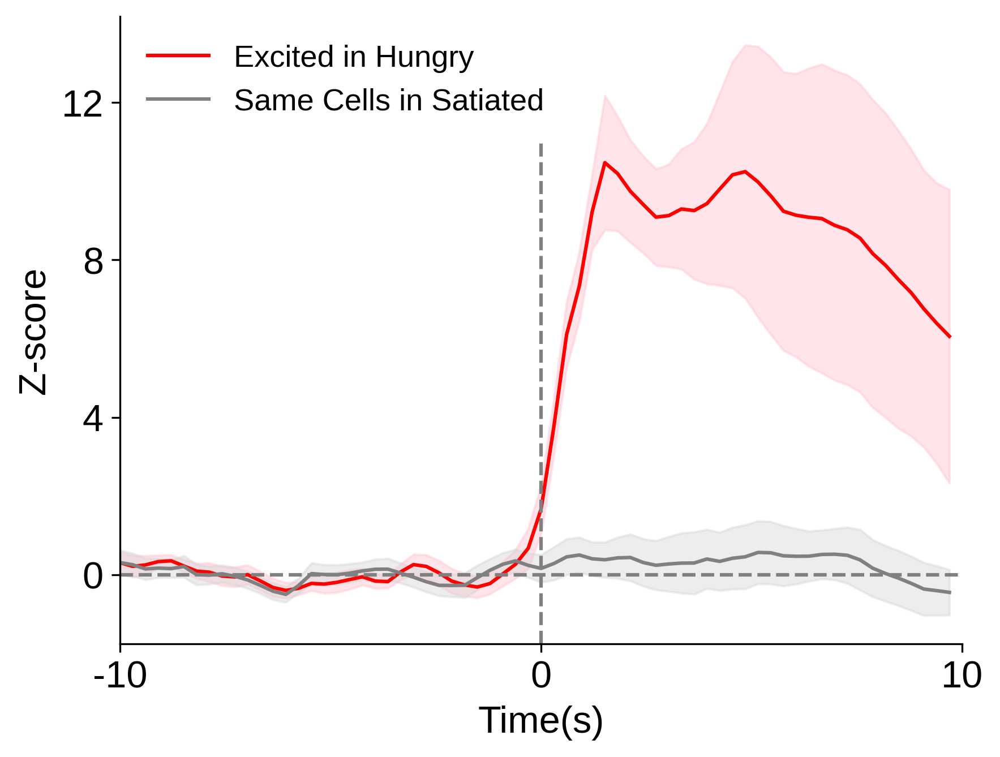

In [369]:
x=np.arange(Bins)
y=excited_hungry_mean_cluster1
z=excited_hungry_insatiated_mean_cluster1
erry = excited_hungry_sem_cluster1
errz = excited_hungry_insatiated_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Hungry', color = 'red')
ax.plot(x, z, label = 'Same Cells in Satiated', color = 'grey')
ax.fill_between(x, y-erry, y+erry, color='pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color='lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-2, 12)
ax.axvline(int((Bins/2)), ymax=0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_hungry_cluster1)

12

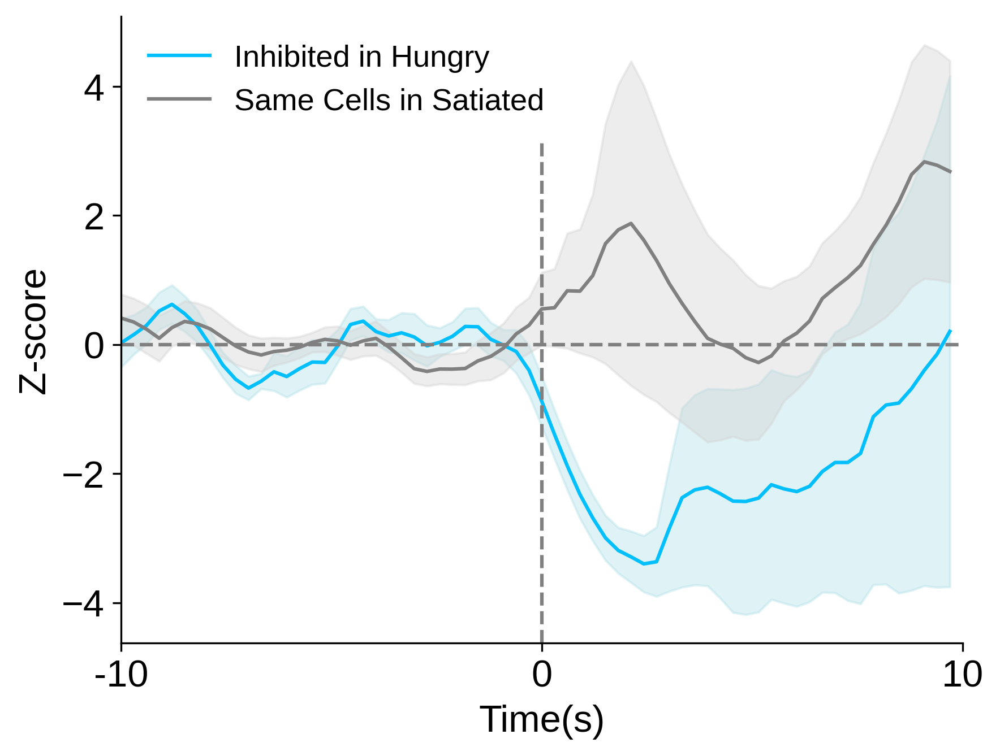

In [370]:
x=np.arange(Bins)
y=inhibited_hungry_mean_cluster1
z=inhibited_hungry_insatiated_mean_cluster1
erry = inhibited_hungry_sem_cluster1
errz = inhibited_hungry_insatiated_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Hungry', color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Satiated', color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xlabel('Time(s)')
ax.set_ylabel('Z-score')
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-4, 3)
ax.axvline(int((Bins/2)), ymax=0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_hungry_cluster1)

22

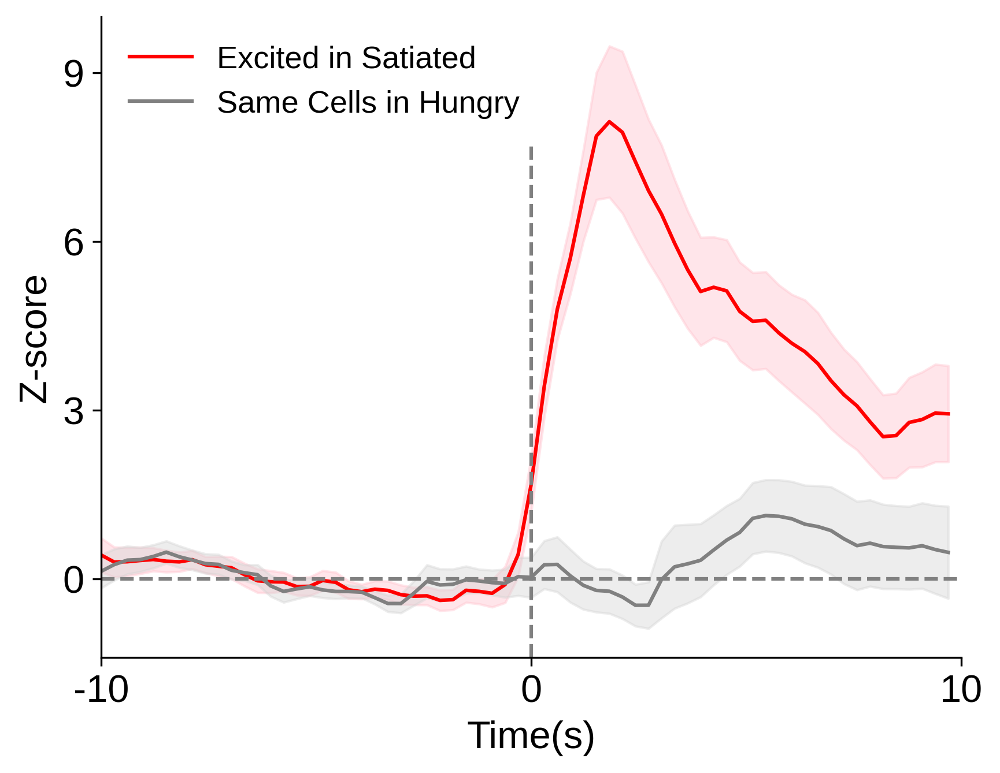

In [371]:
x=np.arange(Bins)
y=excited_satiated_mean_cluster1
z=excited_satiated_inhungry_mean_cluster1
erry = excited_satiated_sem_cluster1
errz = excited_satiated_inhungry_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Excited in Satiated',color='red')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'pink', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
# ax.set_ylim(-3, 12)
ax.axvline(int((Bins/2)), ymax = 0.8,color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(excited_satiated_cluster1)

10

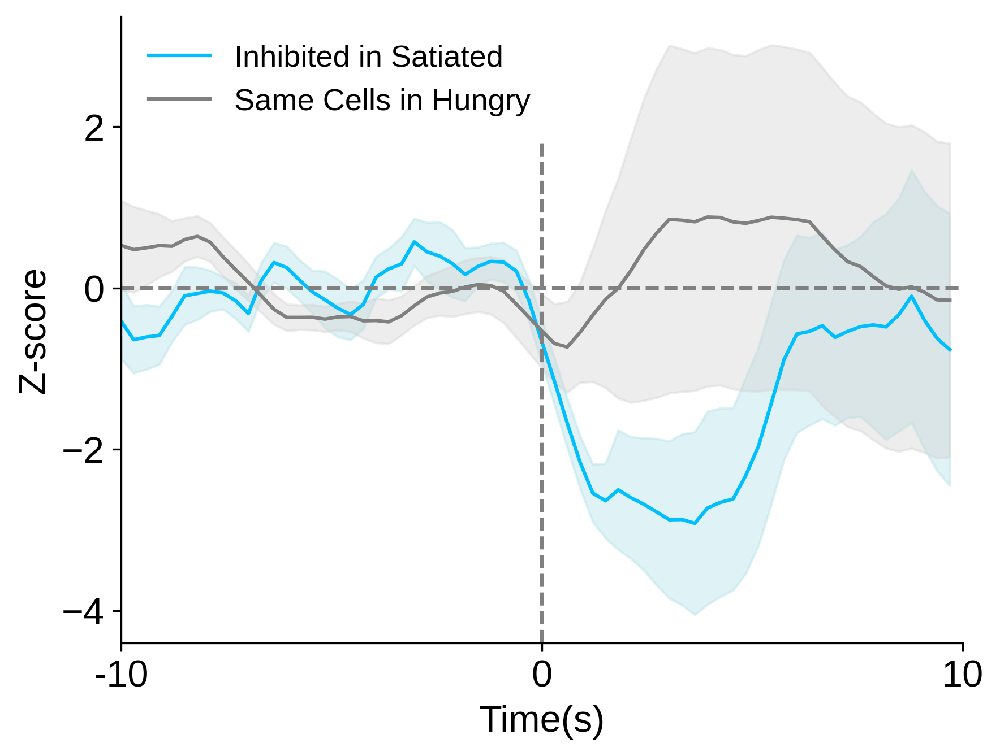

In [372]:
x=np.arange(Bins)
y=inhibited_satiated_mean_cluster1
z=inhibited_satiated_inhungry_mean_cluster1
erry = inhibited_satiated_sem_cluster1
errz = inhibited_satiated_inhungry_sem_cluster1
fig, ax = plt.subplots(dpi =300)
ax.tick_params(labelsize = 16)
ax.yaxis.set_major_locator(MaxNLocator(5,integer=True))
ax.set_xlabel('Time(s)', fontsize = 16)
ax.set_ylabel('Z-score', fontsize = 16)
ax.plot(x, y, label = 'Inhibited in Satiated',color='deepskyblue')
ax.plot(x, z, label = 'Same Cells in Hungry',color='grey')
ax.fill_between(x, y-erry, y+erry, color = 'powderblue', alpha = 0.4)
ax.fill_between(x, z-errz, z+errz, color = 'lightgrey', alpha = 0.4)
ax.set_xticks([0,int((Bins/2)),Bins])
ax.set_xticklabels([-TimeRange_before,'0',TimeRange_after])
ax.set_xlim(0, Bins)
ax.axvline(int((Bins/2)), ymax = 0.8, color = 'grey', ls = '--')
ax.axhline(0, color = 'grey', ls = '--')
ax.legend(loc = 2, framealpha = 0, fontsize = 13)
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
len(inhibited_satiated_cluster1)

Excited category: Odds Ratio = 0.7581920903954802, P-value = 0.48132984491610087
Inhibited category: Odds Ratio = 0.8217299578059072, P-value = 0.5720669050329666
Other category: Odds Ratio = 1.281727986771393, P-value = 0.35675198660802576


/tmp/ipykernel_172376/2433392292.py:132: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['Fully\nSuppressed', 'Persistent\nFeeders'], fontsize = 22)
/tmp/ipykernel_172376/2433392292.py:133: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


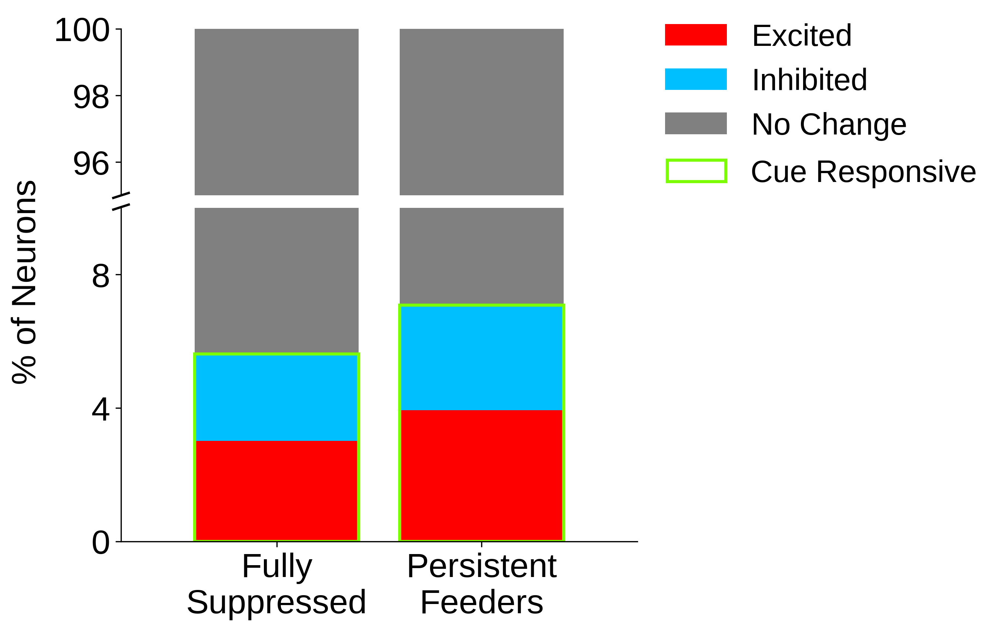

In [445]:
# Sample data - replace these with your actual data
# Assuming these are the lengths of your clusters
len_excited_hungry_cluster0 = len(excited_hungry_cluster0)
len_inhibited_hungry_cluster0 = len(inhibited_hungry_cluster0)
len_trace_hungry_cluster0 = len(trace_hungry_cluster0)

len_excited_hungry_cluster1 = len(excited_hungry_cluster1)
len_inhibited_hungry_cluster1 = len(inhibited_hungry_cluster1)
len_trace_hungry_cluster1 = len(trace_hungry_cluster1)

# Calculate absolute counts for other category
len_other_hungry_cluster0 = len_trace_hungry_cluster0 - len_excited_hungry_cluster0 - len_inhibited_hungry_cluster0
len_other_hungry_cluster1 = len_trace_hungry_cluster1 - len_excited_hungry_cluster1 - len_inhibited_hungry_cluster1

# Calculate proportions for cluster 0
prop_excited_0 = 100*len_excited_hungry_cluster0 / len_trace_hungry_cluster0
prop_inhibited_0 = 100*len_inhibited_hungry_cluster0 / len_trace_hungry_cluster0
prop_other_0 = 100 - (prop_excited_0 + prop_inhibited_0)

# Calculate proportions for cluster 1
prop_excited_1 = 100*len_excited_hungry_cluster1 / len_trace_hungry_cluster1
prop_inhibited_1 = 100*len_inhibited_hungry_cluster1 / len_trace_hungry_cluster1
prop_other_1 = 100 - (prop_excited_1 + prop_inhibited_1)



# Fisher's Exact Test for Excited category
contingency_table_excited = [
    [len_excited_hungry_cluster0, len_trace_hungry_cluster0 - len_excited_hungry_cluster0],
    [len_excited_hungry_cluster1, len_trace_hungry_cluster1 - len_excited_hungry_cluster1]
]
odds_ratio_excited, p_value_excited = fisher_exact(contingency_table_excited)

# Fisher's Exact Test for Inhibited category
contingency_table_inhibited = [
    [len_inhibited_hungry_cluster0, len_trace_hungry_cluster0 - len_inhibited_hungry_cluster0],
    [len_inhibited_hungry_cluster1, len_trace_hungry_cluster1 - len_inhibited_hungry_cluster1]
]
odds_ratio_inhibited, p_value_inhibited = fisher_exact(contingency_table_inhibited)

# Fisher's Exact Test for Other category
contingency_table_other = [
    [len_other_hungry_cluster0, len_trace_hungry_cluster0 - len_other_hungry_cluster0],
    [len_other_hungry_cluster1, len_trace_hungry_cluster1 - len_other_hungry_cluster1]
]
odds_ratio_other, p_value_other = fisher_exact(contingency_table_other)

# Print the results
print(f"Excited category: Odds Ratio = {odds_ratio_excited}, P-value = {p_value_excited}")
print(f"Inhibited category: Odds Ratio = {odds_ratio_inhibited}, P-value = {p_value_inhibited}")
print(f"Other category: Odds Ratio = {odds_ratio_other}, P-value = {p_value_other}")

# plt.show()
# Create a figure with two subplots with different heights
fig = plt.figure(figsize=(6, 6), dpi=300)
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2], hspace=0.05) 
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

# Set the break point
break_point = 10

# Upper plot (for higher values)
ax1.bar('Cluster 0', max(prop_excited_0, break_point), color='red', label='Excited')
ax1.bar('Cluster 0', max(prop_inhibited_0 + prop_excited_0, break_point), bottom=prop_excited_0, color='deepskyblue', label='Inhibited')
ax1.bar('Cluster 0', max(prop_other_0 + prop_inhibited_0 + prop_excited_0, break_point), bottom=prop_inhibited_0 + prop_excited_0, color='grey', label='No Change')
ax1.bar('Cluster 1', max(prop_excited_1, break_point), color='red')
ax1.bar('Cluster 1', max(prop_inhibited_1 + prop_excited_1, break_point), bottom=prop_excited_1, color='deepskyblue')
ax1.bar('Cluster 1', max(prop_other_1 + prop_inhibited_1 + prop_excited_1, break_point), bottom=prop_inhibited_1 + prop_excited_1, color='grey')
ax1.yaxis.set_major_locator(MaxNLocator(3,integer=True))

# Lower plot (for lower values)
ax2.bar('Cluster 0', prop_excited_0, color='red')
ax2.bar('Cluster 0', prop_inhibited_0, bottom=prop_excited_0, color='deepskyblue')
ax2.bar('Cluster 0', prop_other_0, bottom=prop_inhibited_0 + prop_excited_0, color='grey')
ax2.bar('Cluster 1', prop_excited_1, color='red')
ax2.bar('Cluster 1', prop_inhibited_1, bottom=prop_excited_1, color='deepskyblue')
ax2.bar('Cluster 1', prop_other_1, bottom=prop_inhibited_1 + prop_excited_1, color='grey')
ax2.yaxis.set_major_locator(MaxNLocator(3,integer=True))

# Set y-axis limits
ax1.set_ylim(95, 100)
ax2.set_ylim(0, break_point)

# Hide the spines and ticks of the upper plot
ax1.spines['bottom'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis = 'x', top= False, bottom = False, labeltop=False, labelbottom = False)  # don't put tick labels at the top
ax1.tick_params(axis = 'y', labelsize = 22)  # don't put tick labels at the top

ax2.xaxis.tick_bottom()

# Set other plot attributes
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
fig.text(-0.04, 0.5, '% of Neurons', va='center', rotation='vertical', fontsize=22)

ax2.tick_params(labelsize = 22)  # don't put tick labels at the top
# ax2.set_title('Proportions by Cluster and Type')
ax1.legend(loc=0, framealpha=0, fontsize=20, bbox_to_anchor=(1, 1.2))

ax1.margins(0.2)
ax2.margins(0.2)

# Add diagonal lines to indicate the break
d = .015  # Size of diagonal lines
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((-d, +d), (-d, +d), **kwargs)        # Top-left diagonal
ax2.plot((-d, d), (-d-0.07, +d-0.07), **kwargs)        # Top-left diagonal

# Add significance markers
def add_significance_marker(p_value, cluster, category_height):
    if p_value < 0.05:
        ax2.text(cluster, category_height, '*', ha='center', va='center', fontsize=28)

add_significance_marker(p_value_excited, 'Cluster 1', prop_excited_1 / 2)
add_significance_marker(p_value_inhibited, 'Cluster 1', prop_excited_1 + prop_inhibited_1 / 2)

# Draw a single green box for each cluster that covers both 'Excited' and 'Inhibited' categories
def draw_green_box(ax, x_positions, excited_height, inhibited_height):
    for x in x_positions:
        total_height = excited_height + inhibited_height
        rect = Rectangle((x - 0.4, 0), 0.8, total_height, linewidth=2, edgecolor='lawngreen', facecolor='none')
        ax.add_patch(rect)
        rect_legend = Rectangle((x - 0.4, -0.1), 0, total_height, linewidth=2, edgecolor='lawngreen', facecolor='none')

    ax.legend([rect_legend], ['Cue Responsive'], framealpha=0, fontsize=20, bbox_to_anchor=(1.004, 1.23), handlelength = 1.9)

draw_green_box(ax2, [0], prop_excited_0, prop_inhibited_0)
draw_green_box(ax2, [1], prop_excited_1, prop_inhibited_1)
ax2.set_xticklabels(['Fully\nSuppressed', 'Persistent\nFeeders'], fontsize = 22)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_percentage_hungry.svg", transparent=True)


plt.show()


Excited category: Odds Ratio = 0.4360695563227209, P-value = 0.011143452805020725
Inhibited category: Odds Ratio = 0.4110803324099723, P-value = 0.07709364630817274
Other category: Odds Ratio = 2.3873501008171494, P-value = 0.001679850286447074


/tmp/ipykernel_172376/73614942.py:133: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax2.set_xticklabels(['Fully\nSuppressed', 'Persistent\nFeeders'] , fontsize = 22)
/tmp/ipykernel_172376/73614942.py:134: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


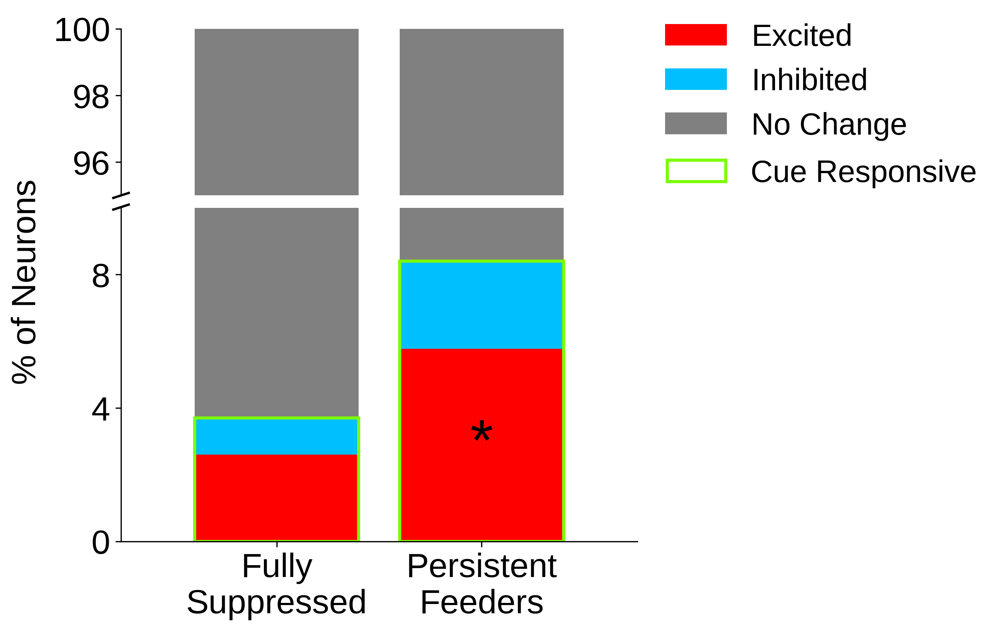

In [446]:
# Sample data - replace these with your actual data
# Assuming these are the lengths of your clusters
len_excited_satiated_cluster0 = len(excited_satiated_cluster0)
len_inhibited_satiated_cluster0 = len(inhibited_satiated_cluster0)
len_trace_satiated_cluster0 = len(trace_satiated_cluster0)

len_excited_satiated_cluster1 = len(excited_satiated_cluster1)
len_inhibited_satiated_cluster1 = len(inhibited_satiated_cluster1)
len_trace_satiated_cluster1 = len(trace_satiated_cluster1)

# Calculate absolute counts for other category
len_other_satiated_cluster0 = len_trace_satiated_cluster0 - len_excited_satiated_cluster0 - len_inhibited_satiated_cluster0
len_other_satiated_cluster1 = len_trace_satiated_cluster1 - len_excited_satiated_cluster1 - len_inhibited_satiated_cluster1

# Calculate proportions for cluster 0
prop_excited_0 = 100*len_excited_satiated_cluster0 / len_trace_satiated_cluster0
prop_inhibited_0 = 100*len_inhibited_satiated_cluster0 / len_trace_satiated_cluster0
prop_other_0 = 100 - (prop_excited_0 + prop_inhibited_0)

# Calculate proportions for cluster 1
prop_excited_1 = 100*len_excited_satiated_cluster1 / len_trace_satiated_cluster1
prop_inhibited_1 = 100*len_inhibited_satiated_cluster1 / len_trace_satiated_cluster1
prop_other_1 = 100 - (prop_excited_1 + prop_inhibited_1)



# Fisher's Exact Test for Excited category
contingency_table_excited = [
    [len_excited_satiated_cluster0, len_trace_satiated_cluster0 - len_excited_satiated_cluster0],
    [len_excited_satiated_cluster1, len_trace_satiated_cluster1 - len_excited_satiated_cluster1]
]
odds_ratio_excited, p_value_excited = fisher_exact(contingency_table_excited)

# Fisher's Exact Test for Inhibited category
contingency_table_inhibited = [
    [len_inhibited_satiated_cluster0, len_trace_satiated_cluster0 - len_inhibited_satiated_cluster0],
    [len_inhibited_satiated_cluster1, len_trace_satiated_cluster1 - len_inhibited_satiated_cluster1]
]
odds_ratio_inhibited, p_value_inhibited = fisher_exact(contingency_table_inhibited)

# Fisher's Exact Test for Other category
contingency_table_other = [
    [len_other_satiated_cluster0, len_trace_satiated_cluster0 - len_other_satiated_cluster0],
    [len_other_satiated_cluster1, len_trace_satiated_cluster1 - len_other_satiated_cluster1]
]
odds_ratio_other, p_value_other = fisher_exact(contingency_table_other)

# Print the results
print(f"Excited category: Odds Ratio = {odds_ratio_excited}, P-value = {p_value_excited}")
print(f"Inhibited category: Odds Ratio = {odds_ratio_inhibited}, P-value = {p_value_inhibited}")
print(f"Other category: Odds Ratio = {odds_ratio_other}, P-value = {p_value_other}")

# plt.show()
# Create a figure with two subplots with different heights
fig = plt.figure(figsize=(6, 6), dpi=300)
gs = gridspec.GridSpec(2, 1, height_ratios=[1, 2], hspace=0.05) 
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])

# Set the break point
break_point = 10

# Upper plot (for higher values)
ax1.bar('Cluster 0', max(prop_excited_0, break_point), color='red', label='Excited')
ax1.bar('Cluster 0', max(prop_inhibited_0 + prop_excited_0, break_point), bottom=prop_excited_0, color='deepskyblue', label='Inhibited')
ax1.bar('Cluster 0', max(prop_other_0 + prop_inhibited_0 + prop_excited_0, break_point), bottom=prop_inhibited_0 + prop_excited_0, color='grey', label='No Change')
ax1.bar('Cluster 1', max(prop_excited_1, break_point), color='red')
ax1.bar('Cluster 1', max(prop_inhibited_1 + prop_excited_1, break_point), bottom=prop_excited_1, color='deepskyblue')
ax1.bar('Cluster 1', max(prop_other_1 + prop_inhibited_1 + prop_excited_1, break_point), bottom=prop_inhibited_1 + prop_excited_1, color='grey')
ax1.yaxis.set_major_locator(MaxNLocator(3,integer=True))

# Lower plot (for lower values)
ax2.bar('Cluster 0', prop_excited_0, color='red')
ax2.bar('Cluster 0', prop_inhibited_0, bottom=prop_excited_0, color='deepskyblue')
ax2.bar('Cluster 0', prop_other_0, bottom=prop_inhibited_0 + prop_excited_0, color='grey')
ax2.bar('Cluster 1', prop_excited_1, color='red')
ax2.bar('Cluster 1', prop_inhibited_1, bottom=prop_excited_1, color='deepskyblue')
ax2.bar('Cluster 1', prop_other_1, bottom=prop_inhibited_1 + prop_excited_1, color='grey')
ax2.yaxis.set_major_locator(MaxNLocator(3,integer=True))


# Set y-axis limits
ax1.set_ylim(95, 100)
ax2.set_ylim(0, break_point)

# Hide the spines and ticks of the upper plot
ax1.spines['bottom'].set_visible(False)
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.tick_params(axis = 'x', top= False, bottom = False, labeltop=False, labelbottom = False)  # don't put tick labels at the top
ax1.tick_params(axis = 'y', labelsize = 22)  # don't put tick labels at the top

ax2.xaxis.tick_bottom()

# Set other plot attributes
ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
fig.text(-0.04, 0.5, '% of Neurons', va='center', rotation='vertical', fontsize=22)

ax2.tick_params(labelsize = 22)  # don't put tick labels at the top
# ax2.set_title('Proportions by Cluster and Type')
ax1.legend(loc=0, framealpha=0, fontsize=20, bbox_to_anchor=(1, 1.2))

ax1.margins(0.2)
ax2.margins(0.2)

# Add diagonal lines to indicate the break
d = .015  # Size of diagonal lines
kwargs = dict(transform=ax1.transAxes, color='k', clip_on=False)
ax1.plot((-d, +d), (-d, +d), **kwargs)        # Top-left diagonal
ax2.plot((-d, d), (-d-0.07, +d-0.07), **kwargs)        # Top-left diagonal

# Add significance markers
def add_significance_marker(p_value, cluster, category_height):
    if p_value < 0.05:
        ax2.text(cluster, category_height, '*', ha='center', va='center', fontsize=38)

add_significance_marker(p_value_excited, 'Cluster 1', prop_excited_1 / 2)
add_significance_marker(p_value_inhibited, 'Cluster 1', prop_excited_1 + prop_inhibited_1 / 2)

# Draw a single green box for each cluster that covers both 'Excited' and 'Inhibited' categories
def draw_green_box(ax, x_positions, excited_height, inhibited_height):
    for x in x_positions:
        total_height = excited_height + inhibited_height
        rect = Rectangle((x - 0.4, 0), 0.8, total_height, linewidth=2, edgecolor='lawngreen', facecolor='none')
        ax.add_patch(rect)
        rect_legend = Rectangle((x - 0.4, -0.1), 0, total_height, linewidth=2, edgecolor='lawngreen', facecolor='none')

    ax.legend([rect_legend], ['Cue Responsive'], framealpha=0, fontsize=20, bbox_to_anchor=(1.004, 1.23), handlelength = 1.9)

draw_green_box(ax2, [0], prop_excited_0, prop_inhibited_0)
draw_green_box(ax2, [1], prop_excited_1, prop_inhibited_1)
ax2.set_xticklabels(['Fully\nSuppressed', 'Persistent\nFeeders'] , fontsize = 22)
plt.tight_layout()
plt.savefig("/scratch/09117/xz6783/Xu/Plots/Fig3/fig3_percentage_satiated.svg", transparent=True)


plt.show()

In [375]:
# Fisher's Exact Test for Excited category
contingency_table_excited = [
    [len_excited_hungry_cluster0, len_trace_hungry_cluster0 - len_excited_hungry_cluster0],
    [len_excited_satiated_cluster0, len_trace_satiated_cluster0 - len_excited_satiated_cluster0]
]
odds_ratio_excited, p_value_excited = fisher_exact(contingency_table_excited)

# Fisher's Exact Test for Inhibited category
contingency_table_inhibited = [
    [len_inhibited_hungry_cluster0, len_trace_hungry_cluster0 - len_inhibited_hungry_cluster0],
    [len_inhibited_satiated_cluster0, len_trace_satiated_cluster0 - len_inhibited_satiated_cluster0]
]
odds_ratio_inhibited, p_value_inhibited = fisher_exact(contingency_table_inhibited)

# Fisher's Exact Test for Other category
contingency_table_other = [
    [len_other_hungry_cluster0, len_trace_hungry_cluster0 - len_other_hungry_cluster0],
    [len_other_satiated_cluster0, len_trace_satiated_cluster0 - len_other_satiated_cluster0]
]
odds_ratio_other, p_value_other = fisher_exact(contingency_table_other)

# Print the results
print(f"Excited category: Odds Ratio = {odds_ratio_excited}, P-value = {p_value_excited}")
print(f"Inhibited category: Odds Ratio = {odds_ratio_inhibited}, P-value = {p_value_inhibited}")
print(f"Other category: Odds Ratio = {odds_ratio_other}, P-value = {p_value_other}")


Excited category: Odds Ratio = 1.1628010704727922, P-value = 0.7518063129764337
Inhibited category: Odds Ratio = 2.411744022503516, P-value = 0.05009402404113145
Other category: Odds Ratio = 0.645422058772508, P-value = 0.10578685269514448


In [376]:
# Fisher's Exact Test for Excited category
contingency_table_excited = [
    [len_excited_hungry_cluster1, len_trace_hungry_cluster1 - len_excited_hungry_cluster1],
    [len_excited_satiated_cluster1, len_trace_satiated_cluster1 - len_excited_satiated_cluster1]
]
odds_ratio_excited, p_value_excited = fisher_exact(contingency_table_excited)

# Fisher's Exact Test for Inhibited category
contingency_table_inhibited = [
    [len_inhibited_hungry_cluster1, len_trace_hungry_cluster1 - len_inhibited_hungry_cluster1],
    [len_inhibited_satiated_cluster1, len_trace_satiated_cluster1 - len_inhibited_satiated_cluster1]
]
odds_ratio_inhibited, p_value_inhibited = fisher_exact(contingency_table_inhibited)

# Fisher's Exact Test for Other category
contingency_table_other = [
    [len_other_hungry_cluster1, len_trace_hungry_cluster1 - len_other_hungry_cluster1],
    [len_other_satiated_cluster1, len_trace_satiated_cluster1 - len_other_satiated_cluster1]
]
odds_ratio_other, p_value_other = fisher_exact(contingency_table_other)

# Print the results
print(f"Excited category: Odds Ratio = {odds_ratio_excited}, P-value = {p_value_excited}")
print(f"Inhibited category: Odds Ratio = {odds_ratio_inhibited}, P-value = {p_value_inhibited}")
print(f"Other category: Odds Ratio = {odds_ratio_other}, P-value = {p_value_other}")


Excited category: Odds Ratio = 0.6687779433681073, P-value = 0.3119121014977816
Inhibited category: Odds Ratio = 1.2065040650406504, P-value = 0.8293317868672034
Other category: Odds Ratio = 1.2021649156319643, P-value = 0.5880324471674828
